In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils as utils
import torchvision.transforms as transforms

from torch.autograd import Variable

import os
import time

from PIL.Image import BICUBIC
from torchvision.datasets import MNIST
from ram import RecurrentAttentionModel
from trainer import *

### MNIST dataset
Testing out this model and training algorithm implementation on the basic MNIST dataset, which is pretty simple so hopefully everything goes well.

In [2]:
num_train_data_copies = 1  # Number of times to load the training dataset (with augmentation)
num_eval_data_copies = 1   # Number of times to load the evaluation dataset (with augmentation)
test_val_split = 0.5       # Percentage of the test set to use as validation data
batch_size = 20            # Batch size for training
eval_batch_size = 20       # Batch size for validation and testing

# Image parameters
num_classes = 10       # Digits 0-9
image_size = 28        # MNIST images are 28x28 b/w images
in_channels = 1        # Number of color channels in the inputs (MNIST dataset is grayscale)

glimpse_sizes = [8]  #[5, 10, 18]
padding = int(np.ceil(glimpse_sizes[-1] / 2))
padded_img_size = image_size + 2*padding

In [3]:
# Down/load MNIST data
mnist_data_loc = os.path.join('data', 'mnist')
data_transforms = transforms.Compose([ # Keep things pretty basic for now
    # Pad images with 0s so the GlimpseSensor won't have to
    transforms.Pad(padding = padding),
    # Converts a PIL Image or numpy.ndarray (H x W x C) in the range [0, 255]
    # to a torch.FloatTensor of shape (C x H x W) in the range [0.0, 1.0]
    transforms.ToTensor(),
])

'''
Can increase the number of images in each dataset by loading up the data again,
applying the (random) transformations, then concatenating it all together
'''
### Training Dataset and DataLoader
all_train_datasets = [
    MNIST(
        root = mnist_data_loc, train = True,
        download = True, transform = data_transforms
    ) for _ in range(num_train_data_copies)
]
train_datasets = utils.data.ConcatDataset(all_train_datasets)
train_data = utils.data.DataLoader(train_datasets, batch_size = batch_size, shuffle = True)
num_train_data = len(train_datasets)
num_train_batches = len(train_data)

### Validation and Test Dataset and DataLoader
all_eval_datasets = [
    MNIST(
        root = mnist_data_loc, train = False,
        download = True, transform = data_transforms
    ) for _ in range(num_eval_data_copies)
]
eval_datasets = utils.data.ConcatDataset(all_eval_datasets)
num_eval_data = len(eval_datasets)

eval_split_pt = int(test_val_split * num_eval_data)
eval_idx = list(range(num_eval_data))
np.random.shuffle(eval_idx)

val_idx, test_idx = eval_idx[:eval_split_pt], eval_idx[eval_split_pt:]

val_sampler = utils.data.sampler.SubsetRandomSampler(val_idx)
val_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = val_sampler
)
num_val_data = len(val_sampler)
num_val_batches = len(val_data)

test_sampler = utils.data.sampler.SubsetRandomSampler(test_idx)
test_data = utils.data.DataLoader(
    eval_datasets, batch_size = eval_batch_size, sampler = test_sampler
)
num_test_data = len(test_sampler)
num_test_batches = len(test_data)

print('Num:\n- train data: %d (%d batches)\n- val data: %d (%d batches)\n- test data: %d (%d batches)' % (
    num_train_data, num_train_batches, num_val_data, num_val_batches, num_test_data, num_test_batches
))

Num:
- train data: 60000 (3000 batches)
- val data: 5000 (250 batches)
- test data: 5000 (250 batches)


In [4]:
# Basic training hyperparameters
lr = 1e-3
grad_clip = 4
lr_step_size = 1
steps_per_epoch = int(num_train_data_copies * 15)  # Number of times to step the lr scheduler in an epoch
decay_rate = 0.99

# RL training hyperparameters
end_train_ep_early = False     # End each training episode early after a correct classification
assert (end_train_ep_early and batch_size == 1) or not end_train_ep_early
max_ep_len = 6                 # Maximum number of glimpses per episode
num_epochs = 400               # Number of times to go through all of the training examples
early_stopping = int(num_epochs * 0.02)

random_start_loc = True
error_penalty = 0.  # Amount of penalty to apply each time the agent makes an incorrect classification (<= 0.)
gamma = 1.0         # Reward discount factor

# Etc
log_freq = num_train_batches // 6    # How often to print a training log in an epoch
viz_freq = num_train_batches // 3     # How often to visualize the glimpses in an epoch
eval_viz_freq = num_val_batches // 2  # How often to visualize the glimpses in an epoch

### Model
Need to modify class implementation so that any recurrent `nn.Module` instance can be passed in when initializing a new `RecurrentAttentionModel` to make it easier to try this visual attention mechanism out with different core recurrent networks.

In [5]:
# Model hyperparameters
glimpse_g_size = 128    # Size of the transformed Glimpse representation in the GlimpseNetwork
loc_g_size = 128        # Size of the transformed location representation in the GlimpseNetwork
glimpse_net_size = 256  # Size of the GlimpseNetwork output
rnn_state_size = 256
sensor_size = 8         # Size of the glimpses after resizing
g_rep_op = 'add'

dropout = 0.0
# Standard deviation to use when sampling the glimpse location coordinates from a normal distribution
loc_std = 0.22

In [6]:
# Initialize the network
model = RecurrentAttentionModel(
    image_size = image_size, in_channels = in_channels,
    glimpse_g_size = glimpse_g_size, loc_g_size = loc_g_size,
    glimpse_net_size = glimpse_net_size, g_rep_op = g_rep_op,
    rnn_state_size = rnn_state_size, num_actions = num_classes,
    sensor_size = sensor_size, glimpse_sizes = glimpse_sizes,
    pad_imgs = False, padding = padding, dropout = dropout
)
num_parameters = sum([p.numel() for p in model.parameters()])
print('Model has %d parameters' % num_parameters)

# Criterion, optimizer, learning rate scheduler
class_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = lr)
lr_scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma = decay_rate)

Model has 604173 parameters


Epoch   1/400) lr = 0.001
 b    500/  3000 >> 134.8 ms/b | lr: 9.80e-04 | grad 2norm:  6.84 | grad inf norm:  3.263
       Weights || abs max:  0.35 (19895.12) | mean: -2.48e-04 ( 0.12) | var: 2.16e-03 (22511.07)
        Biases || abs max:  0.16 ( 7454.19) | mean:  7.58e-03 ( 8.81) | var: 2.96e-04 (1399961.38)
                  class loss: 1.619 | steps: 4.012 | reward:  0.431 | acc.: 43.07%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.3 ms/b | lr: 9.61e-04 | grad 2norm:  7.42 | grad inf norm:  2.521
       Weights || abs max:  0.42 (85647.34) | mean: -2.07e-03 ( 0.23) | var: 3.11e-03 (1057982.38)
        Biases || abs max:  0.37 (59380.58) | mean:  1.20e-02 (48.82) | var: 7.30e-04 (685770432.00)
                  class loss: 1.085 | steps: 3.390 | reward:  0.618 | acc.: 61.78%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewar

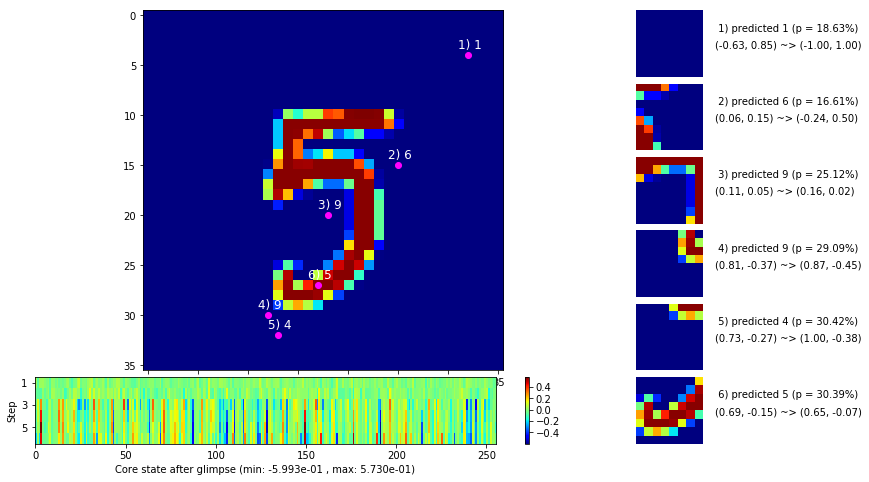

 b   1500/  3000 >> 139.8 ms/b | lr: 9.32e-04 | grad 2norm:  7.17 | grad inf norm:  2.241
       Weights || abs max:  0.50 (25970.72) | mean: -3.65e-03 ( 0.13) | var: 3.93e-03 (17849.42)
        Biases || abs max:  0.51 ( 4813.14) | mean:  1.34e-02 ( 5.55) | var: 1.12e-03 (145561.36)
                  class loss: 0.844 | steps: 3.085 | reward:  0.709 | acc.: 70.93%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.4 ms/b | lr: 9.14e-04 | grad 2norm:  6.84 | grad inf norm:  2.206
       Weights || abs max:  0.55 (25631.28) | mean: -5.03e-03 ( 0.12) | var: 4.68e-03 (35109.92)
        Biases || abs max:  0.60 ( 2898.42) | mean:  1.29e-02 ( 3.86) | var: 1.43e-03 (54703.39)
                  class loss: 0.681 | steps: 2.891 | reward:  0.763 | acc.: 76.33%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

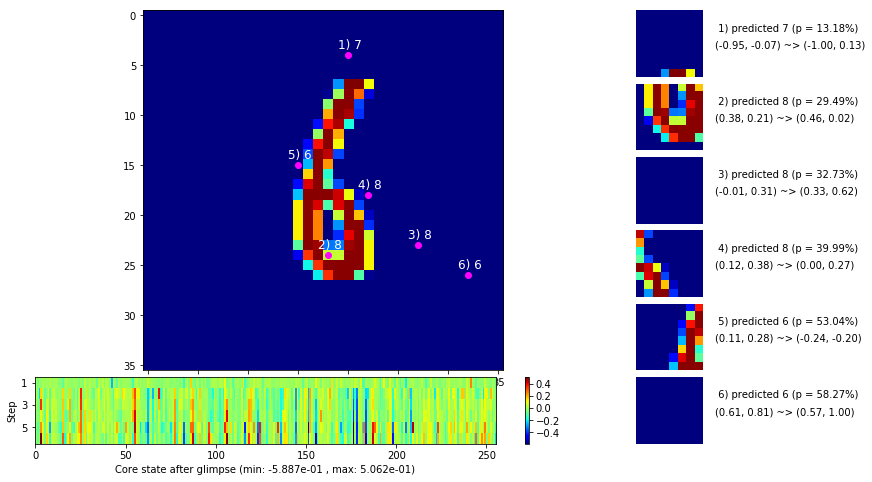

 b   2500/  3000 >> 141.4 ms/b | lr: 8.86e-04 | grad 2norm:  6.86 | grad inf norm:  2.096
       Weights || abs max:  0.59 (35638.84) | mean: -5.69e-03 ( 0.13) | var: 5.32e-03 (122248.83)
        Biases || abs max:  0.66 ( 3344.39) | mean:  1.24e-02 ( 3.45) | var: 1.81e-03 (106469.48)
                  class loss: 0.614 | steps: 2.832 | reward:  0.785 | acc.: 78.52%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.9 ms/b | lr: 8.69e-04 | grad 2norm:  7.25 | grad inf norm:  2.178
       Weights || abs max:  0.62 (44037.57) | mean: -6.21e-03 ( 0.14) | var: 5.91e-03 (271010.97)
        Biases || abs max:  0.71 ( 3536.62) | mean:  1.20e-02 ( 3.16) | var: 2.13e-03 (504383.75)
                  class loss: 0.597 | steps: 2.747 | reward:  0.791 | acc.: 79.15%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

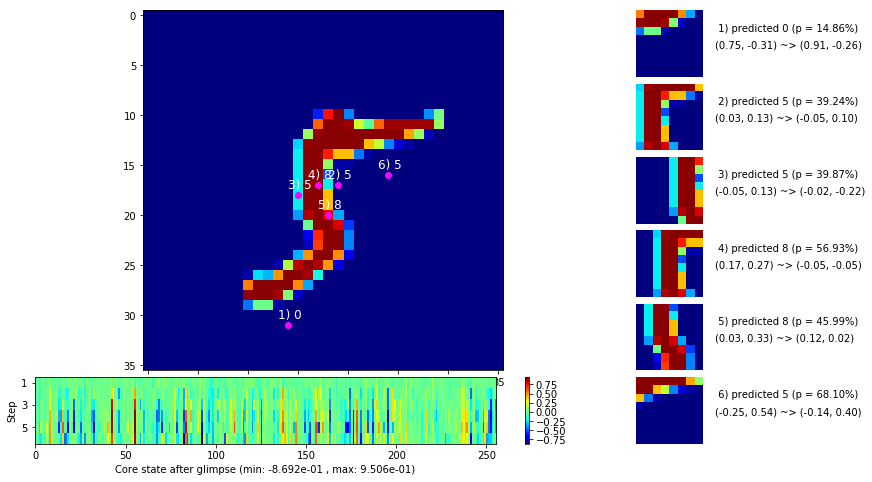

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


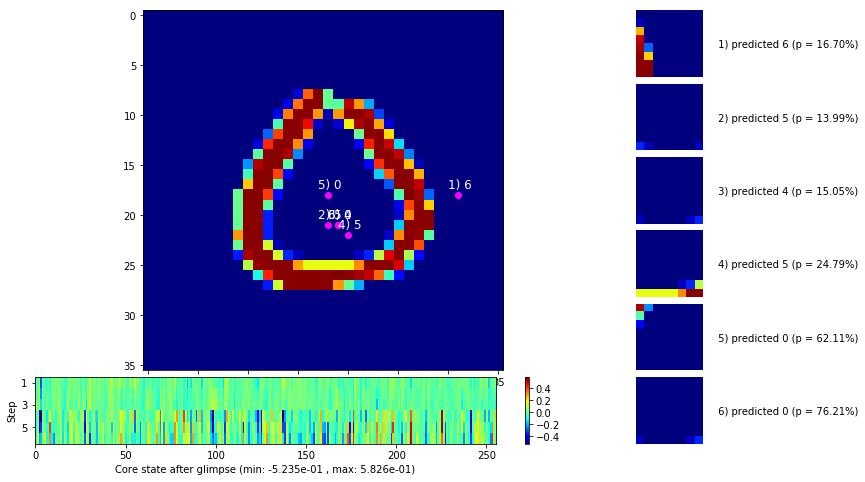


	Target class: 8  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


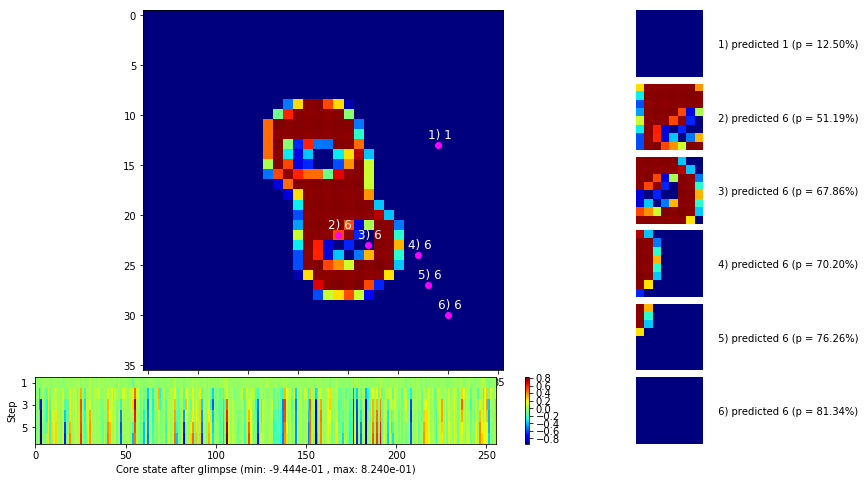

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


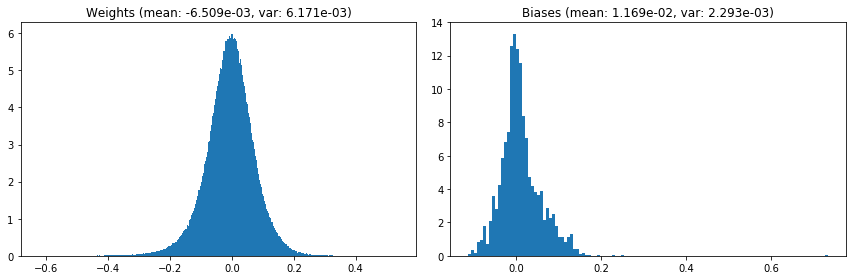

                                      Location network weights and biases


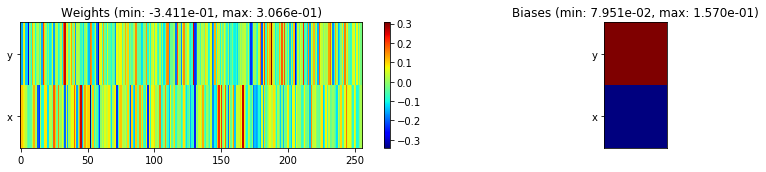

---------------------------------------------------------------------------------------------------------------
Elapsed time:  413.30 sec | TRAIN >> class loss: 0.9067 | steps:  3.160    | reward:  0.6830    | acc.: 68.297% 
                          | VAL   >> class loss: 0.5852 | steps:  2.517    | reward:  0.7996    | acc.: 79.960% 


Epoch   2/400) lr = 0.0008601
 b    500/  3000 >> 134.5 ms/b | lr: 8.43e-04 | grad 2norm:  6.96 | grad inf norm:  2.051
       Weights || abs max:  0.66 (28838.15) | mean: -6.54e-03 ( 0.11) | var: 6.43e-03 (75826.40)
        Biases || abs max:  0.75 ( 4022.99) | mean:  1.17e-02 ( 3.73) | var: 2.40e-03 (678208.88)
                  class loss: 0.516 | steps: 2.626 | reward:  0.829 | acc.: 82.90%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.2 ms/b | lr: 8.26e-04 | grad 2norm:  6.76 | grad inf norm:  1.974
       Weights || abs max:  0.68 (16178.17) | mean: -6.90e-03 ( 0.09) | va

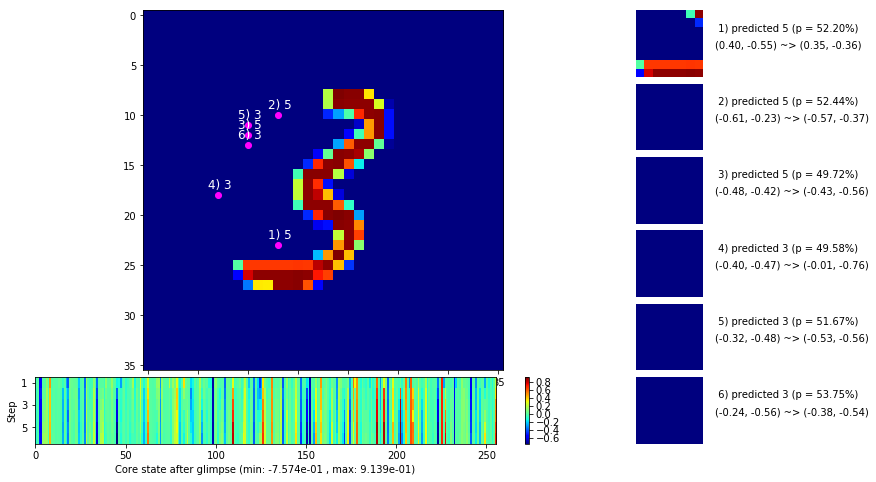

 b   1500/  3000 >> 138.3 ms/b | lr: 8.02e-04 | grad 2norm:  6.45 | grad inf norm:  1.840
       Weights || abs max:  0.70 (22509.84) | mean: -6.99e-03 ( 0.09) | var: 7.39e-03 (28723.40)
        Biases || abs max:  0.81 ( 2484.35) | mean:  1.12e-02 ( 2.07) | var: 2.97e-03 (187074.78)
                  class loss: 0.405 | steps: 2.493 | reward:  0.866 | acc.: 86.59%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.0 ms/b | lr: 7.86e-04 | grad 2norm:  6.17 | grad inf norm:  1.769
       Weights || abs max:  0.73 (24211.65) | mean: -7.24e-03 ( 0.09) | var: 7.86e-03 (74097.47)
        Biases || abs max:  0.84 ( 2642.97) | mean:  1.07e-02 ( 2.14) | var: 3.27e-03 (365177.44)
                  class loss: 0.388 | steps: 2.461 | reward:  0.871 | acc.: 87.14%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

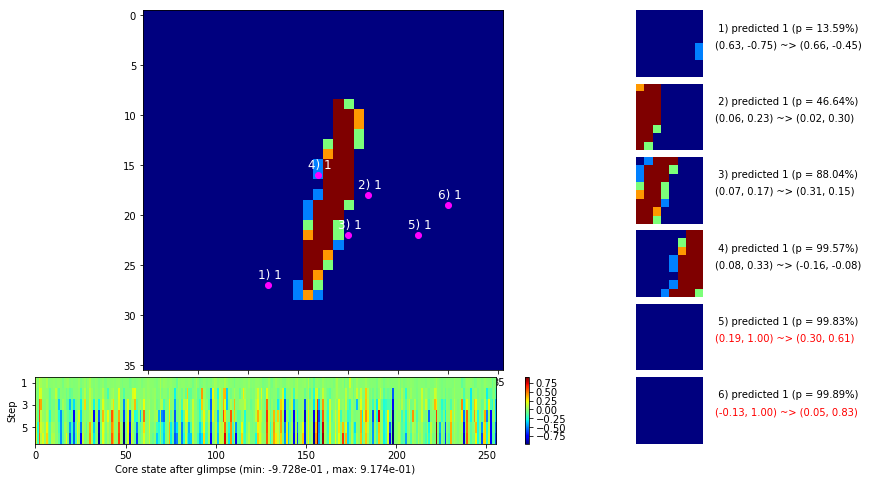

 b   2500/  3000 >> 137.4 ms/b | lr: 7.62e-04 | grad 2norm:  6.21 | grad inf norm:  1.762
       Weights || abs max:  0.74 (22005.19) | mean: -7.26e-03 ( 0.09) | var: 8.30e-03 (60397.70)
        Biases || abs max:  0.86 ( 2053.80) | mean:  1.09e-02 ( 1.77) | var: 3.48e-03 (50953.12)
                  class loss: 0.374 | steps: 2.453 | reward:  0.882 | acc.: 88.21%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 145.5 ms/b | lr: 7.47e-04 | grad 2norm:  6.50 | grad inf norm:  1.800
       Weights || abs max:  0.76 (20224.43) | mean: -7.36e-03 ( 0.09) | var: 8.67e-03 (19162.25)
        Biases || abs max:  0.87 ( 1311.31) | mean:  1.04e-02 ( 1.44) | var: 3.66e-03 (34094.34)
                  class loss: 0.408 | steps: 2.474 | reward:  0.866 | acc.: 86.61%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

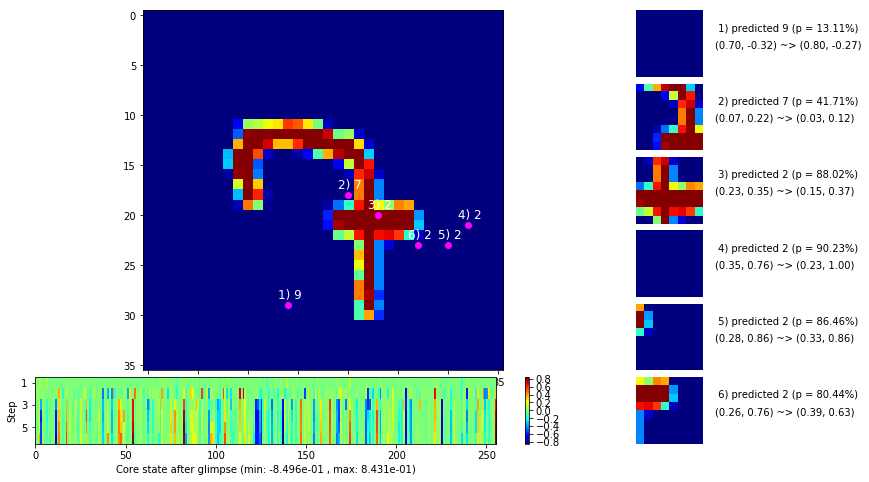

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


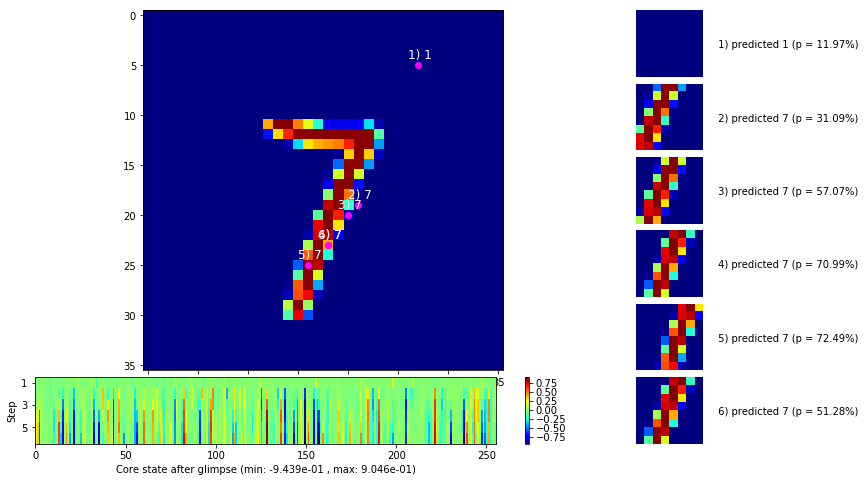


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


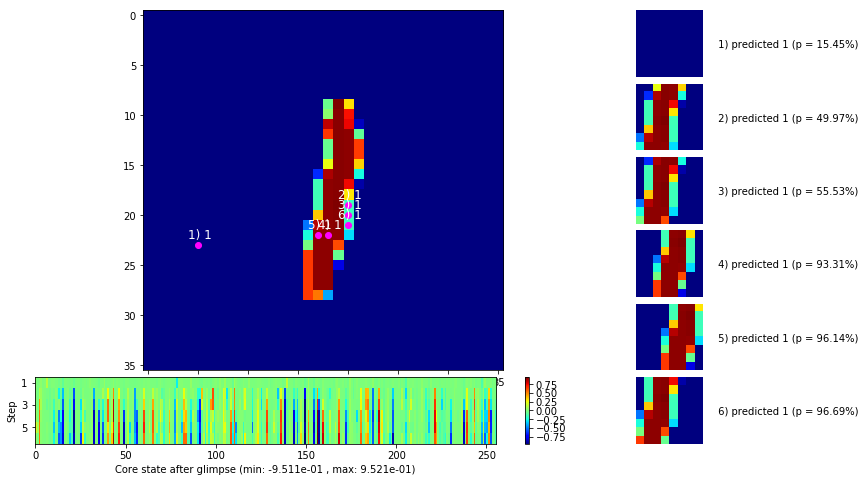

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


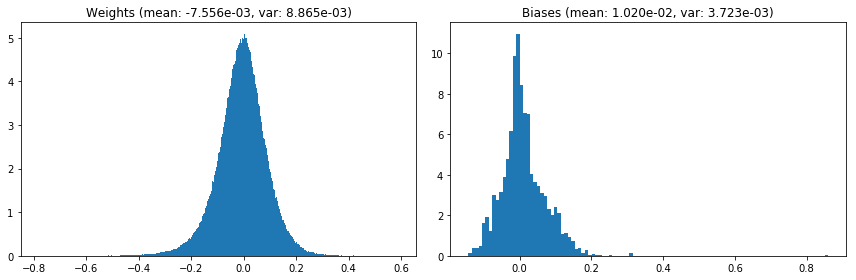

                                      Location network weights and biases


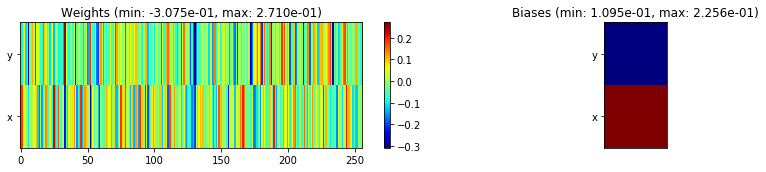

---------------------------------------------------------------------------------------------------------------
Elapsed time:  411.57 sec | TRAIN >> class loss: 0.4280 | steps:  2.512    | reward:  0.8600    | acc.: 86.000% 
                          | VAL   >> class loss: 0.5595 | steps:  2.499    | reward:  0.8104    | acc.: 81.040% 


Epoch   3/400) lr = 0.0007397
 b    500/  3000 >> 134.4 ms/b | lr: 7.25e-04 | grad 2norm:  6.62 | grad inf norm:  1.839
       Weights || abs max:  0.78 (16425.10) | mean: -7.49e-03 ( 0.08) | var: 9.03e-03 (12870.33)
        Biases || abs max:  0.86 ( 1520.77) | mean:  1.04e-02 ( 1.44) | var: 3.82e-03 (17440.11)
                  class loss: 0.430 | steps: 2.490 | reward:  0.854 | acc.: 85.41%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.3 ms/b | lr: 7.11e-04 | grad 2norm:  6.76 | grad inf norm:  1.817
       Weights || abs max:  0.78 (14782.00) | mean: -7.49e-03 ( 0.07) | var

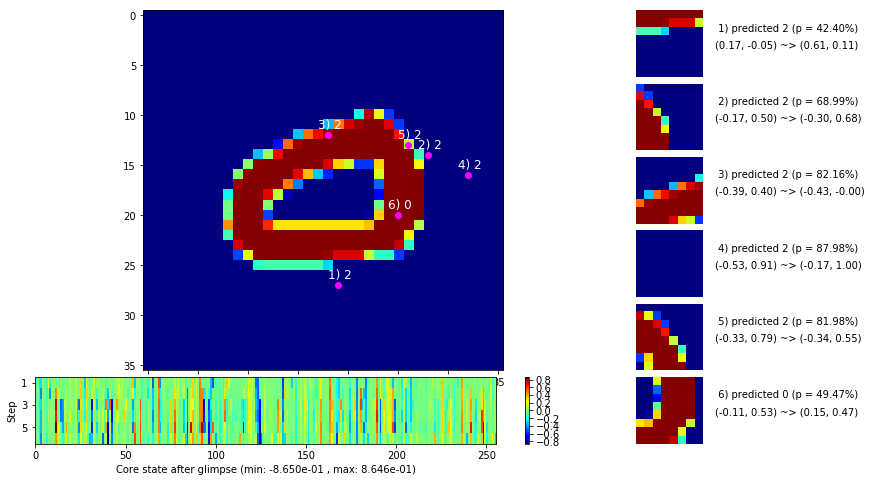

 b   1500/  3000 >> 136.3 ms/b | lr: 6.89e-04 | grad 2norm:  6.56 | grad inf norm:  1.755
       Weights || abs max:  0.80 (15397.65) | mean: -7.60e-03 ( 0.07) | var: 9.65e-03 ( 5056.75)
        Biases || abs max:  0.87 ( 1257.18) | mean:  9.69e-03 ( 1.25) | var: 4.12e-03 ( 6055.85)
                  class loss: 0.390 | steps: 2.416 | reward:  0.866 | acc.: 86.56%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.1 ms/b | lr: 6.76e-04 | grad 2norm:  6.54 | grad inf norm:  1.829
       Weights || abs max:  0.81 (15478.60) | mean: -7.69e-03 ( 0.07) | var: 9.95e-03 ( 3596.40)
        Biases || abs max:  0.87 ( 1044.64) | mean:  9.68e-03 ( 1.18) | var: 4.30e-03 (69284.37)
                  class loss: 0.399 | steps: 2.430 | reward:  0.864 | acc.: 86.43%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

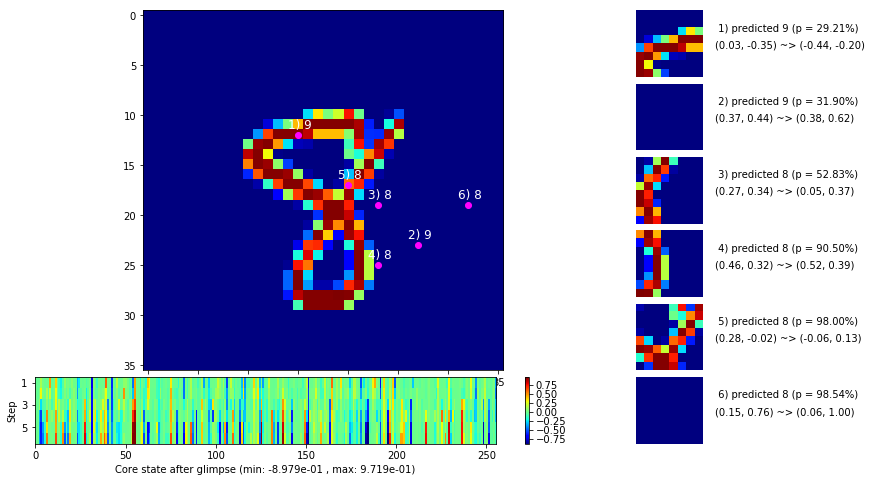

 b   2500/  3000 >> 135.1 ms/b | lr: 6.56e-04 | grad 2norm:  6.50 | grad inf norm:  1.810
       Weights || abs max:  0.84 (118460.37) | mean: -7.60e-03 ( 0.24) | var: 1.02e-02 (5169514.50)
        Biases || abs max:  0.87 ( 1671.15) | mean:  1.02e-02 ( 1.51) | var: 4.43e-03 (119219.39)
                  class loss: 0.360 | steps: 2.391 | reward:  0.873 | acc.: 87.33%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.2 ms/b | lr: 6.43e-04 | grad 2norm:  6.34 | grad inf norm:  1.717
       Weights || abs max:  0.86 (48582.08) | mean: -7.36e-03 ( 0.13) | var: 1.05e-02 (640949.12)
        Biases || abs max:  0.88 (  714.40) | mean:  1.10e-02 ( 0.87) | var: 4.62e-03 ( 1387.23)
                  class loss: 0.349 | steps: 2.372 | reward:  0.879 | acc.: 87.94%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

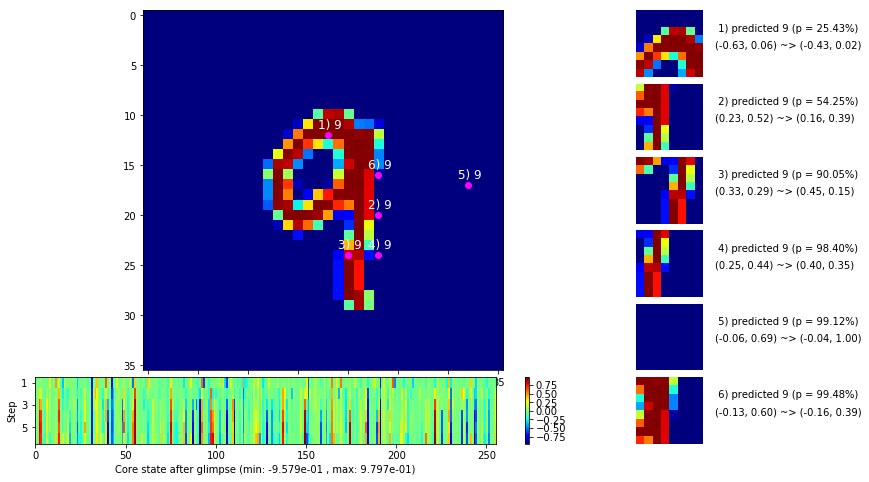

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


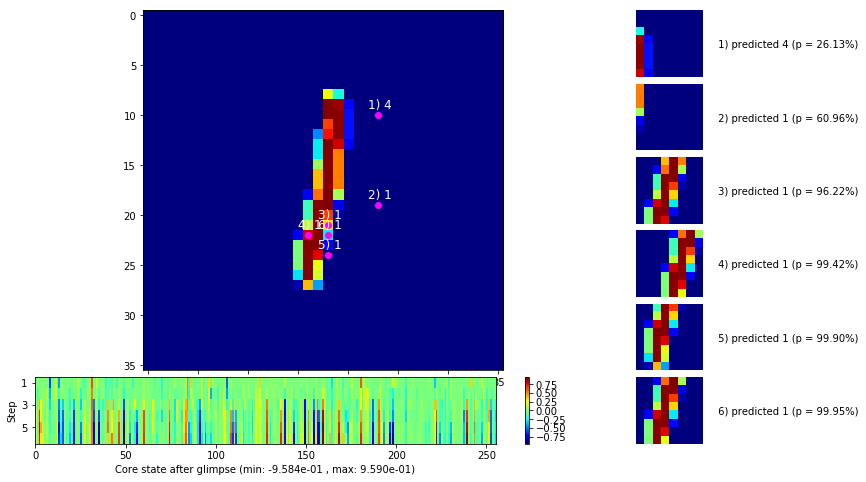


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


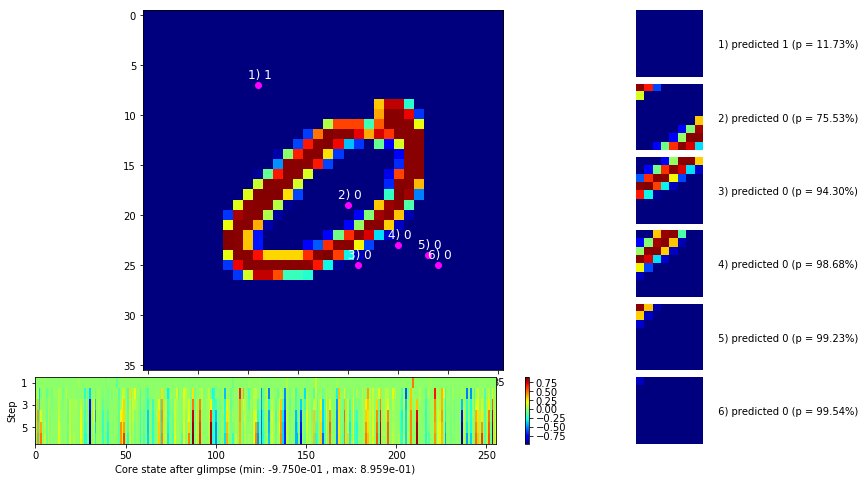

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


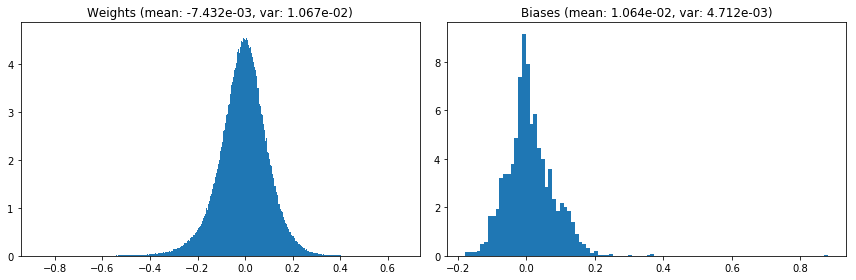

                                      Location network weights and biases


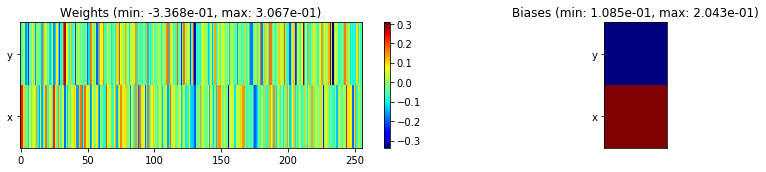

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.73 sec | TRAIN >> class loss: 0.3939 | steps:  2.429    | reward:  0.8651    | acc.: 86.508% 
                          | VAL   >> class loss: 0.4467 | steps:  2.272    | reward:  0.8428    | acc.: 84.280% 


Epoch   4/400) lr = 0.0006362
 b    500/  3000 >> 131.4 ms/b | lr: 6.24e-04 | grad 2norm:  6.15 | grad inf norm:  1.674
       Weights || abs max:  0.88 (17252.34) | mean: -7.42e-03 ( 0.08) | var: 1.08e-02 (11911.47)
        Biases || abs max:  0.88 ( 2886.68) | mean:  1.04e-02 ( 1.70) | var: 4.74e-03 (576502.50)
                  class loss: 0.323 | steps: 2.335 | reward:  0.889 | acc.: 88.92%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.3 ms/b | lr: 6.11e-04 | grad 2norm:  6.08 | grad inf norm:  1.577
       Weights || abs max:  0.90 (17778.12) | mean: -7.32e-03 ( 0.07) | va

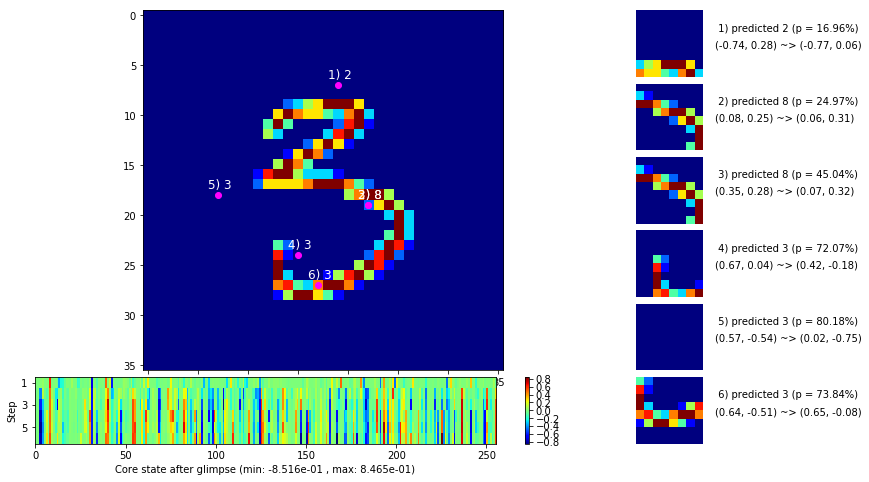

 b   1500/  3000 >> 137.2 ms/b | lr: 5.93e-04 | grad 2norm:  5.64 | grad inf norm:  1.489
       Weights || abs max:  0.92 (26675.58) | mean: -7.35e-03 ( 0.09) | var: 1.13e-02 (45017.45)
        Biases || abs max:  0.91 ( 1322.00) | mean:  9.80e-03 ( 1.10) | var: 5.03e-03 (24740.18)
                  class loss: 0.261 | steps: 2.280 | reward:  0.915 | acc.: 91.49%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 130.6 ms/b | lr: 5.81e-04 | grad 2norm:  5.54 | grad inf norm:  1.438
       Weights || abs max:  0.92 (38753.10) | mean: -7.41e-03 ( 0.11) | var: 1.15e-02 (137428.14)
        Biases || abs max:  0.92 ( 1311.22) | mean:  9.66e-03 ( 1.01) | var: 5.12e-03 (17500.87)
                  class loss: 0.263 | steps: 2.285 | reward:  0.917 | acc.: 91.67%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

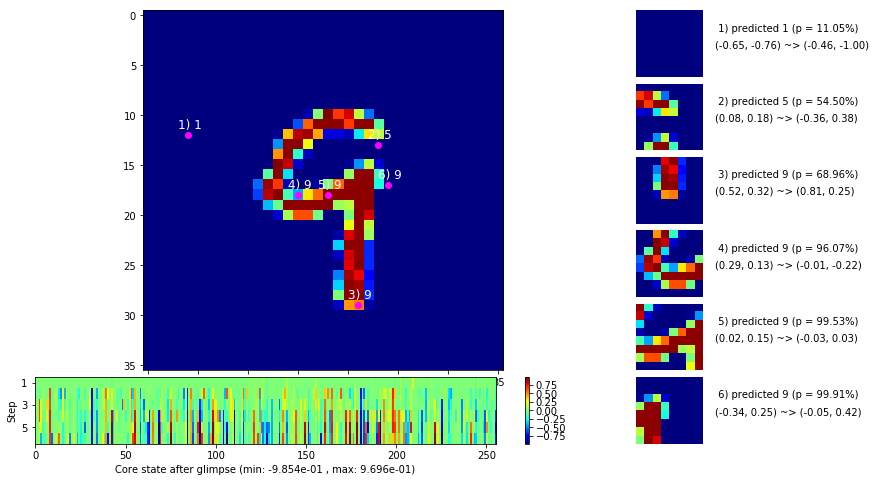

 b   2500/  3000 >> 133.3 ms/b | lr: 5.64e-04 | grad 2norm:  5.45 | grad inf norm:  1.450
       Weights || abs max:  0.94 (26429.40) | mean: -7.32e-03 ( 0.09) | var: 1.18e-02 (57229.74)
        Biases || abs max:  0.92 (  761.38) | mean:  1.00e-02 ( 0.78) | var: 5.23e-03 ( 2408.66)
                  class loss: 0.260 | steps: 2.280 | reward:  0.917 | acc.: 91.66%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.0 ms/b | lr: 5.53e-04 | grad 2norm:  5.77 | grad inf norm:  1.532
       Weights || abs max:  0.94 (17732.11) | mean: -7.31e-03 ( 0.08) | var: 1.20e-02 ( 5019.59)
        Biases || abs max:  0.93 ( 1131.40) | mean:  1.02e-02 ( 0.98) | var: 5.30e-03 ( 5943.75)
                  class loss: 0.262 | steps: 2.241 | reward:  0.913 | acc.: 91.30%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

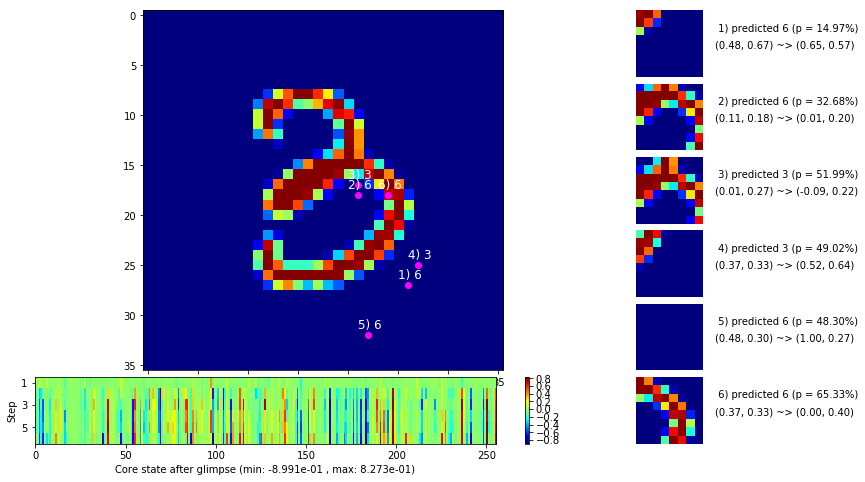

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


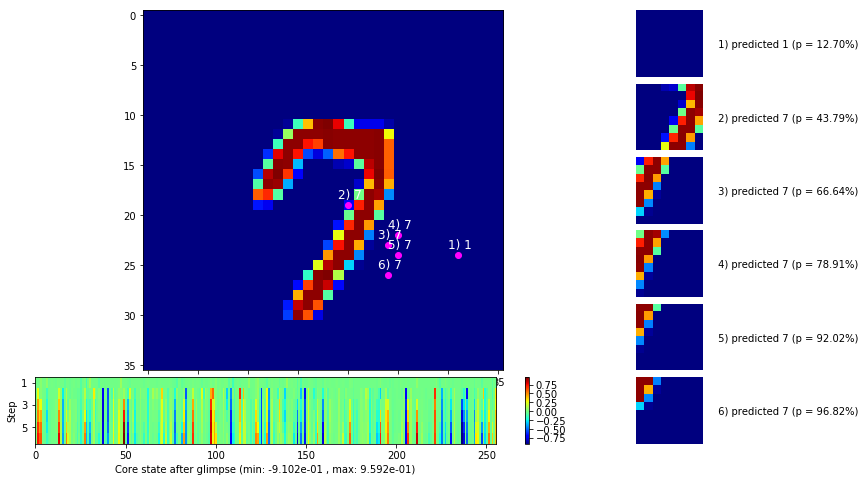


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


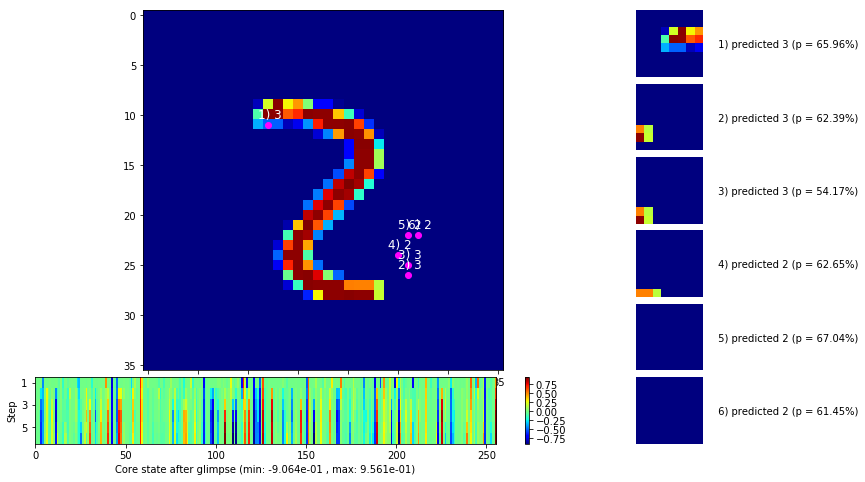

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


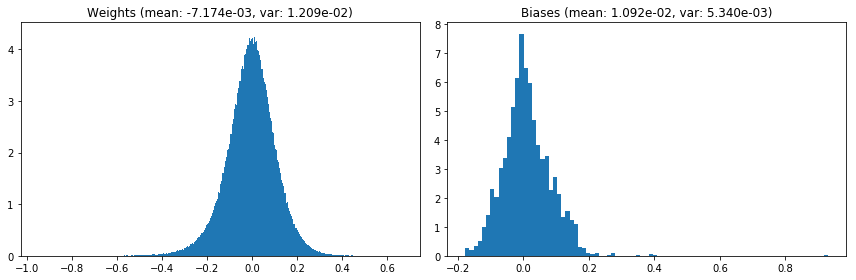

                                      Location network weights and biases


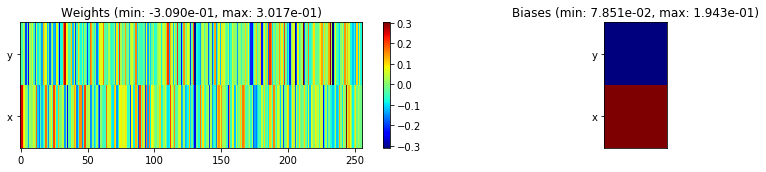

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.56 sec | TRAIN >> class loss: 0.2786 | steps:  2.290    | reward:  0.9082    | acc.: 90.820% 
                          | VAL   >> class loss: 0.3135 | steps:  2.133    | reward:  0.9004    | acc.: 90.040% 


Epoch   5/400) lr = 0.0005472
 b    500/  3000 >> 133.9 ms/b | lr: 5.36e-04 | grad 2norm:  5.70 | grad inf norm:  1.483
       Weights || abs max:  0.94 (14567.98) | mean: -7.24e-03 ( 0.07) | var: 1.22e-02 ( 2263.50)
        Biases || abs max:  0.93 ( 1129.94) | mean:  1.02e-02 ( 0.94) | var: 5.44e-03 (10694.89)
                  class loss: 0.260 | steps: 2.247 | reward:  0.914 | acc.: 91.42%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.2 ms/b | lr: 5.26e-04 | grad 2norm:  5.48 | grad inf norm:  1.434
       Weights || abs max:  0.92 (19890.23) | mean: -7.23e-03 ( 0.08) | var

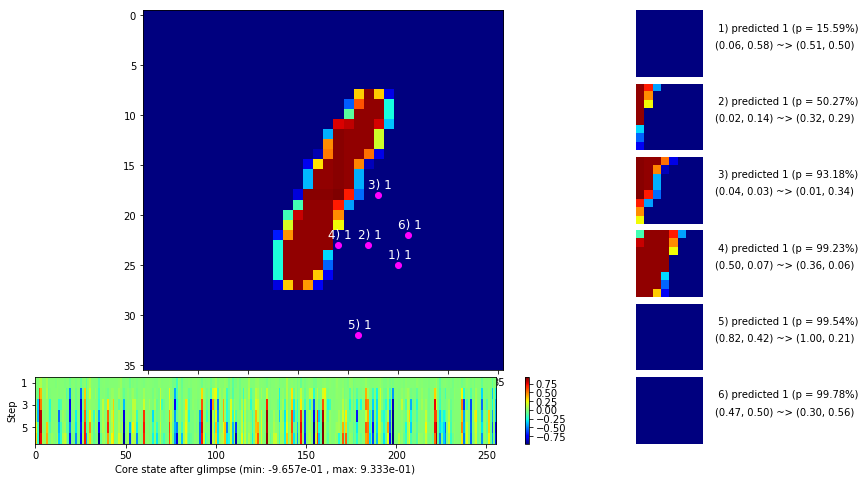

 b   1500/  3000 >> 133.0 ms/b | lr: 5.10e-04 | grad 2norm:  5.62 | grad inf norm:  1.479
       Weights || abs max:  0.94 (38882.70) | mean: -7.16e-03 ( 0.12) | var: 1.25e-02 (94201.76)
        Biases || abs max:  0.93 (  951.18) | mean:  1.04e-02 ( 0.83) | var: 5.50e-03 ( 4765.15)
                  class loss: 0.252 | steps: 2.243 | reward:  0.916 | acc.: 91.65%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 131.8 ms/b | lr: 5.00e-04 | grad 2norm:  5.37 | grad inf norm:  1.422
       Weights || abs max:  0.95 (21886.18) | mean: -7.31e-03 ( 0.09) | var: 1.27e-02 (36309.53)
        Biases || abs max:  0.93 (  563.46) | mean:  1.00e-02 ( 0.61) | var: 5.51e-03 ( 1293.17)
                  class loss: 0.246 | steps: 2.232 | reward:  0.923 | acc.: 92.27%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

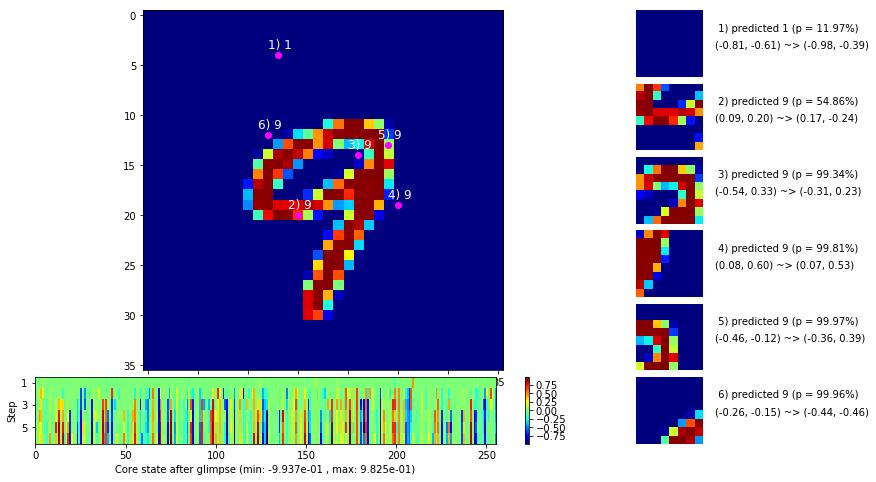

 b   2500/  3000 >> 138.6 ms/b | lr: 4.85e-04 | grad 2norm:  5.36 | grad inf norm:  1.429
       Weights || abs max:  0.95 (17350.16) | mean: -7.39e-03 ( 0.08) | var: 1.29e-02 ( 4218.80)
        Biases || abs max:  0.93 ( 1380.73) | mean:  9.80e-03 ( 0.94) | var: 5.62e-03 (57952.51)
                  class loss: 0.242 | steps: 2.234 | reward:  0.924 | acc.: 92.36%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.6 ms/b | lr: 4.75e-04 | grad 2norm:  5.38 | grad inf norm:  1.411
       Weights || abs max:  0.95 (21687.75) | mean: -7.26e-03 ( 0.08) | var: 1.31e-02 (16375.34)
        Biases || abs max:  0.94 ( 4492.25) | mean:  9.96e-03 ( 2.17) | var: 5.77e-03 (1272849.38)
                  class loss: 0.223 | steps: 2.217 | reward:  0.924 | acc.: 92.40%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

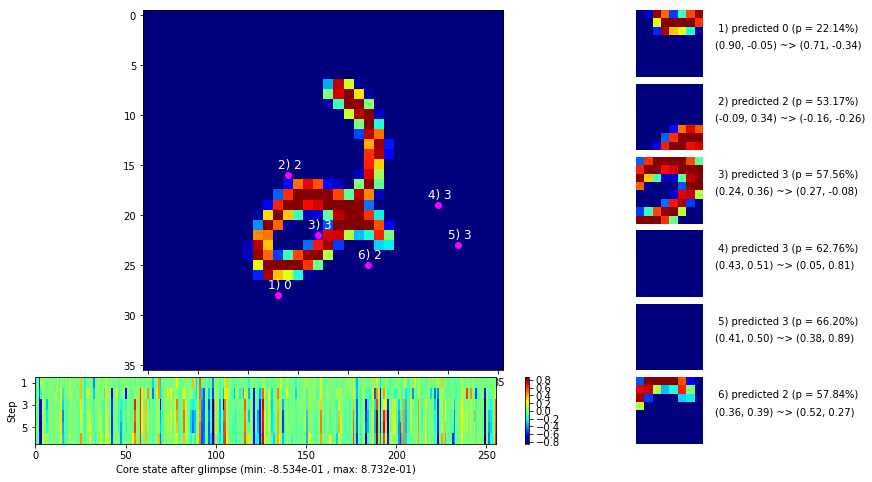

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


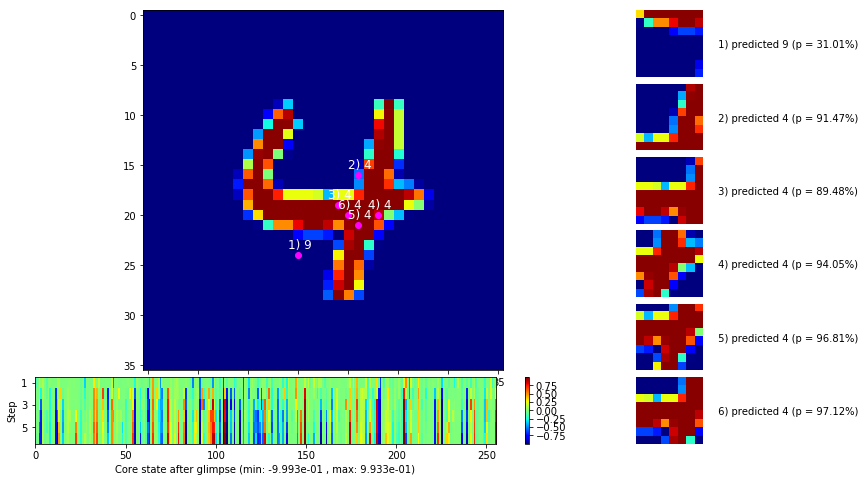


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


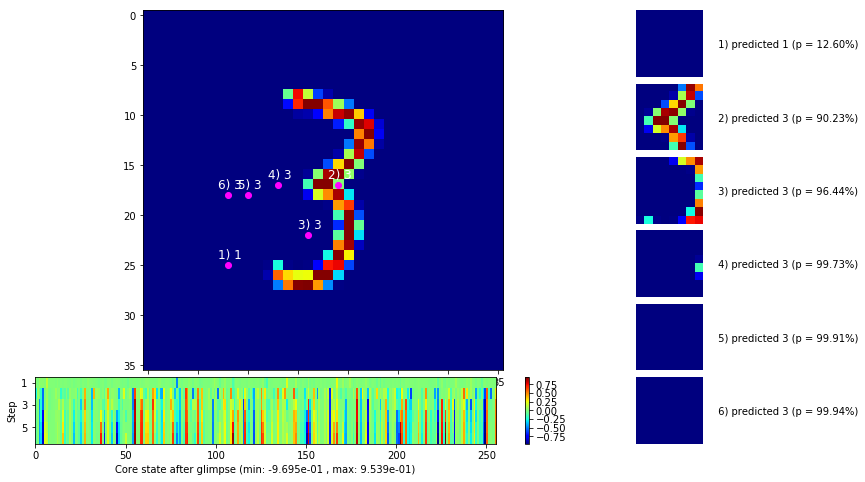

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


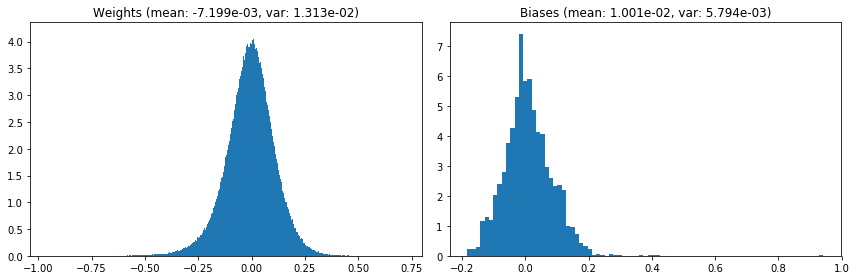

                                      Location network weights and biases


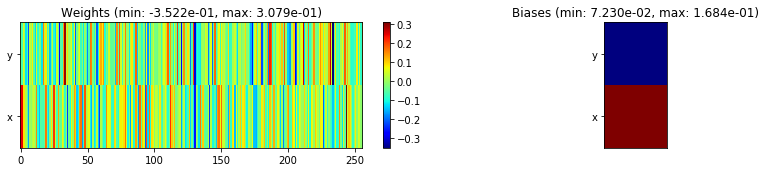

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.15 sec | TRAIN >> class loss: 0.2451 | steps:  2.235    | reward:  0.9202    | acc.: 92.015% 
                          | VAL   >> class loss: 0.2687 | steps:  2.129    | reward:  0.9124    | acc.: 91.240% 


Epoch   6/400) lr = 0.0004706
 b    500/  3000 >> 132.0 ms/b | lr: 4.61e-04 | grad 2norm:  5.30 | grad inf norm:  1.377
       Weights || abs max:  0.95 (11994.96) | mean: -7.21e-03 ( 0.07) | var: 1.32e-02 ( 1492.20)
        Biases || abs max:  0.94 ( 1802.67) | mean:  9.94e-03 ( 1.07) | var: 5.81e-03 (75658.45)
                  class loss: 0.224 | steps: 2.189 | reward:  0.929 | acc.: 92.86%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 131.4 ms/b | lr: 4.52e-04 | grad 2norm:  5.13 | grad inf norm:  1.356
       Weights || abs max:  0.94 (22253.45) | mean: -7.10e-03 ( 0.08) | var

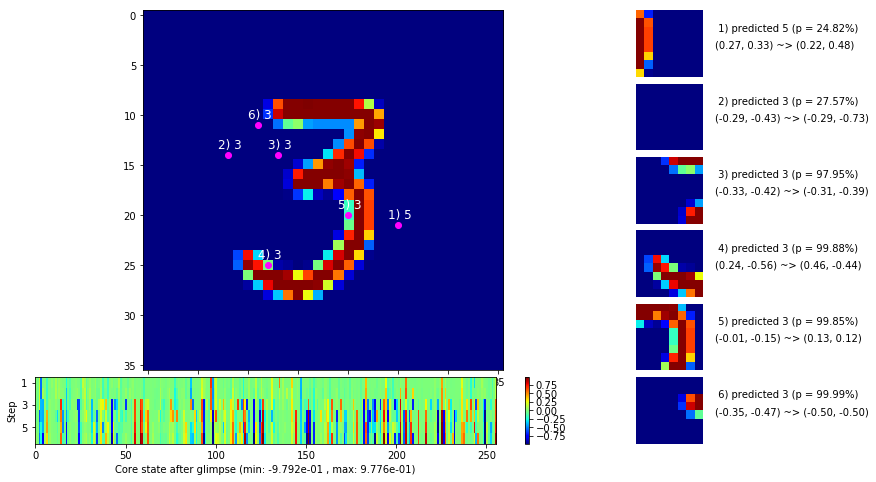

 b   1500/  3000 >> 134.5 ms/b | lr: 4.39e-04 | grad 2norm:  5.10 | grad inf norm:  1.329
       Weights || abs max:  0.95 (432347.19) | mean: -7.04e-03 ( 0.77) | var: 1.35e-02 (144163792.00)
        Biases || abs max:  0.95 ( 1234.69) | mean:  1.06e-02 ( 0.85) | var: 5.87e-03 (62453.38)
                  class loss: 0.208 | steps: 2.168 | reward:  0.933 | acc.: 93.33%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.4 ms/b | lr: 4.30e-04 | grad 2norm:  4.91 | grad inf norm:  1.262
       Weights || abs max:  0.96 (23096.67) | mean: -6.95e-03 ( 0.09) | var: 1.36e-02 (17416.79)
        Biases || abs max:  0.95 ( 1851.07) | mean:  1.08e-02 ( 1.17) | var: 5.96e-03 (216177.11)
                  class loss: 0.202 | steps: 2.177 | reward:  0.937 | acc.: 93.68%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

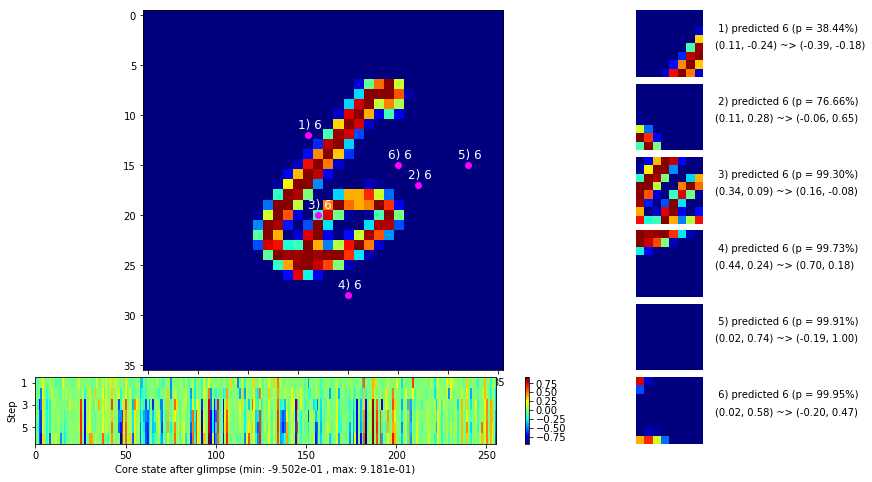

 b   2500/  3000 >> 141.4 ms/b | lr: 4.17e-04 | grad 2norm:  5.18 | grad inf norm:  1.332
       Weights || abs max:  0.97 (25085.73) | mean: -7.00e-03 ( 0.09) | var: 1.37e-02 (64023.73)
        Biases || abs max:  0.95 (  930.22) | mean:  1.04e-02 ( 0.80) | var: 5.96e-03 ( 4601.80)
                  class loss: 0.219 | steps: 2.200 | reward:  0.930 | acc.: 93.03%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 145.2 ms/b | lr: 4.09e-04 | grad 2norm:  4.87 | grad inf norm:  1.293
       Weights || abs max:  0.98 (16367.63) | mean: -6.92e-03 ( 0.08) | var: 1.38e-02 ( 3364.11)
        Biases || abs max:  0.95 ( 1106.99) | mean:  1.05e-02 ( 0.83) | var: 6.01e-03 (17275.00)
                  class loss: 0.197 | steps: 2.167 | reward:  0.937 | acc.: 93.67%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

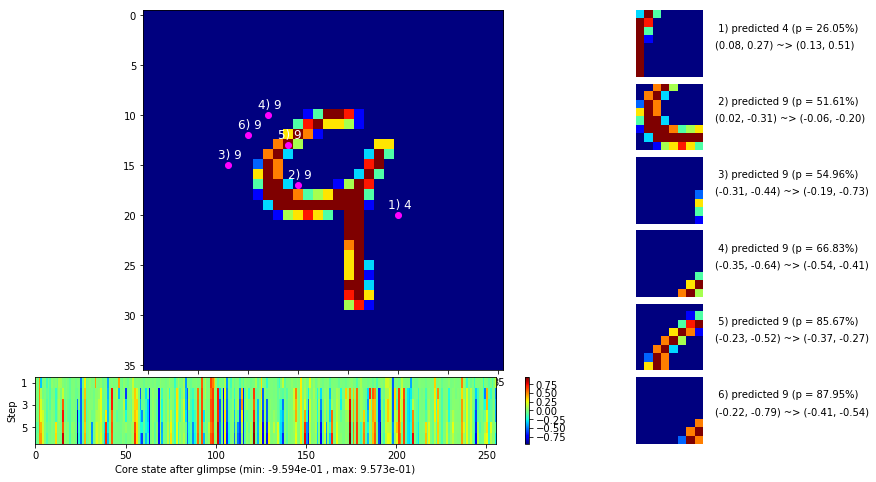

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


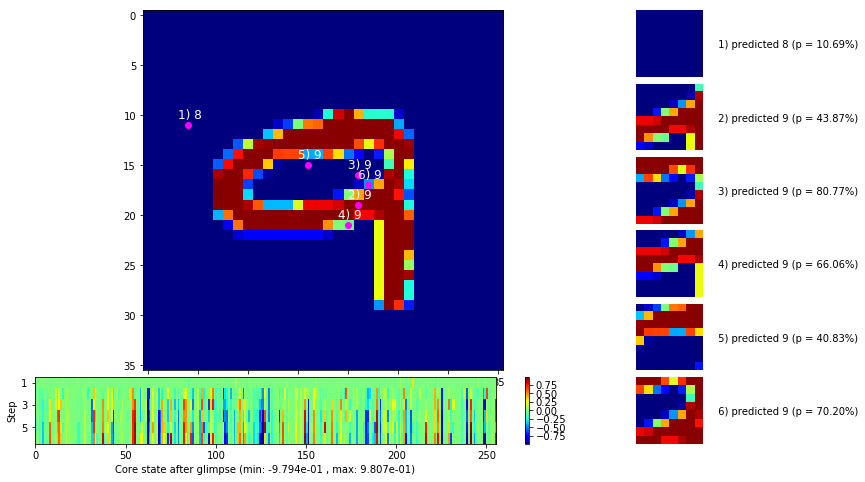


	Target class: 0  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


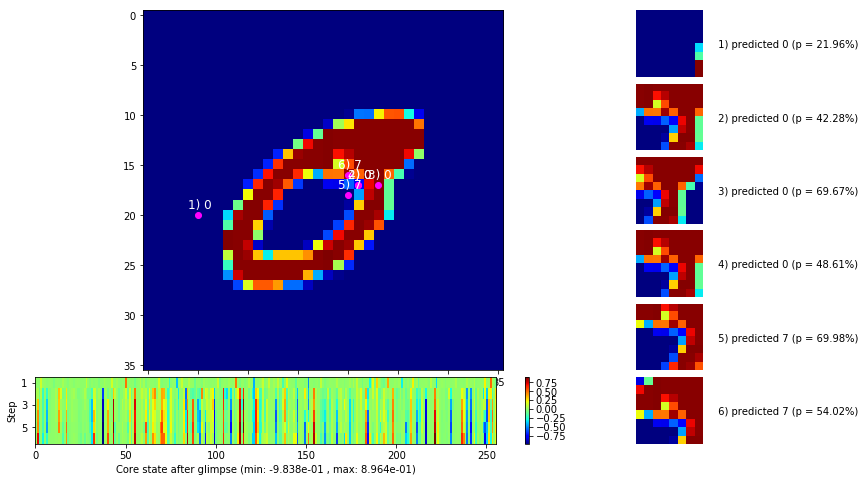

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


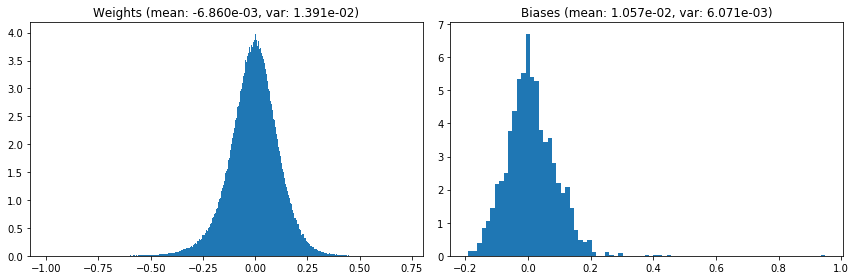

                                      Location network weights and biases


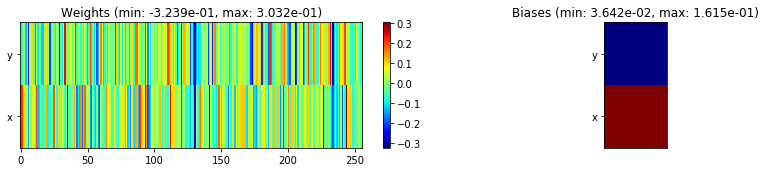

---------------------------------------------------------------------------------------------------------------
Elapsed time:  410.13 sec | TRAIN >> class loss: 0.2082 | steps:  2.178    | reward:  0.9333    | acc.: 93.330% 
                          | VAL   >> class loss: 0.2138 | steps:  2.051    | reward:  0.9322    | acc.: 93.220% 


Epoch   7/400) lr = 0.0004047
 b    500/  3000 >> 145.2 ms/b | lr: 3.97e-04 | grad 2norm:  4.75 | grad inf norm:  1.218
       Weights || abs max:  0.99 (20505.68) | mean: -6.83e-03 ( 0.08) | var: 1.40e-02 (14414.34)
        Biases || abs max:  0.95 ( 1303.07) | mean:  1.07e-02 ( 0.91) | var: 6.12e-03 (64714.80)
                  class loss: 0.182 | steps: 2.136 | reward:  0.943 | acc.: 94.27%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 153.7 ms/b | lr: 3.89e-04 | grad 2norm:  5.14 | grad inf norm:  1.326
       Weights || abs max:  0.99 (65099.09) | mean: -6.71e-03 ( 0.16) | var

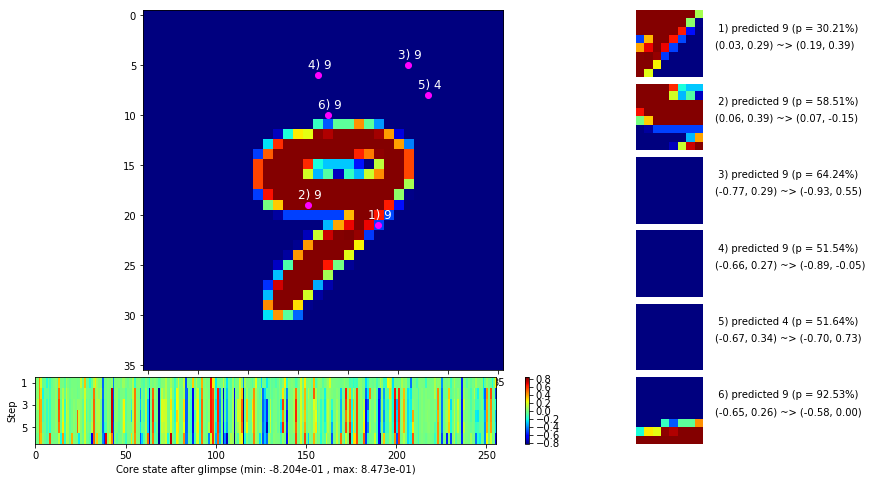

 b   1500/  3000 >> 143.6 ms/b | lr: 3.77e-04 | grad 2norm:  5.19 | grad inf norm:  1.351
       Weights || abs max:  0.99 (32713.28) | mean: -6.59e-03 ( 0.10) | var: 1.42e-02 (66845.97)
        Biases || abs max:  0.95 (  786.31) | mean:  1.16e-02 ( 0.72) | var: 6.16e-03 ( 3413.15)
                  class loss: 0.200 | steps: 2.158 | reward:  0.933 | acc.: 93.28%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 151.7 ms/b | lr: 3.70e-04 | grad 2norm:  5.18 | grad inf norm:  1.334
       Weights || abs max:  0.99 (26616.64) | mean: -6.57e-03 ( 0.09) | var: 1.43e-02 (33005.08)
        Biases || abs max:  0.95 ( 3641.34) | mean:  1.16e-02 ( 1.85) | var: 6.20e-03 (1402524.00)
                  class loss: 0.216 | steps: 2.162 | reward:  0.932 | acc.: 93.16%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.

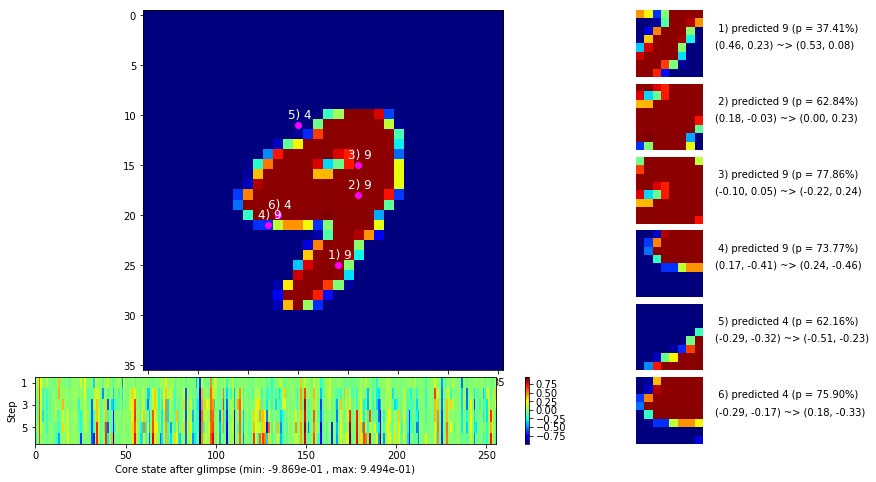

 b   2500/  3000 >> 143.0 ms/b | lr: 3.59e-04 | grad 2norm:  5.12 | grad inf norm:  1.293
       Weights || abs max:  1.00 (49336.33) | mean: -6.59e-03 ( 0.13) | var: 1.44e-02 (1114723.62)
        Biases || abs max:  0.95 (  711.21) | mean:  1.14e-02 ( 0.72) | var: 6.24e-03 ( 3489.56)
                  class loss: 0.210 | steps: 2.156 | reward:  0.935 | acc.: 93.48%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.0 ms/b | lr: 3.52e-04 | grad 2norm:  5.36 | grad inf norm:  1.354
       Weights || abs max:  1.00 (57324.07) | mean: -6.54e-03 ( 0.14) | var: 1.45e-02 (1323758.25)
        Biases || abs max:  0.95 (  888.84) | mean:  1.14e-02 ( 0.90) | var: 6.25e-03 ( 9645.20)
                  class loss: 0.214 | steps: 2.155 | reward:  0.930 | acc.: 92.98%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

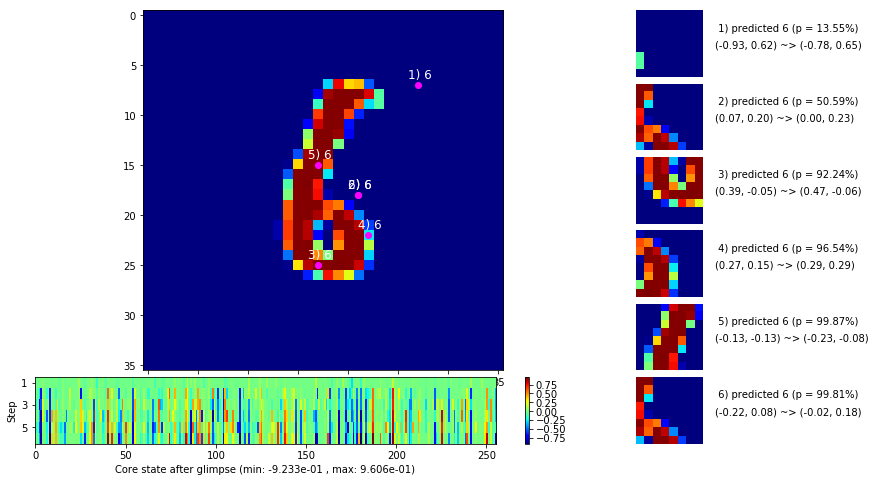

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


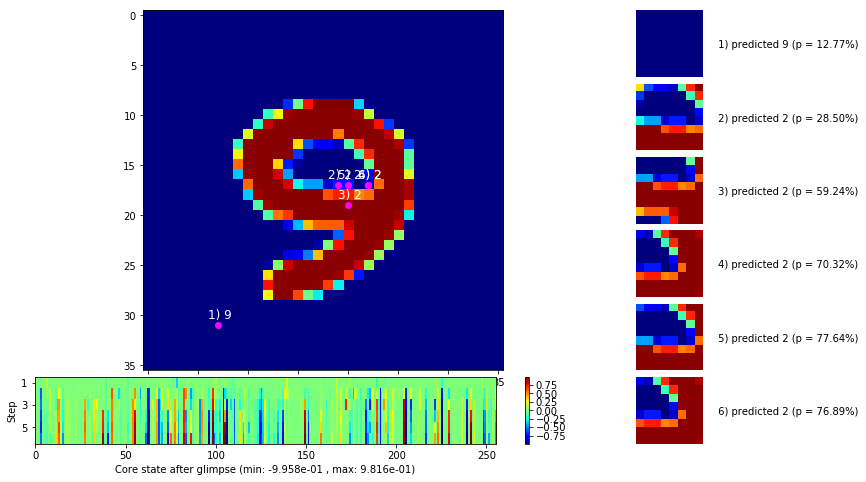


	Target class: 6  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


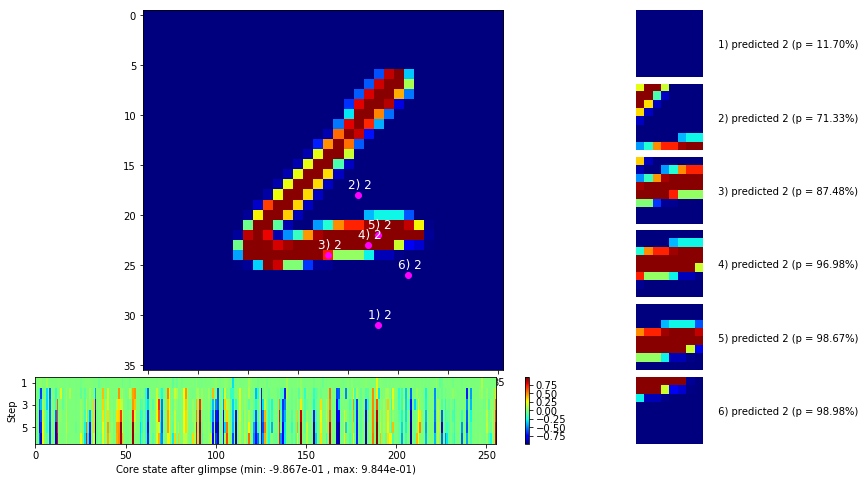

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


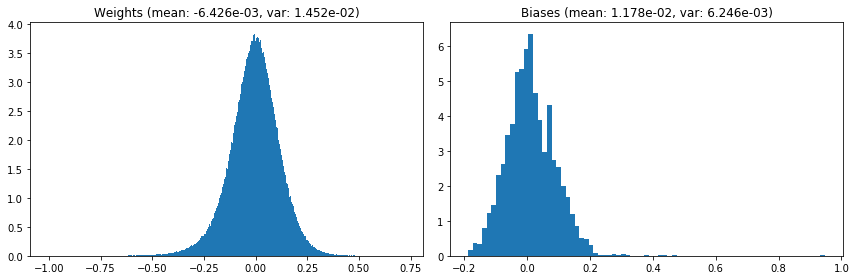

                                      Location network weights and biases


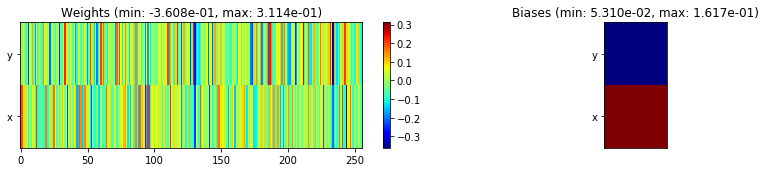

---------------------------------------------------------------------------------------------------------------
Elapsed time:  439.68 sec | TRAIN >> class loss: 0.2038 | steps:  2.155    | reward:  0.9342    | acc.: 93.415% 
                          | VAL   >> class loss: 0.2071 | steps:  2.057 :( | reward:  0.9306 :( | acc.: 93.060% :(


Epoch   8/400) lr = 0.0003481
 b    500/  3000 >> 139.5 ms/b | lr: 3.41e-04 | grad 2norm:  5.38 | grad inf norm:  1.336
       Weights || abs max:  1.01 (41135.16) | mean: -6.36e-03 ( 0.12) | var: 1.46e-02 (185271.48)
        Biases || abs max:  0.95 ( 1460.99) | mean:  1.20e-02 ( 1.13) | var: 6.24e-03 (10513.88)
                  class loss: 0.211 | steps: 2.174 | reward:  0.930 | acc.: 93.05%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 141.1 ms/b | lr: 3.34e-04 | grad 2norm:  5.36 | grad inf norm:  1.362
       Weights || abs max:  1.01 (23533.40) | mean: -6.27e-03 ( 0.09) | 

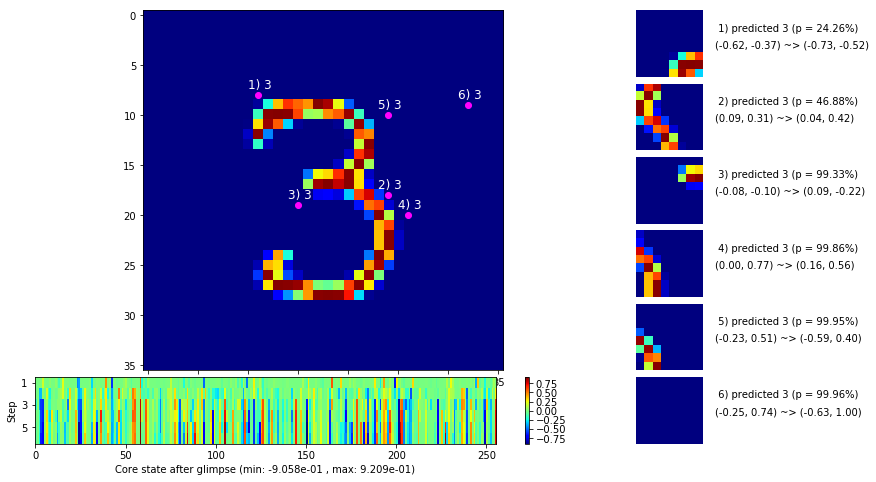

 b   1500/  3000 >> 135.2 ms/b | lr: 3.24e-04 | grad 2norm:  5.46 | grad inf norm:  1.353
       Weights || abs max:  1.01 (35788.54) | mean: -6.31e-03 ( 0.11) | var: 1.47e-02 (97203.02)
        Biases || abs max:  0.95 (  609.97) | mean:  1.23e-02 ( 0.59) | var: 6.26e-03 ( 3977.70)
                  class loss: 0.223 | steps: 2.182 | reward:  0.929 | acc.: 92.87%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.7 ms/b | lr: 3.18e-04 | grad 2norm:  5.42 | grad inf norm:  1.352
       Weights || abs max:  1.01 (12034.44) | mean: -6.21e-03 ( 0.07) | var: 1.48e-02 ( 1430.96)
        Biases || abs max:  0.95 (  608.66) | mean:  1.27e-02 ( 0.62) | var: 6.29e-03 ( 1276.47)
                  class loss: 0.207 | steps: 2.149 | reward:  0.931 | acc.: 93.08%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

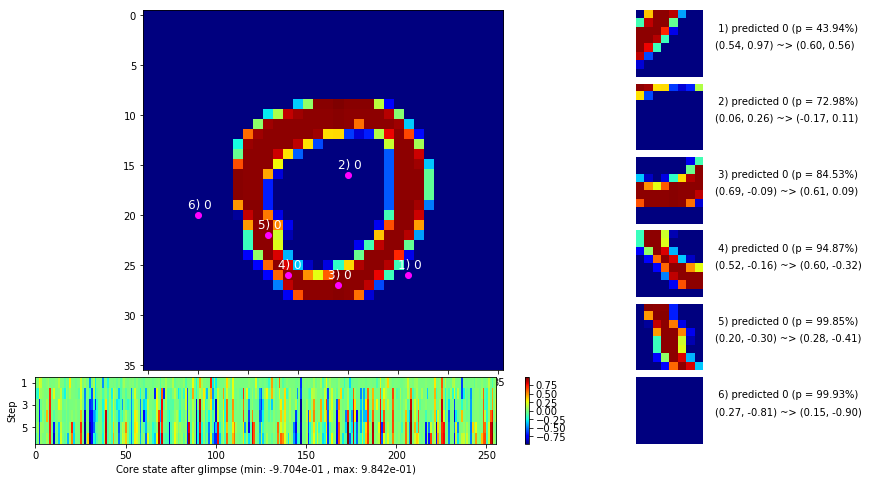

 b   2500/  3000 >> 142.6 ms/b | lr: 3.09e-04 | grad 2norm:  5.37 | grad inf norm:  1.317
       Weights || abs max:  1.03 (16626.51) | mean: -6.15e-03 ( 0.08) | var: 1.49e-02 ( 8165.49)
        Biases || abs max:  0.95 ( 1030.33) | mean:  1.29e-02 ( 0.92) | var: 6.30e-03 (11340.33)
                  class loss: 0.206 | steps: 2.140 | reward:  0.931 | acc.: 93.15%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.4 ms/b | lr: 3.02e-04 | grad 2norm:  5.13 | grad inf norm:  1.266
       Weights || abs max:  1.03 (25648.07) | mean: -6.10e-03 ( 0.09) | var: 1.50e-02 (42435.95)
        Biases || abs max:  0.95 ( 4163.11) | mean:  1.30e-02 ( 2.03) | var: 6.37e-03 (1885413.38)
                  class loss: 0.188 | steps: 2.144 | reward:  0.938 | acc.: 93.76%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

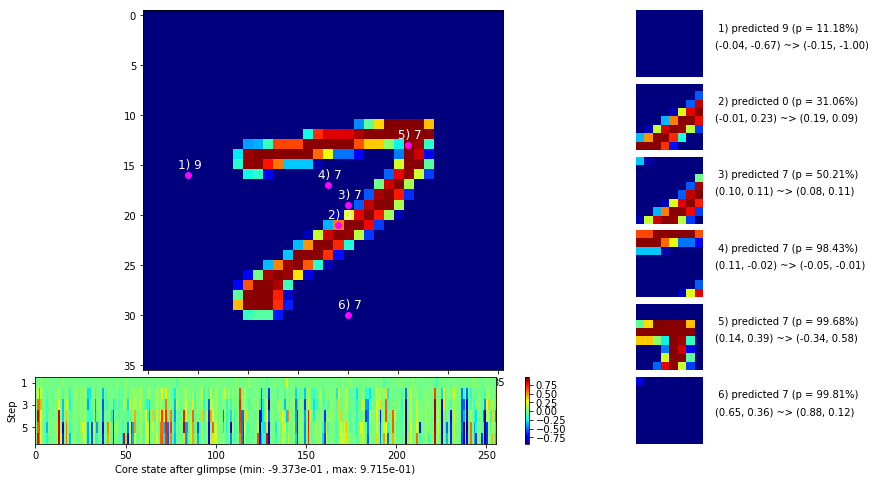

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


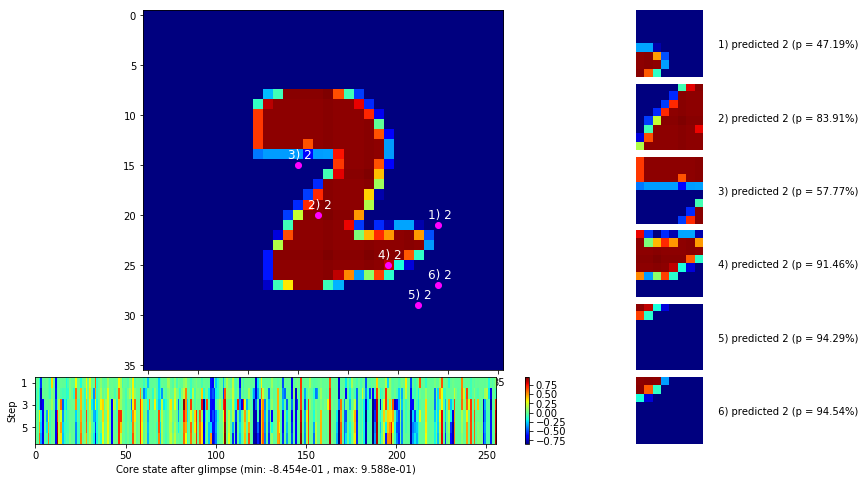


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


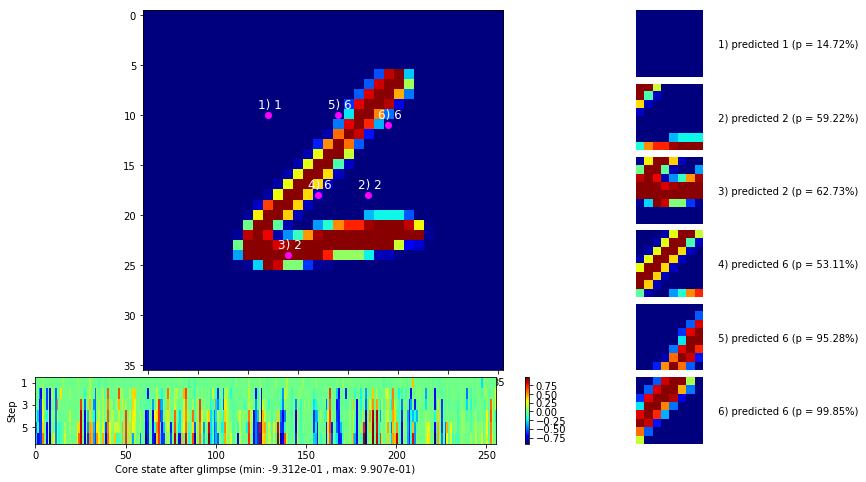

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


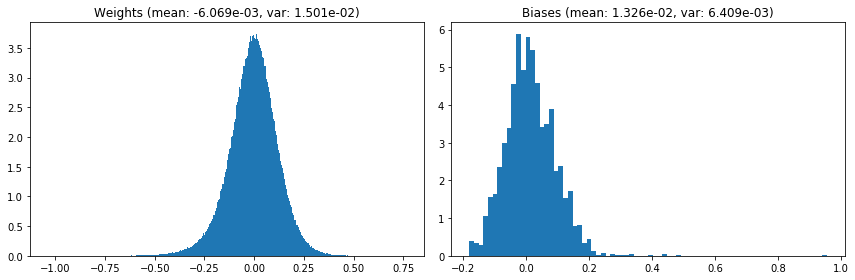

                                      Location network weights and biases


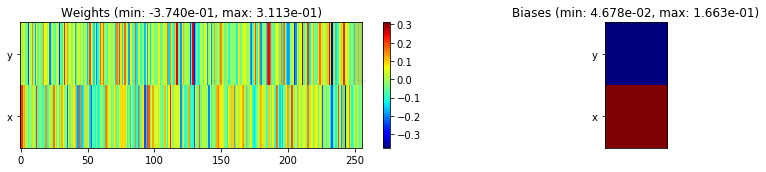

---------------------------------------------------------------------------------------------------------------
Elapsed time:  414.39 sec | TRAIN >> class loss: 0.2071 | steps:  2.158 :( | reward:  0.9318 :( | acc.: 93.178% :(
                          | VAL   >> class loss: 0.2190 | steps:  2.036    | reward:  0.9344    | acc.: 93.440% 


Epoch   9/400) lr = 0.0002994
 b    500/  3000 >> 135.4 ms/b | lr: 2.93e-04 | grad 2norm:  4.87 | grad inf norm:  1.258
       Weights || abs max:  1.03 (29681.91) | mean: -6.07e-03 ( 0.10) | var: 1.50e-02 (30457.40)
        Biases || abs max:  0.96 (  616.21) | mean:  1.31e-02 ( 0.65) | var: 6.43e-03 ( 1271.34)
                  class loss: 0.195 | steps: 2.154 | reward:  0.943 | acc.: 94.27%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.9 ms/b | lr: 2.88e-04 | grad 2norm:  5.11 | grad inf norm:  1.300
       Weights || abs max:  1.03 (20126.23) | mean: -6.04e-03 ( 0.08) | v

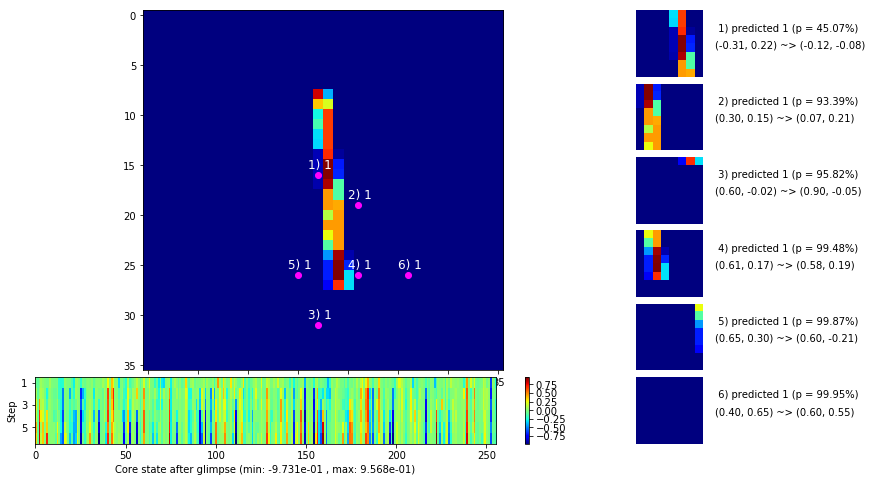

 b   1500/  3000 >> 134.7 ms/b | lr: 2.79e-04 | grad 2norm:  5.16 | grad inf norm:  1.309
       Weights || abs max:  1.04 (30345.37) | mean: -5.93e-03 ( 0.10) | var: 1.51e-02 (34740.09)
        Biases || abs max:  0.96 ( 1883.38) | mean:  1.34e-02 ( 1.11) | var: 6.45e-03 (178975.66)
                  class loss: 0.192 | steps: 2.134 | reward:  0.937 | acc.: 93.73%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.9 ms/b | lr: 2.73e-04 | grad 2norm:  5.03 | grad inf norm:  1.255
       Weights || abs max:  1.04 (51103.53) | mean: -5.95e-03 ( 0.14) | var: 1.52e-02 (927965.25)
        Biases || abs max:  0.96 ( 1776.50) | mean:  1.34e-02 ( 1.07) | var: 6.44e-03 (112205.19)
                  class loss: 0.185 | steps: 2.141 | reward:  0.940 | acc.: 93.96%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

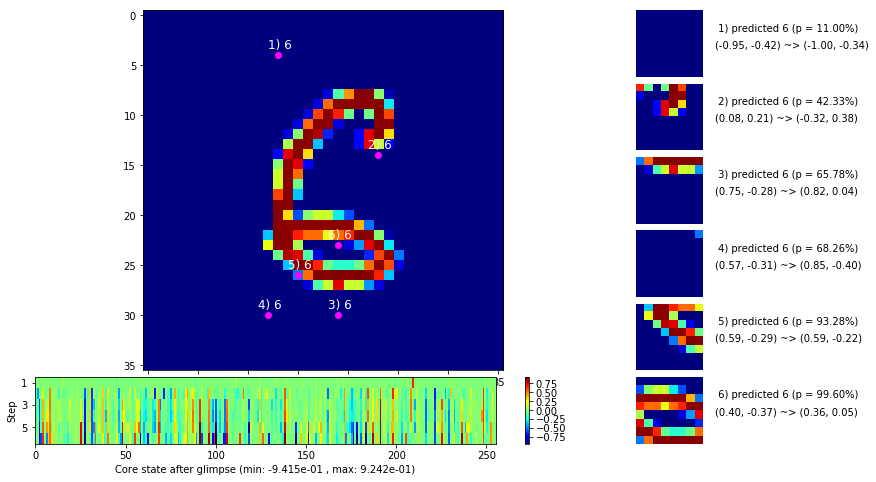

 b   2500/  3000 >> 135.7 ms/b | lr: 2.65e-04 | grad 2norm:  5.29 | grad inf norm:  1.308
       Weights || abs max:  1.05 (39292.18) | mean: -5.98e-03 ( 0.12) | var: 1.52e-02 (132544.77)
        Biases || abs max:  0.96 ( 1263.97) | mean:  1.32e-02 ( 0.83) | var: 6.41e-03 (59995.86)
                  class loss: 0.202 | steps: 2.134 | reward:  0.934 | acc.: 93.39%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.1 ms/b | lr: 2.60e-04 | grad 2norm:  5.31 | grad inf norm:  1.316
       Weights || abs max:  1.06 (26645.31) | mean: -5.98e-03 ( 0.10) | var: 1.53e-02 (40113.62)
        Biases || abs max:  0.95 (  990.62) | mean:  1.33e-02 ( 0.71) | var: 6.44e-03 (17965.64)
                  class loss: 0.196 | steps: 2.123 | reward:  0.934 | acc.: 93.41%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

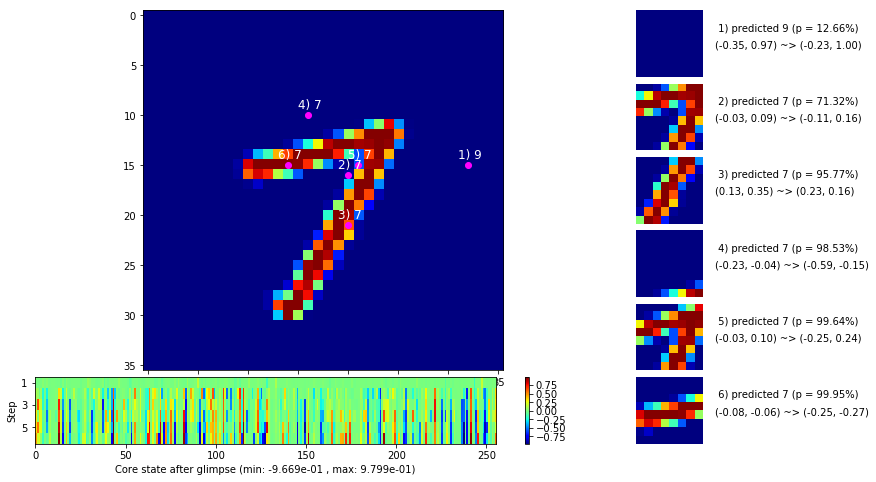

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


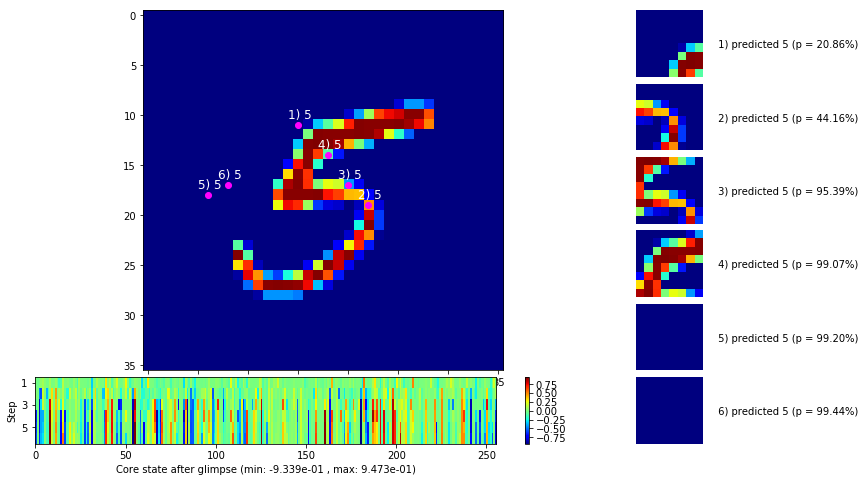


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


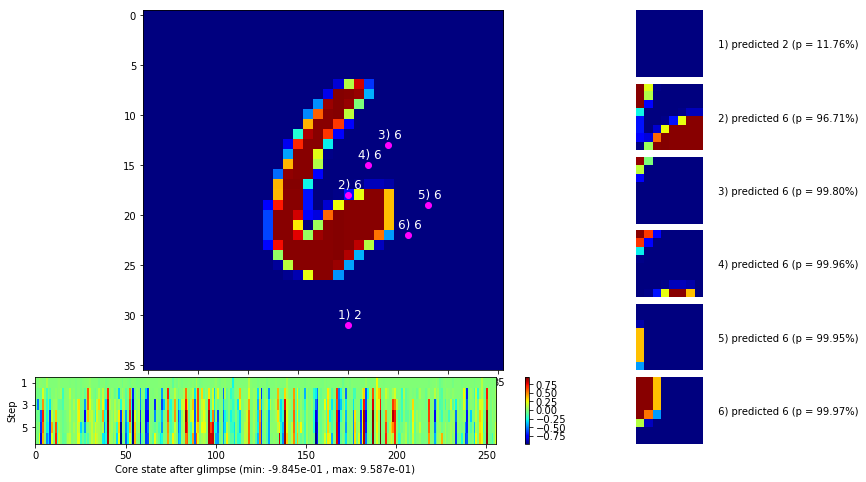

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


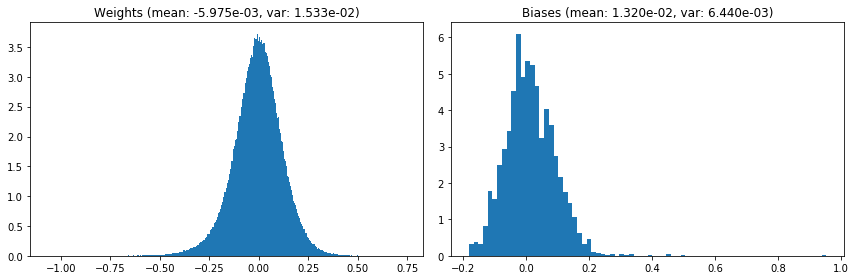

                                      Location network weights and biases


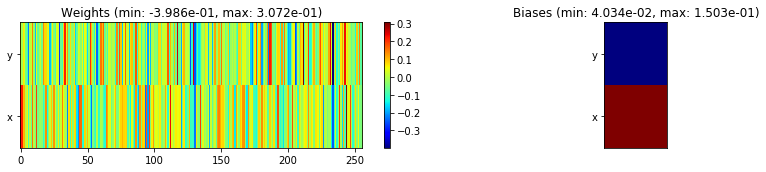

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.42 sec | TRAIN >> class loss: 0.1934 | steps:  2.136    | reward:  0.9375    | acc.: 93.753% 
                          | VAL   >> class loss: 0.2046 | steps:  1.994    | reward:  0.9344    | acc.: 93.440% 


Epoch  10/400) lr = 0.0002575
 b    500/  3000 >> 142.0 ms/b | lr: 2.52e-04 | grad 2norm:  5.00 | grad inf norm:  1.259
       Weights || abs max:  1.06 (38786.50) | mean: -5.91e-03 ( 0.12) | var: 1.54e-02 (129260.12)
        Biases || abs max:  0.96 (  650.79) | mean:  1.35e-02 ( 0.60) | var: 6.48e-03 ( 2544.19)
                  class loss: 0.182 | steps: 2.124 | reward:  0.941 | acc.: 94.12%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.1 ms/b | lr: 2.47e-04 | grad 2norm:  4.99 | grad inf norm:  1.234
       Weights || abs max:  1.07 (41512.17) | mean: -5.93e-03 ( 0.12) | va

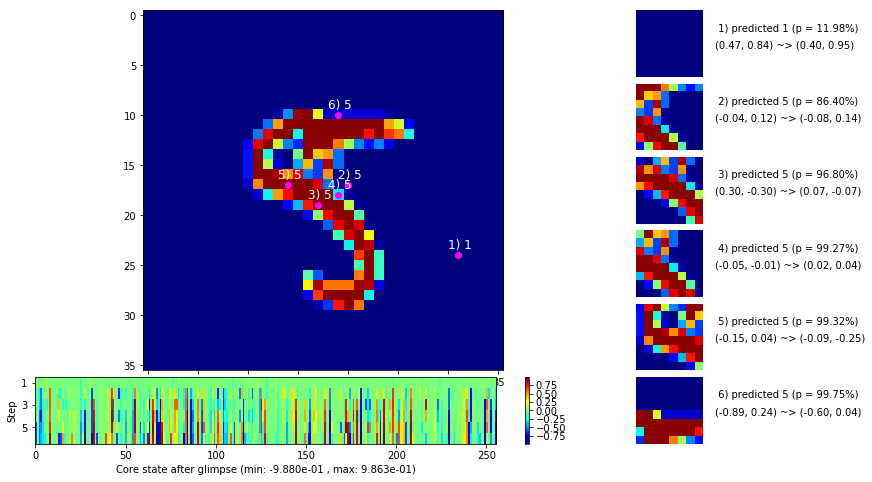

 b   1500/  3000 >> 134.7 ms/b | lr: 2.40e-04 | grad 2norm:  4.94 | grad inf norm:  1.255
       Weights || abs max:  1.08 (19355.56) | mean: -5.91e-03 ( 0.09) | var: 1.54e-02 ( 5517.10)
        Biases || abs max:  0.96 ( 1049.22) | mean:  1.37e-02 ( 0.79) | var: 6.53e-03 (22645.74)
                  class loss: 0.180 | steps: 2.102 | reward:  0.941 | acc.: 94.10%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.2 ms/b | lr: 2.35e-04 | grad 2norm:  4.75 | grad inf norm:  1.192
       Weights || abs max:  1.08 (30029.25) | mean: -5.79e-03 ( 0.11) | var: 1.55e-02 (19511.85)
        Biases || abs max:  0.96 ( 1357.14) | mean:  1.40e-02 ( 0.88) | var: 6.54e-03 (87056.57)
                  class loss: 0.175 | steps: 2.120 | reward:  0.946 | acc.: 94.56%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

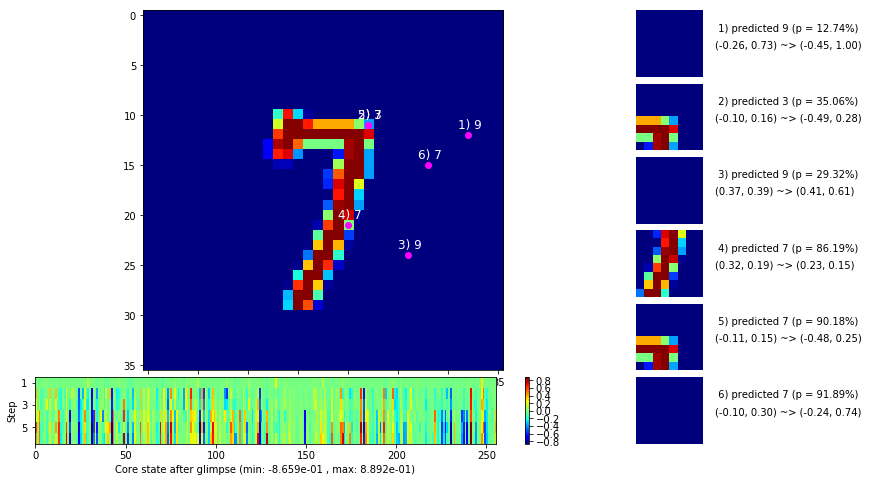

 b   2500/  3000 >> 134.9 ms/b | lr: 2.28e-04 | grad 2norm:  5.19 | grad inf norm:  1.292
       Weights || abs max:  1.09 (39597.77) | mean: -5.79e-03 ( 0.12) | var: 1.55e-02 (215847.66)
        Biases || abs max:  0.96 ( 1465.28) | mean:  1.39e-02 ( 1.03) | var: 6.54e-03 (26207.82)
                  class loss: 0.192 | steps: 2.095 | reward:  0.938 | acc.: 93.76%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.3 ms/b | lr: 2.24e-04 | grad 2norm:  5.03 | grad inf norm:  1.246
       Weights || abs max:  1.09 (27140.06) | mean: -5.78e-03 ( 0.10) | var: 1.56e-02 (39301.61)
        Biases || abs max:  0.96 ( 1529.56) | mean:  1.36e-02 ( 1.05) | var: 6.56e-03 (92359.47)
                  class loss: 0.195 | steps: 2.113 | reward:  0.940 | acc.: 94.02%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

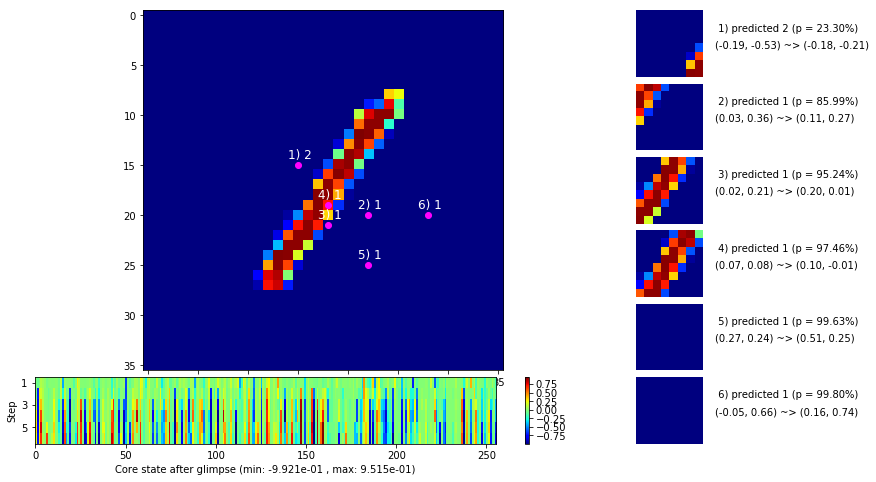

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


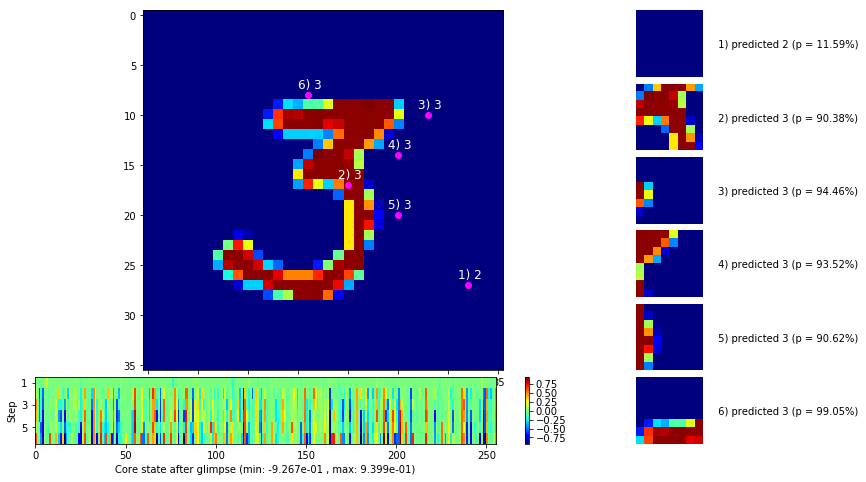


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


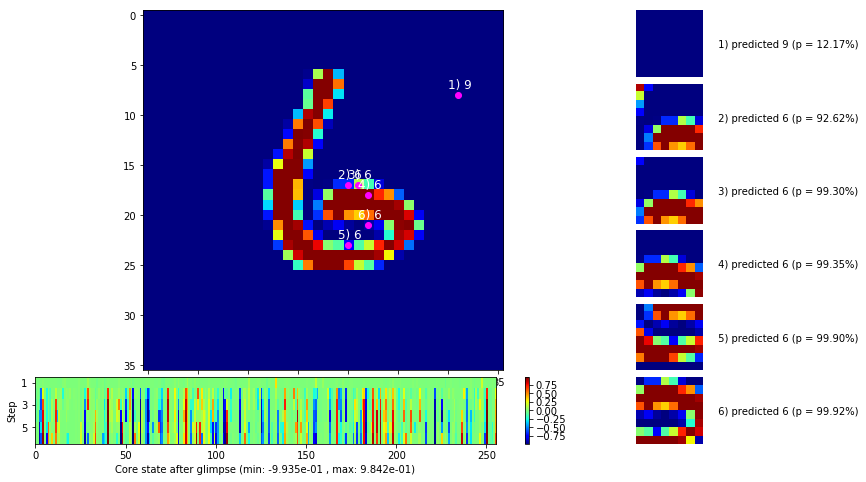

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


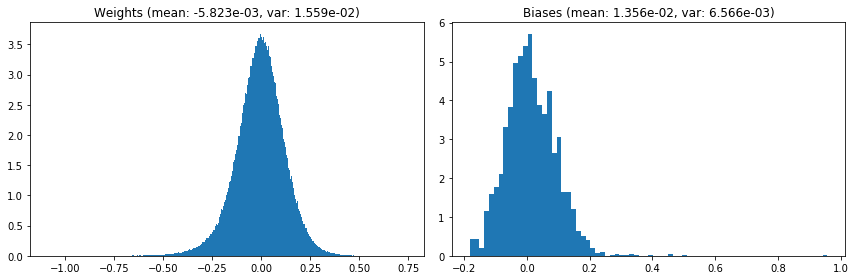

                                      Location network weights and biases


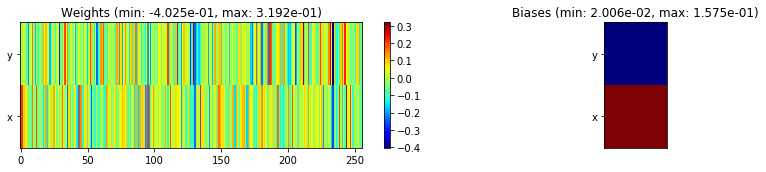

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.17 sec | TRAIN >> class loss: 0.1828 | steps:  2.110    | reward:  0.9410    | acc.: 94.100% 
                          | VAL   >> class loss: 0.1918 | steps:  2.004 :( | reward:  0.9360    | acc.: 93.600% 


Epoch  11/400) lr = 0.0002215
 b    500/  3000 >> 132.7 ms/b | lr: 2.17e-04 | grad 2norm:  4.85 | grad inf norm:  1.232
       Weights || abs max:  1.09 (43751.27) | mean: -5.81e-03 ( 0.13) | var: 1.56e-02 (124551.29)
        Biases || abs max:  0.96 ( 1748.65) | mean:  1.36e-02 ( 1.18) | var: 6.58e-03 (121398.70)
                  class loss: 0.174 | steps: 2.116 | reward:  0.944 | acc.: 94.36%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.7 ms/b | lr: 2.13e-04 | grad 2norm:  4.94 | grad inf norm:  1.218
       Weights || abs max:  1.09 (24547.24) | mean: -5.77e-03 ( 0.09) | v

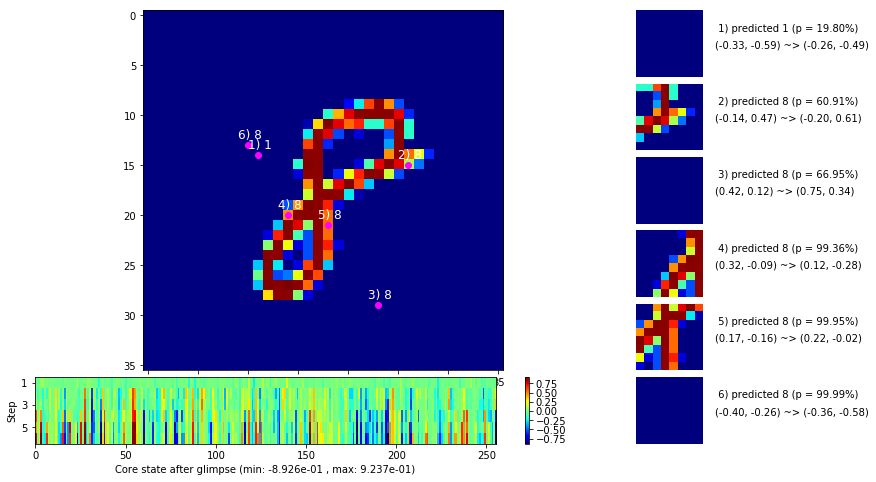

 b   1500/  3000 >> 140.4 ms/b | lr: 2.06e-04 | grad 2norm:  5.07 | grad inf norm:  1.293
       Weights || abs max:  1.09 (21954.23) | mean: -5.69e-03 ( 0.09) | var: 1.57e-02 ( 7573.63)
        Biases || abs max:  0.96 (  578.96) | mean:  1.40e-02 ( 0.55) | var: 6.61e-03 ( 2059.65)
                  class loss: 0.192 | steps: 2.120 | reward:  0.939 | acc.: 93.87%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.4 ms/b | lr: 2.02e-04 | grad 2norm:  5.04 | grad inf norm:  1.282
       Weights || abs max:  1.10 (32742.29) | mean: -5.66e-03 ( 0.11) | var: 1.57e-02 (86494.20)
        Biases || abs max:  0.96 ( 1681.91) | mean:  1.41e-02 ( 0.98) | var: 6.63e-03 (203759.23)
                  class loss: 0.187 | steps: 2.104 | reward:  0.940 | acc.: 93.95%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

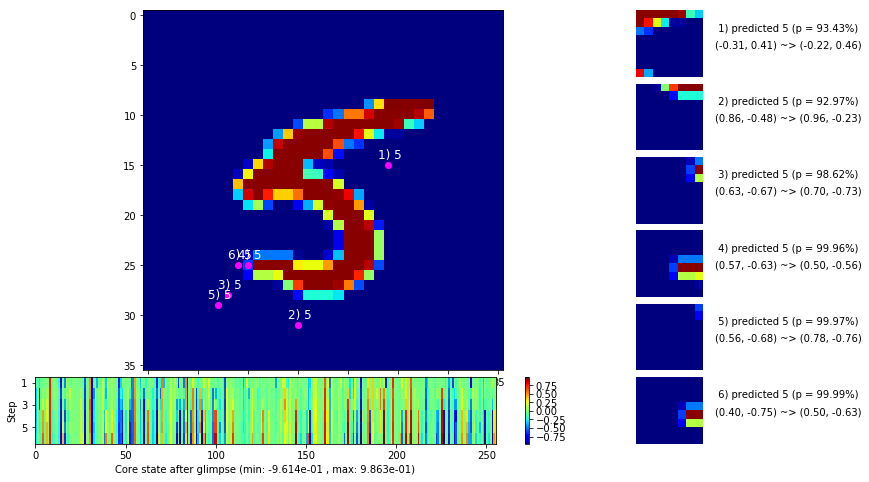

 b   2500/  3000 >> 134.8 ms/b | lr: 1.96e-04 | grad 2norm:  4.92 | grad inf norm:  1.227
       Weights || abs max:  1.10 (89741.21) | mean: -5.61e-03 ( 0.20) | var: 1.57e-02 (3477153.50)
        Biases || abs max:  0.96 ( 1380.69) | mean:  1.43e-02 ( 0.90) | var: 6.64e-03 (53892.86)
                  class loss: 0.176 | steps: 2.098 | reward:  0.942 | acc.: 94.19%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.6 ms/b | lr: 1.92e-04 | grad 2norm:  5.06 | grad inf norm:  1.267
       Weights || abs max:  1.11 (27623.95) | mean: -5.57e-03 ( 0.10) | var: 1.58e-02 (30674.18)
        Biases || abs max:  0.96 (  635.81) | mean:  1.44e-02 ( 0.64) | var: 6.64e-03 ( 4434.59)
                  class loss: 0.187 | steps: 2.086 | reward:  0.938 | acc.: 93.79%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

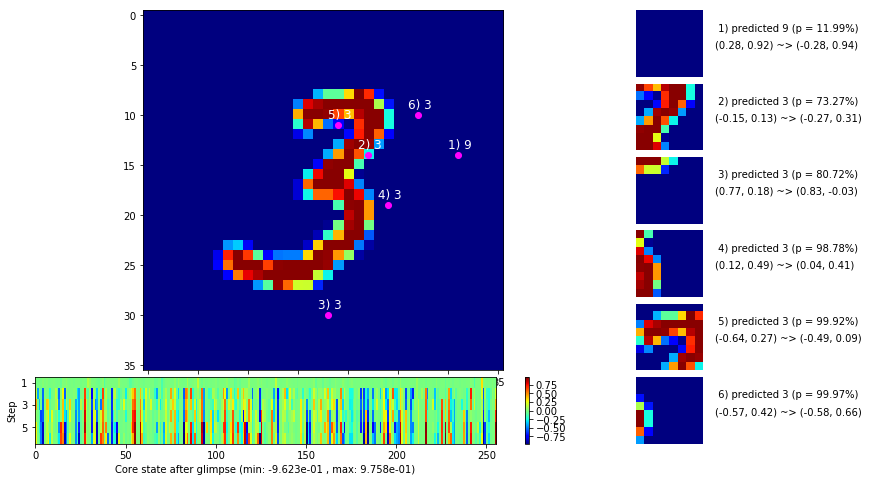

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


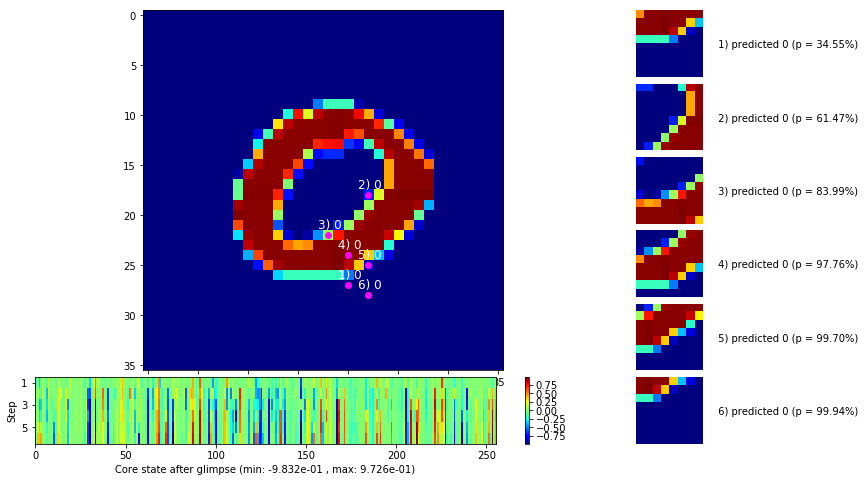


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


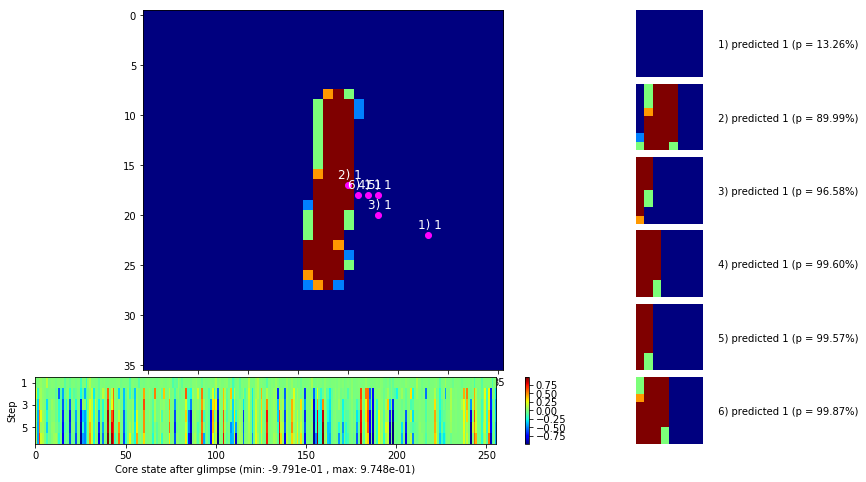

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


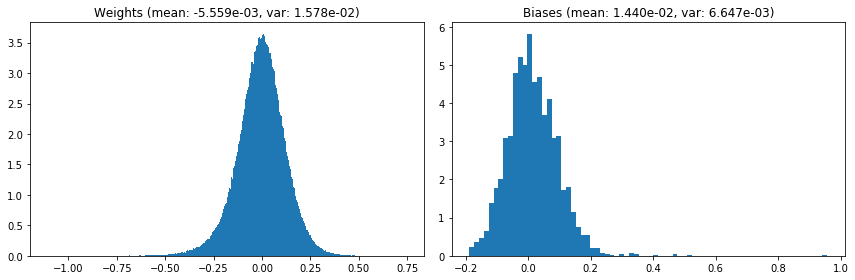

                                      Location network weights and biases


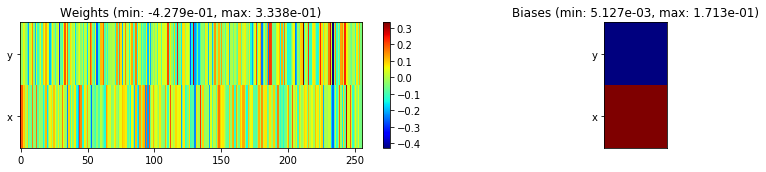

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.33 sec | TRAIN >> class loss: 0.1827 | steps:  2.104    | reward:  0.9404 :( | acc.: 94.035% :(
                          | VAL   >> class loss: 0.1857 | steps:  1.987    | reward:  0.9396    | acc.: 93.960% 


Epoch  12/400) lr = 0.0001905
 b    500/  3000 >> 133.4 ms/b | lr: 1.87e-04 | grad 2norm:  5.09 | grad inf norm:  1.213
       Weights || abs max:  1.10 (97063.18) | mean: -5.56e-03 ( 0.21) | var: 1.58e-02 (4342197.00)
        Biases || abs max:  0.96 ( 1437.30) | mean:  1.44e-02 ( 0.97) | var: 6.65e-03 (52606.48)
                  class loss: 0.182 | steps: 2.086 | reward:  0.940 | acc.: 93.97%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.4 ms/b | lr: 1.83e-04 | grad 2norm:  5.14 | grad inf norm:  1.317
       Weights || abs max:  1.11 (26556.82) | mean: -5.58e-03 ( 0.10) |

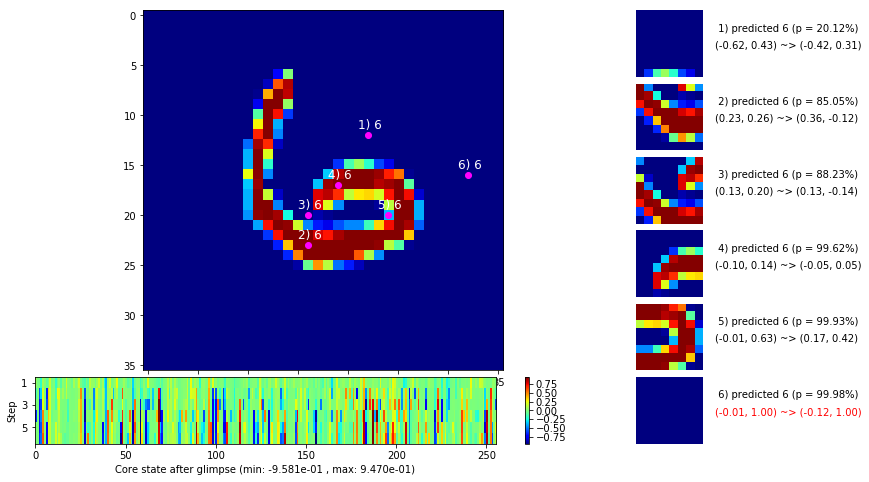

 b   1500/  3000 >> 133.9 ms/b | lr: 1.78e-04 | grad 2norm:  4.89 | grad inf norm:  1.241
       Weights || abs max:  1.11 (170765.70) | mean: -5.61e-03 ( 0.34) | var: 1.58e-02 (16340103.00)
        Biases || abs max:  0.96 ( 7992.87) | mean:  1.40e-02 ( 3.58) | var: 6.64e-03 (9735110.00)
                  class loss: 0.190 | steps: 2.101 | reward:  0.940 | acc.: 93.96%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.6 ms/b | lr: 1.74e-04 | grad 2norm:  5.01 | grad inf norm:  1.243
       Weights || abs max:  1.11 (47302.24) | mean: -5.58e-03 ( 0.13) | var: 1.59e-02 (335608.09)
        Biases || abs max:  0.96 ( 1653.72) | mean:  1.41e-02 ( 1.12) | var: 6.65e-03 (44324.84)
                  class loss: 0.183 | steps: 2.117 | reward:  0.939 | acc.: 93.86%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.

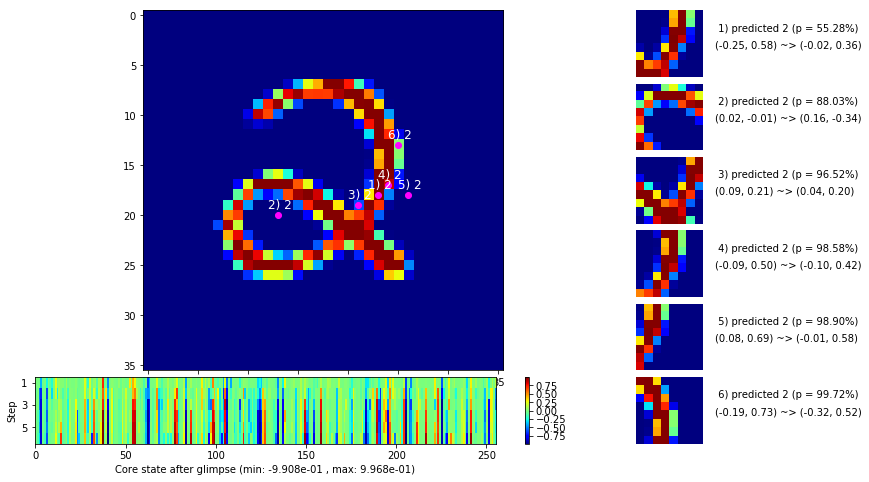

 b   2500/  3000 >> 133.6 ms/b | lr: 1.69e-04 | grad 2norm:  5.19 | grad inf norm:  1.286
       Weights || abs max:  1.11 (30386.66) | mean: -5.54e-03 ( 0.11) | var: 1.59e-02 (31905.02)
        Biases || abs max:  0.96 ( 3025.31) | mean:  1.42e-02 ( 1.72) | var: 6.66e-03 (111732.95)
                  class loss: 0.193 | steps: 2.115 | reward:  0.934 | acc.: 93.44%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 141.5 ms/b | lr: 1.65e-04 | grad 2norm:  5.08 | grad inf norm:  1.266
       Weights || abs max:  1.12 (42439.33) | mean: -5.48e-03 ( 0.13) | var: 1.59e-02 (518809.22)
        Biases || abs max:  0.96 ( 2471.19) | mean:  1.44e-02 ( 1.42) | var: 6.65e-03 (552891.00)
                  class loss: 0.189 | steps: 2.122 | reward:  0.939 | acc.: 93.85%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

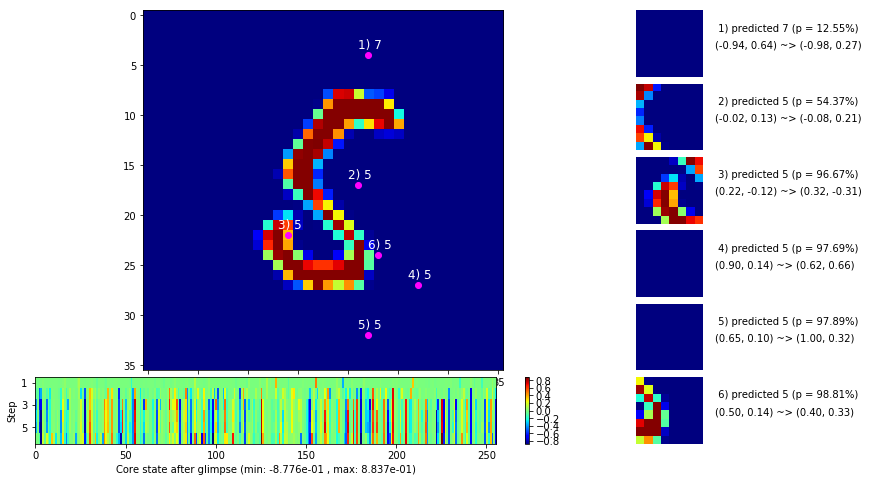

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


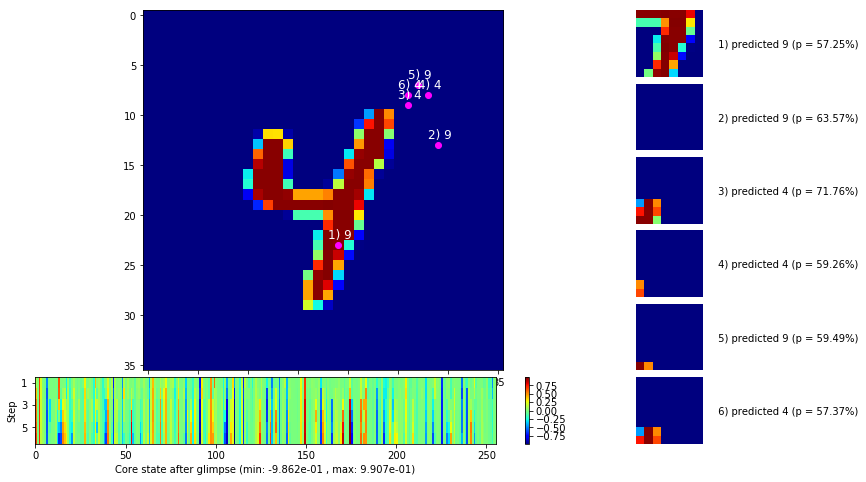


	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


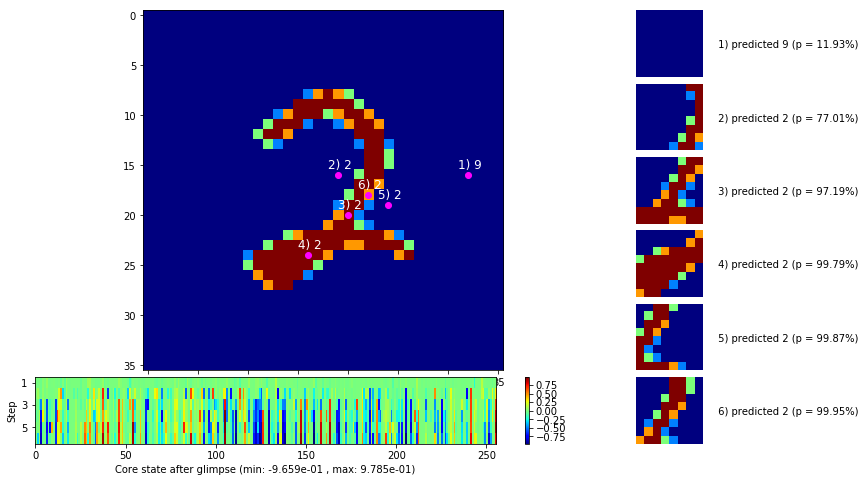

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


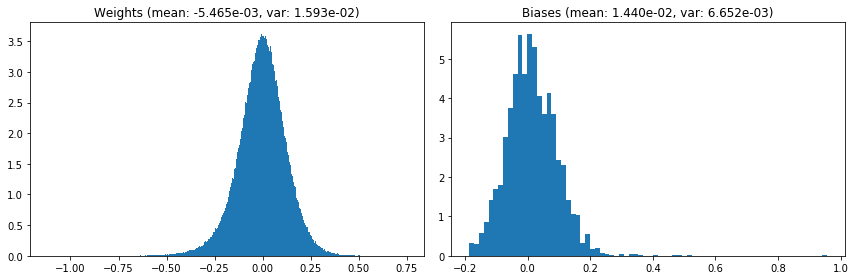

                                      Location network weights and biases


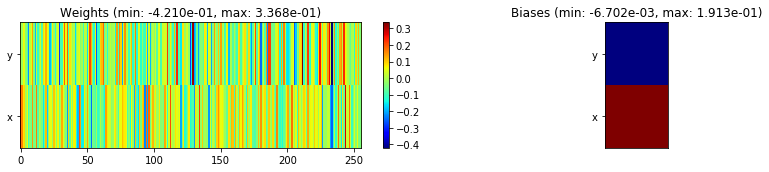

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.30 sec | TRAIN >> class loss: 0.1891 | steps:  2.110 :( | reward:  0.9377 :( | acc.: 93.775% :(
                          | VAL   >> class loss: 0.2085 | steps:  2.024 :( | reward:  0.9346 :( | acc.: 93.460% :(


Epoch  13/400) lr = 0.0001638
 b    500/  3000 >> 133.4 ms/b | lr: 1.61e-04 | grad 2norm:  5.25 | grad inf norm:  1.253
       Weights || abs max:  1.12 (34011.52) | mean: -5.44e-03 ( 0.11) | var: 1.59e-02 (104903.06)
        Biases || abs max:  0.96 ( 2387.89) | mean:  1.45e-02 ( 1.42) | var: 6.67e-03 (85648.30)
                  class loss: 0.192 | steps: 2.119 | reward:  0.935 | acc.: 93.51%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.2 ms/b | lr: 1.57e-04 | grad 2norm:  5.15 | grad inf norm:  1.259
       Weights || abs max:  1.12 (128994.98) | mean: -5.44e-03 ( 0.27)

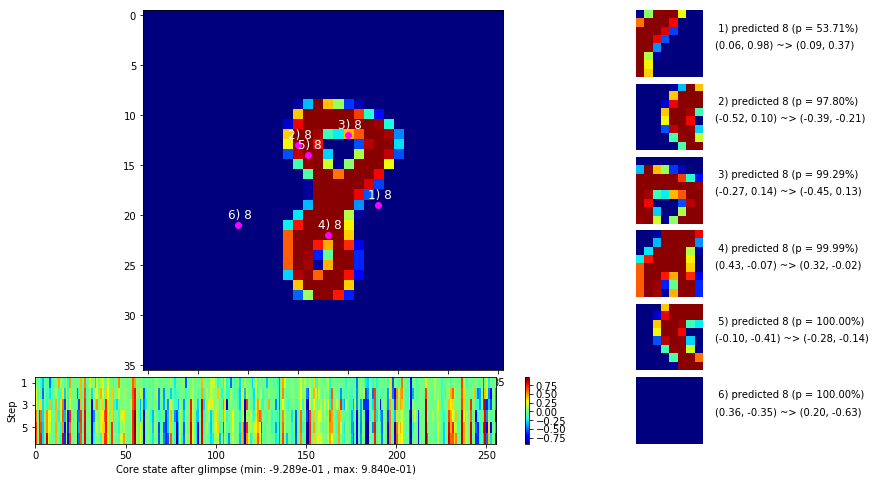

 b   1500/  3000 >> 134.5 ms/b | lr: 1.53e-04 | grad 2norm:  5.14 | grad inf norm:  1.259
       Weights || abs max:  1.13 (27397.51) | mean: -5.41e-03 ( 0.10) | var: 1.60e-02 (25397.44)
        Biases || abs max:  0.96 (  675.20) | mean:  1.45e-02 ( 0.64) | var: 6.66e-03 ( 1852.19)
                  class loss: 0.199 | steps: 2.117 | reward:  0.937 | acc.: 93.70%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.5 ms/b | lr: 1.50e-04 | grad 2norm:  5.00 | grad inf norm:  1.266
       Weights || abs max:  1.13 (15673.69) | mean: -5.39e-03 ( 0.08) | var: 1.60e-02 ( 6279.50)
        Biases || abs max:  0.96 (  662.23) | mean:  1.46e-02 ( 0.61) | var: 6.66e-03 ( 3949.72)
                  class loss: 0.191 | steps: 2.101 | reward:  0.937 | acc.: 93.74%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

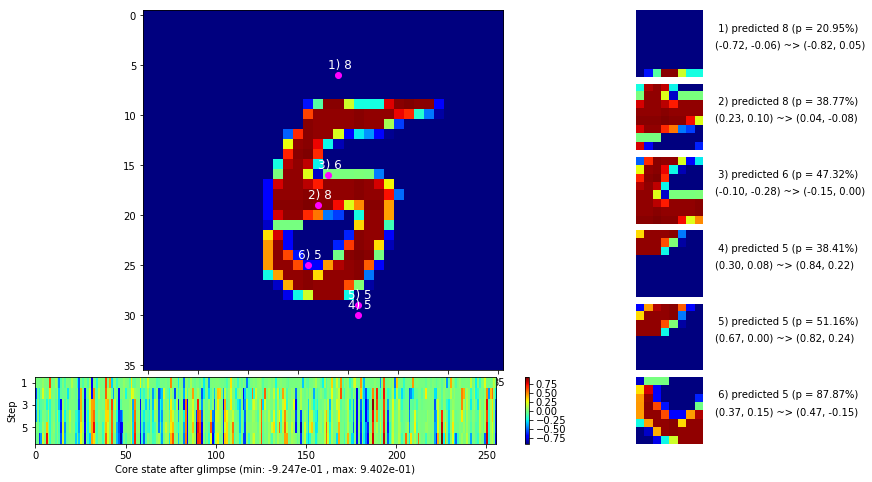

 b   2500/  3000 >> 135.2 ms/b | lr: 1.45e-04 | grad 2norm:  5.26 | grad inf norm:  1.353
       Weights || abs max:  1.13 (31716.30) | mean: -5.35e-03 ( 0.11) | var: 1.60e-02 (203348.22)
        Biases || abs max:  0.96 (  950.91) | mean:  1.48e-02 ( 0.77) | var: 6.65e-03 (28511.42)
                  class loss: 0.201 | steps: 2.103 | reward:  0.935 | acc.: 93.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.7 ms/b | lr: 1.42e-04 | grad 2norm:  5.13 | grad inf norm:  1.264
       Weights || abs max:  1.13 (26916.59) | mean: -5.30e-03 ( 0.10) | var: 1.61e-02 (48559.86)
        Biases || abs max:  0.96 ( 2102.25) | mean:  1.49e-02 ( 1.31) | var: 6.66e-03 (287412.34)
                  class loss: 0.184 | steps: 2.094 | reward:  0.938 | acc.: 93.76%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

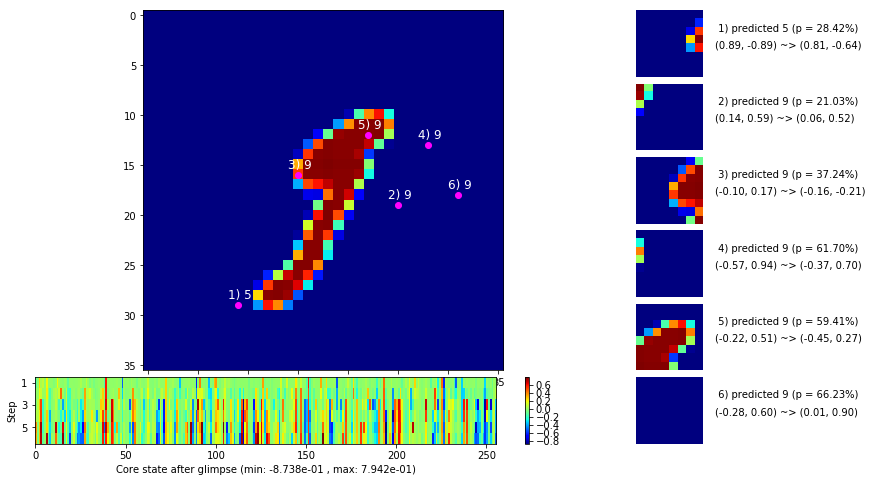

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


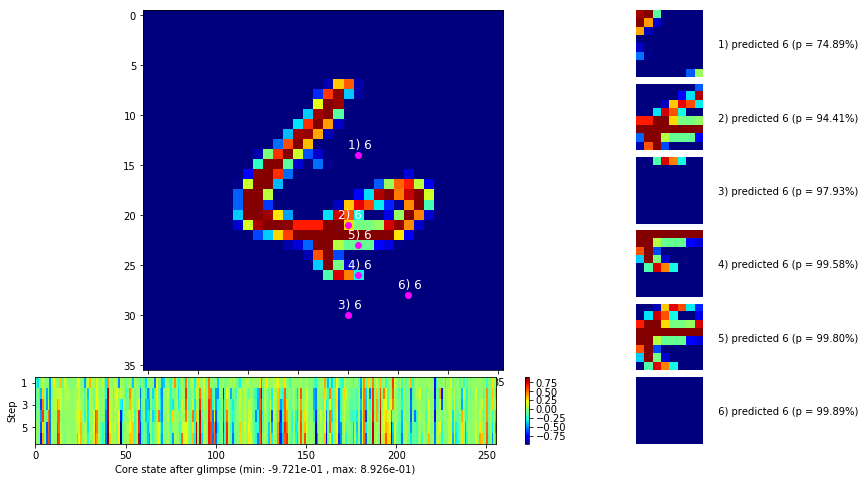


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


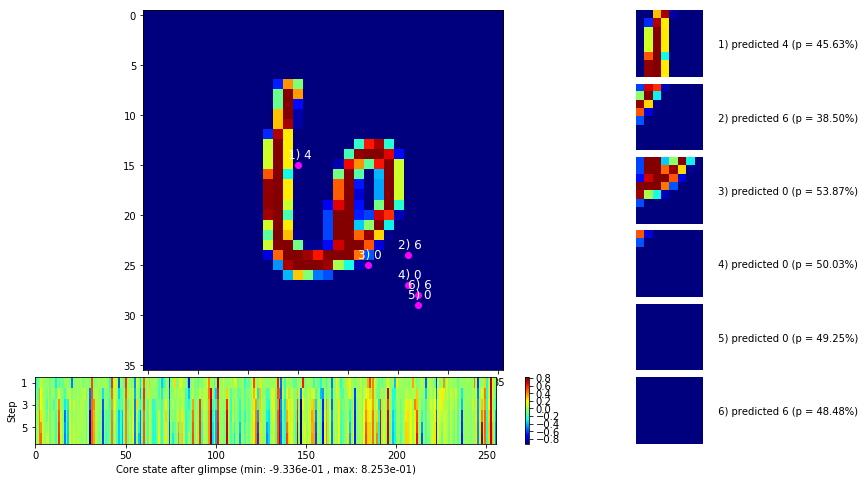

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


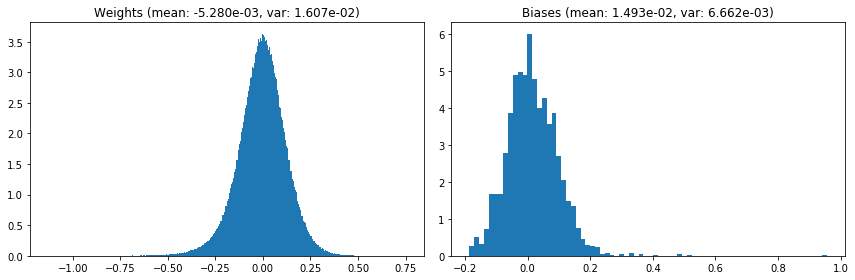

                                      Location network weights and biases


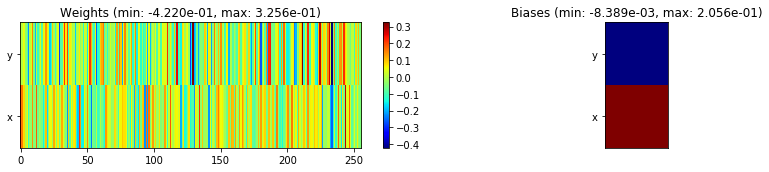

---------------------------------------------------------------------------------------------------------------
Elapsed time:  401.80 sec | TRAIN >> class loss: 0.1927 | steps:  2.107 :( | reward:  0.9366 :( | acc.: 93.657% :(
                          | VAL   >> class loss: 0.1934 | steps:  1.996 :( | reward:  0.9362 :( | acc.: 93.620% :(


Epoch  14/400) lr = 0.0001409
 b    500/  3000 >> 131.6 ms/b | lr: 1.38e-04 | grad 2norm:  5.10 | grad inf norm:  1.243
       Weights || abs max:  1.13 (21771.75) | mean: -5.28e-03 ( 0.09) | var: 1.61e-02 ( 7164.23)
        Biases || abs max:  0.96 ( 1004.49) | mean:  1.49e-02 ( 0.83) | var: 6.69e-03 ( 5220.22)
                  class loss: 0.197 | steps: 2.083 | reward:  0.938 | acc.: 93.83%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.3 ms/b | lr: 1.35e-04 | grad 2norm:  5.18 | grad inf norm:  1.264
       Weights || abs max:  1.13 (29892.45) | mean: -5.28e-03 ( 0.10) |

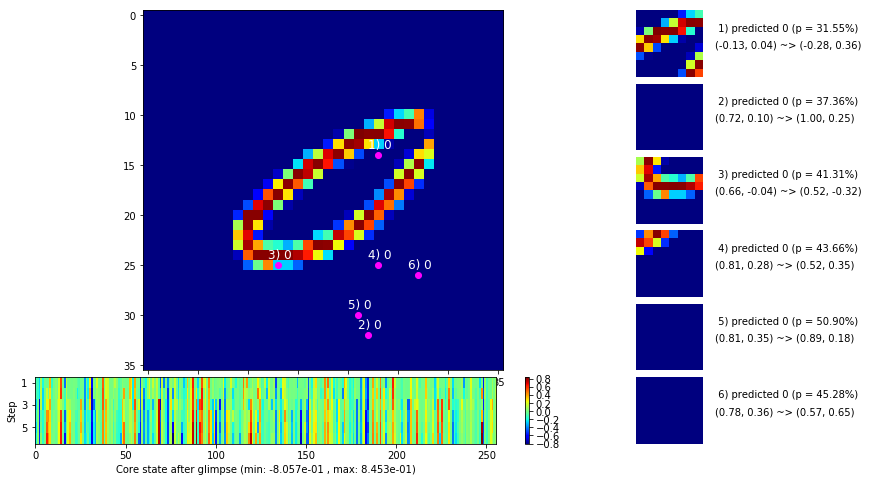

 b   1500/  3000 >> 146.7 ms/b | lr: 1.31e-04 | grad 2norm:  5.10 | grad inf norm:  1.248
       Weights || abs max:  1.14 (89039.97) | mean: -5.25e-03 ( 0.20) | var: 1.61e-02 (4310548.00)
        Biases || abs max:  0.96 ( 1035.42) | mean:  1.50e-02 ( 0.81) | var: 6.68e-03 ( 8186.62)
                  class loss: 0.185 | steps: 2.120 | reward:  0.938 | acc.: 93.77%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.7 ms/b | lr: 1.29e-04 | grad 2norm:  5.29 | grad inf norm:  1.303
       Weights || abs max:  1.14 (47016.98) | mean: -5.25e-03 ( 0.13) | var: 1.61e-02 (107737.53)
        Biases || abs max:  0.96 (  715.25) | mean:  1.50e-02 ( 0.64) | var: 6.67e-03 ( 6683.50)
                  class loss: 0.194 | steps: 2.102 | reward:  0.935 | acc.: 93.49%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

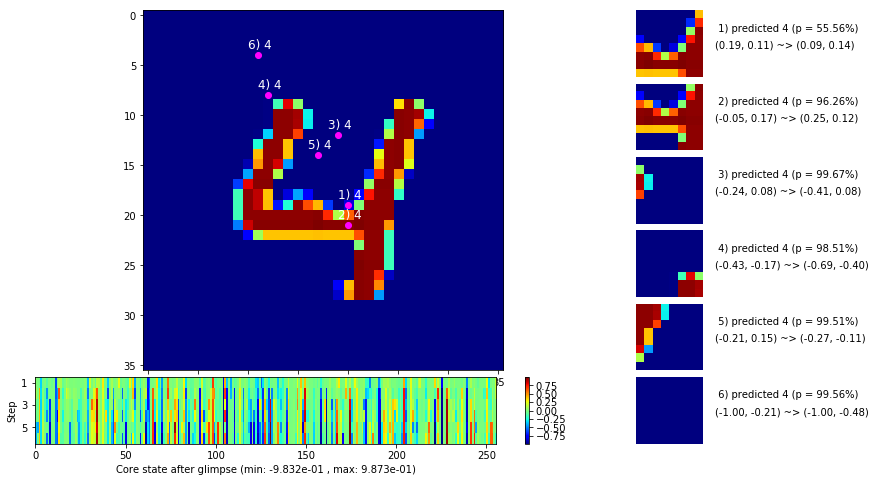

 b   2500/  3000 >> 133.9 ms/b | lr: 1.25e-04 | grad 2norm:  5.25 | grad inf norm:  1.270
       Weights || abs max:  1.14 (29307.23) | mean: -5.24e-03 ( 0.11) | var: 1.61e-02 (74758.31)
        Biases || abs max:  0.96 (  991.87) | mean:  1.51e-02 ( 0.86) | var: 6.66e-03 (10282.08)
                  class loss: 0.199 | steps: 2.098 | reward:  0.935 | acc.: 93.48%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.1 ms/b | lr: 1.22e-04 | grad 2norm:  5.33 | grad inf norm:  1.326
       Weights || abs max:  1.14 (76585.56) | mean: -5.25e-03 ( 0.18) | var: 1.61e-02 (1606251.75)
        Biases || abs max:  0.95 (  834.78) | mean:  1.50e-02 ( 0.74) | var: 6.67e-03 ( 3658.83)
                  class loss: 0.205 | steps: 2.103 | reward:  0.932 | acc.: 93.20%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

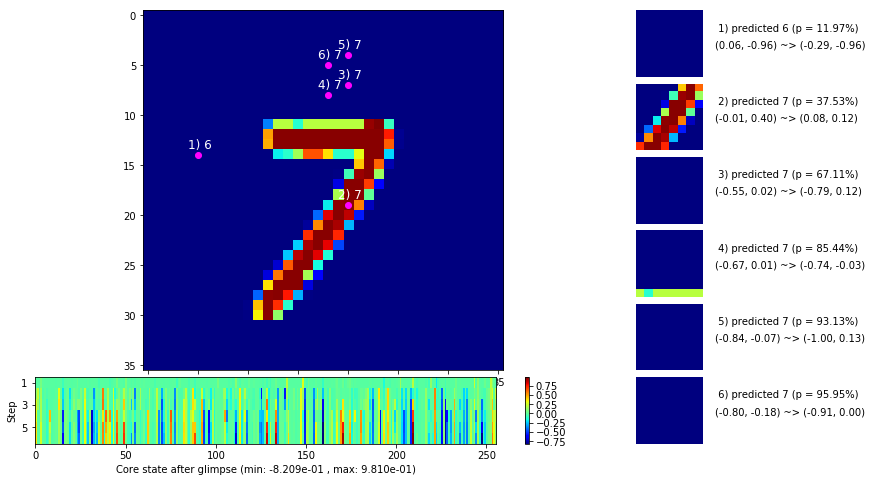

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


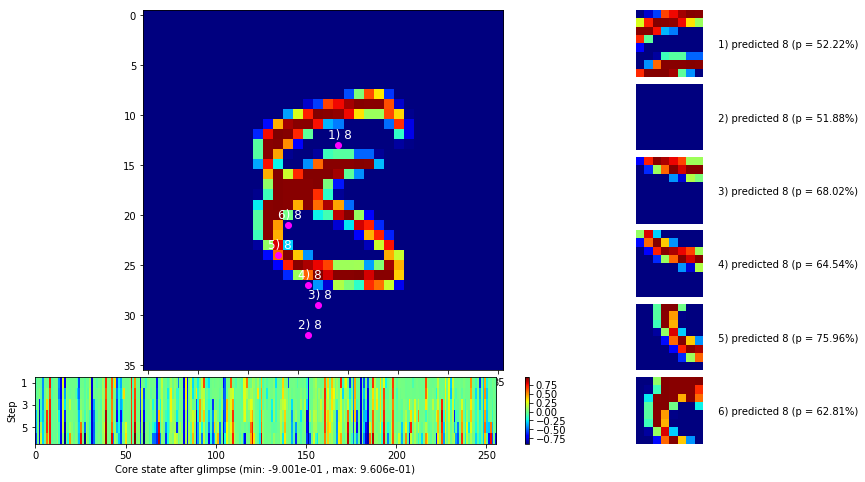


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


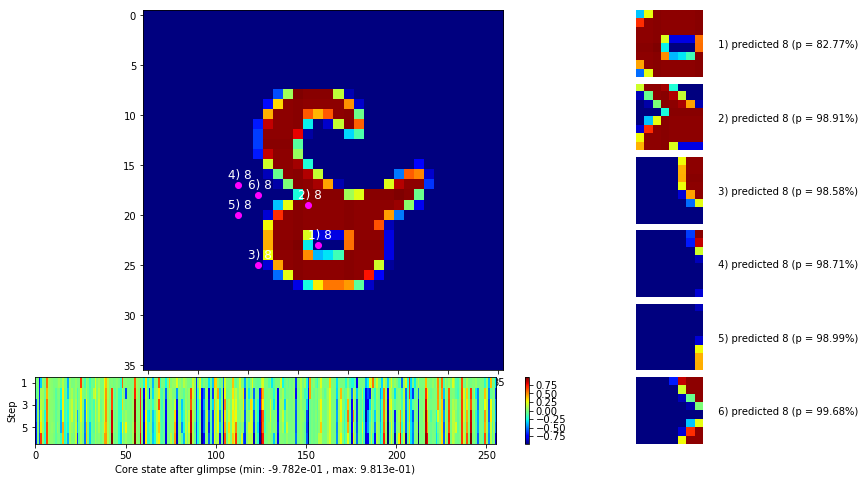

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


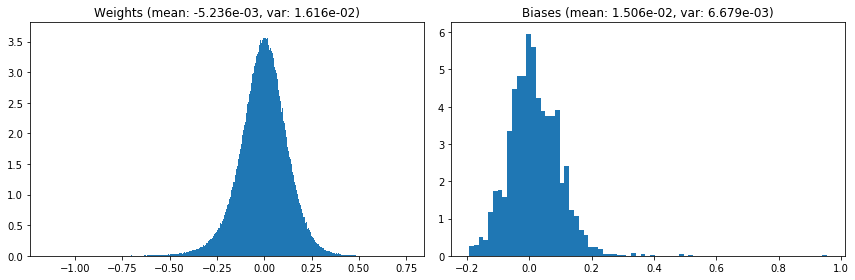

                                      Location network weights and biases


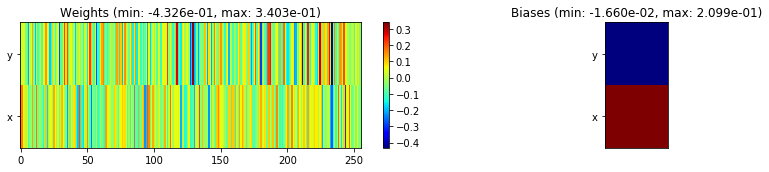

---------------------------------------------------------------------------------------------------------------
Elapsed time:  405.35 sec | TRAIN >> class loss: 0.1955 | steps:  2.101    | reward:  0.9360 :( | acc.: 93.597% :(
                          | VAL   >> class loss: 0.1950 | steps:  1.992 :( | reward:  0.9362 :( | acc.: 93.620% :(


Epoch  15/400) lr = 0.0001212
 b    500/  3000 >> 133.8 ms/b | lr: 1.19e-04 | grad 2norm:  5.17 | grad inf norm:  1.282
       Weights || abs max:  1.14 (51155.82) | mean: -5.20e-03 ( 0.13) | var: 1.62e-02 (303708.91)
        Biases || abs max:  0.95 ( 1048.74) | mean:  1.52e-02 ( 0.88) | var: 6.68e-03 ( 8679.76)
                  class loss: 0.198 | steps: 2.095 | reward:  0.934 | acc.: 93.45%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.1 ms/b | lr: 1.16e-04 | grad 2norm:  5.19 | grad inf norm:  1.245
       Weights || abs max:  1.14 (25215.68) | mean: -5.21e-03 ( 0.09) 

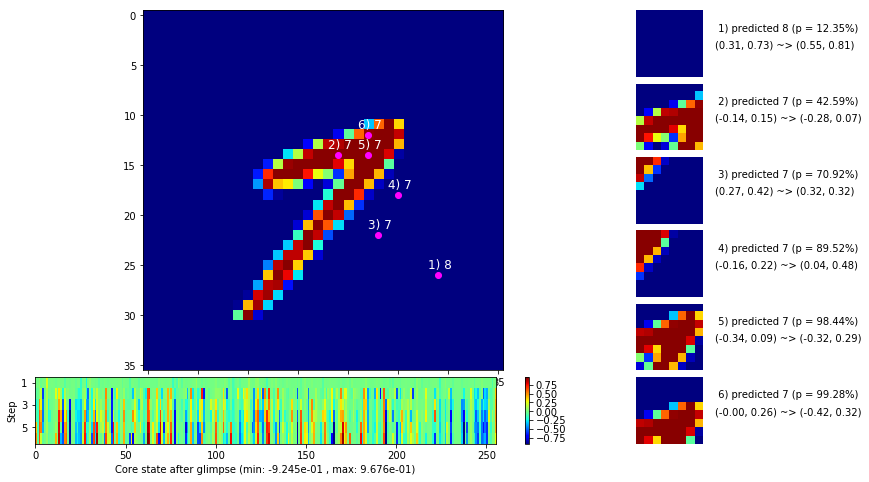

 b   1500/  3000 >> 133.5 ms/b | lr: 1.13e-04 | grad 2norm:  5.21 | grad inf norm:  1.301
       Weights || abs max:  1.14 (45201.81) | mean: -5.22e-03 ( 0.13) | var: 1.62e-02 (272443.91)
        Biases || abs max:  0.95 (  998.03) | mean:  1.52e-02 ( 0.83) | var: 6.67e-03 ( 6035.88)
                  class loss: 0.200 | steps: 2.099 | reward:  0.935 | acc.: 93.52%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.3 ms/b | lr: 1.11e-04 | grad 2norm:  5.20 | grad inf norm:  1.311
       Weights || abs max:  1.14 (42016.63) | mean: -5.19e-03 ( 0.12) | var: 1.62e-02 (323969.97)
        Biases || abs max:  0.95 ( 2276.86) | mean:  1.53e-02 ( 1.35) | var: 6.69e-03 (198814.23)
                  class loss: 0.198 | steps: 2.114 | reward:  0.935 | acc.: 93.47%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0

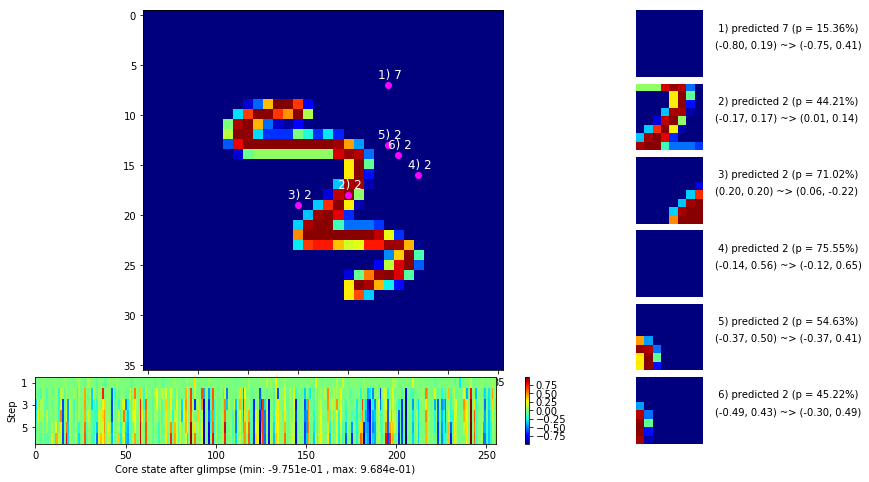

 b   2500/  3000 >> 134.9 ms/b | lr: 1.07e-04 | grad 2norm:  5.45 | grad inf norm:  1.342
       Weights || abs max:  1.13 (93593.46) | mean: -5.22e-03 ( 0.21) | var: 1.62e-02 (4203445.50)
        Biases || abs max:  0.95 ( 2347.32) | mean:  1.52e-02 ( 1.27) | var: 6.68e-03 (192050.42)
                  class loss: 0.210 | steps: 2.105 | reward:  0.930 | acc.: 93.03%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 143.9 ms/b | lr: 1.05e-04 | grad 2norm:  5.14 | grad inf norm:  1.286
       Weights || abs max:  1.13 (20546.43) | mean: -5.20e-03 ( 0.09) | var: 1.62e-02 ( 5219.08)
        Biases || abs max:  0.95 (  631.70) | mean:  1.53e-02 ( 0.60) | var: 6.69e-03 ( 2596.60)
                  class loss: 0.186 | steps: 2.112 | reward:  0.938 | acc.: 93.84%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

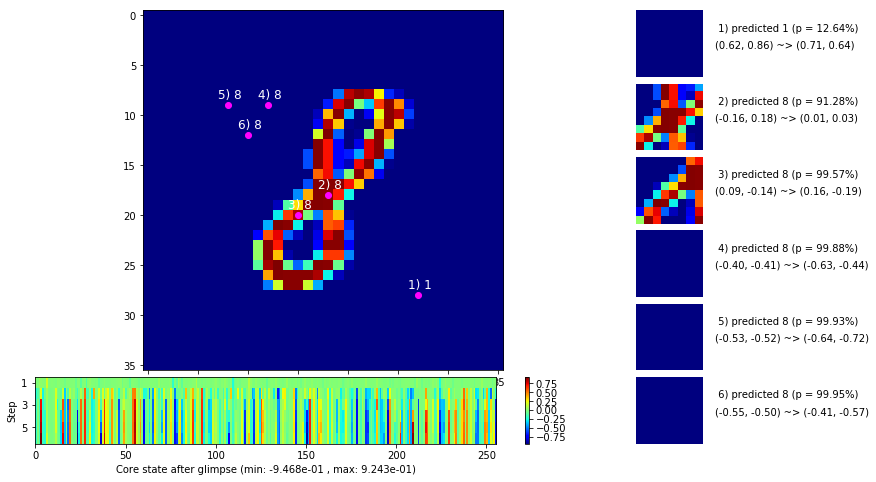

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


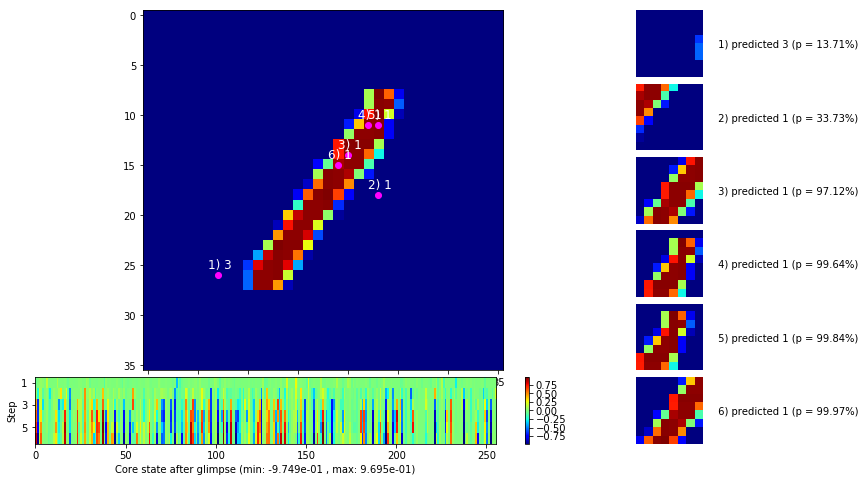


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


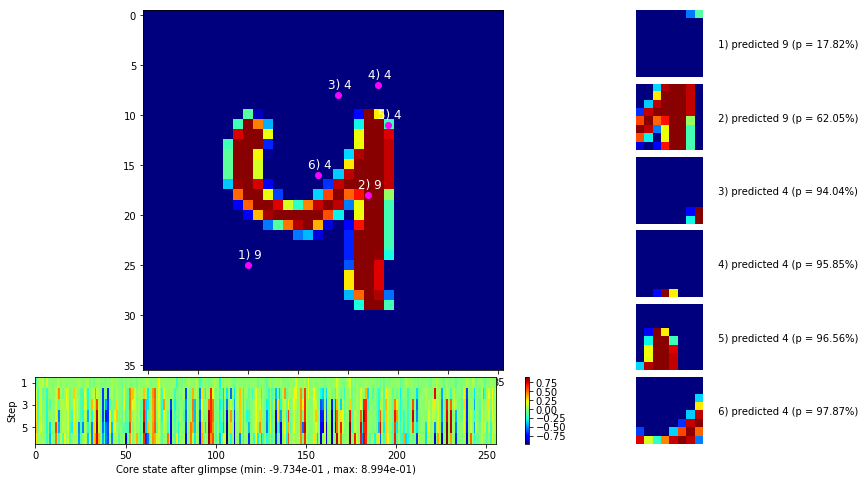

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


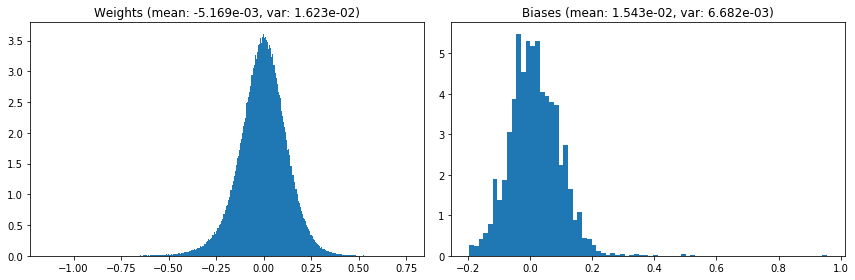

                                      Location network weights and biases


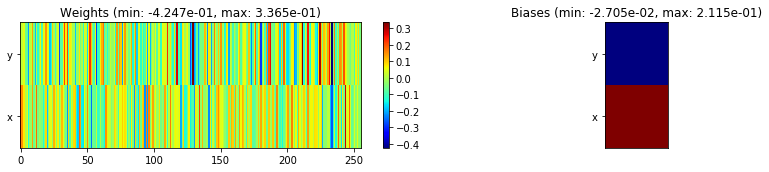

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.24 sec | TRAIN >> class loss: 0.1979 | steps:  2.106 :( | reward:  0.9347 :( | acc.: 93.468% :(
                          | VAL   >> class loss: 0.1797 | steps:  1.980    | reward:  0.9412    | acc.: 94.120% 


Epoch  16/400) lr = 0.0001042
 b    500/  3000 >> 132.5 ms/b | lr: 1.02e-04 | grad 2norm:  5.09 | grad inf norm:  1.265
       Weights || abs max:  1.13 (48655.46) | mean: -5.17e-03 ( 0.14) | var: 1.62e-02 (675720.00)
        Biases || abs max:  0.96 ( 1028.77) | mean:  1.54e-02 ( 0.79) | var: 6.68e-03 ( 7302.40)
                  class loss: 0.193 | steps: 2.106 | reward:  0.937 | acc.: 93.69%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.4 ms/b | lr: 1.00e-04 | grad 2norm:  5.34 | grad inf norm:  1.294
       Weights || abs max:  1.13 (22044.52) | mean: -5.14e-03 ( 0.09) | 

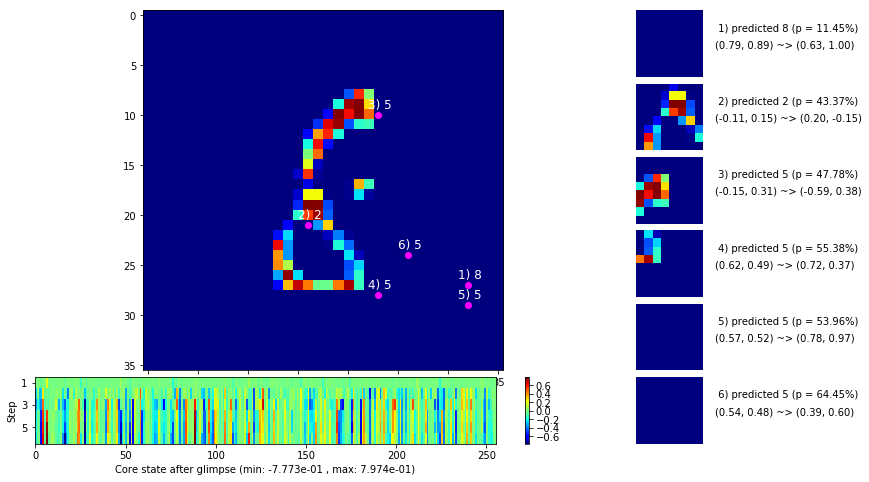

 b   1500/  3000 >> 134.4 ms/b | lr: 9.71e-05 | grad 2norm:  5.35 | grad inf norm:  1.345
       Weights || abs max:  1.14 (63038.17) | mean: -5.13e-03 ( 0.16) | var: 1.63e-02 (695067.56)
        Biases || abs max:  0.95 ( 1214.61) | mean:  1.55e-02 ( 0.97) | var: 6.68e-03 (10652.35)
                  class loss: 0.200 | steps: 2.130 | reward:  0.933 | acc.: 93.32%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 132.5 ms/b | lr: 9.52e-05 | grad 2norm:  5.24 | grad inf norm:  1.288
       Weights || abs max:  1.14 (36198.50) | mean: -5.12e-03 ( 0.11) | var: 1.63e-02 (143733.83)
        Biases || abs max:  0.95 (  773.82) | mean:  1.55e-02 ( 0.77) | var: 6.68e-03 (13068.14)
                  class loss: 0.194 | steps: 2.091 | reward:  0.935 | acc.: 93.49%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

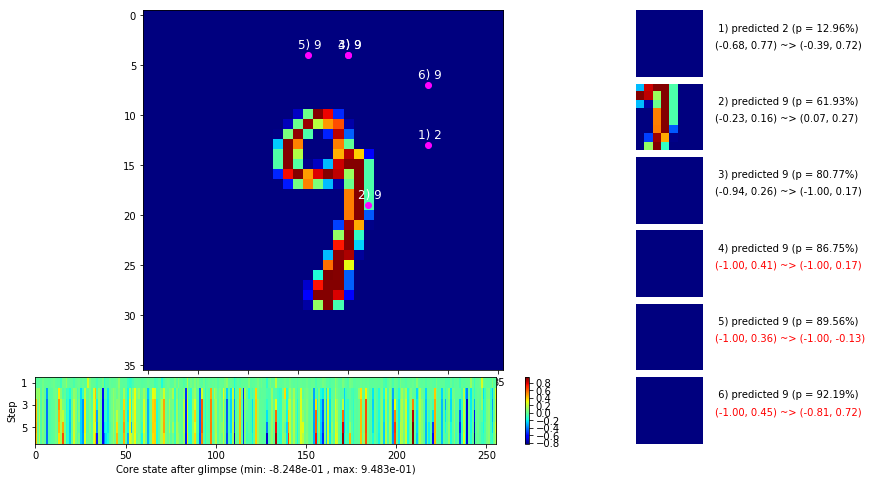

 b   2500/  3000 >> 134.4 ms/b | lr: 9.24e-05 | grad 2norm:  5.21 | grad inf norm:  1.287
       Weights || abs max:  1.14 (86075.42) | mean: -5.08e-03 ( 0.21) | var: 1.63e-02 (1022489.69)
        Biases || abs max:  0.95 (  577.61) | mean:  1.57e-02 ( 0.60) | var: 6.68e-03 ( 3700.74)
                  class loss: 0.194 | steps: 2.078 | reward:  0.934 | acc.: 93.45%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.4 ms/b | lr: 9.05e-05 | grad 2norm:  5.38 | grad inf norm:  1.319
       Weights || abs max:  1.15 (55356.02) | mean: -5.05e-03 ( 0.15) | var: 1.63e-02 (420804.16)
        Biases || abs max:  0.95 ( 5630.34) | mean:  1.58e-02 ( 2.60) | var: 6.69e-03 (3882260.50)
                  class loss: 0.204 | steps: 2.094 | reward:  0.931 | acc.: 93.15%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

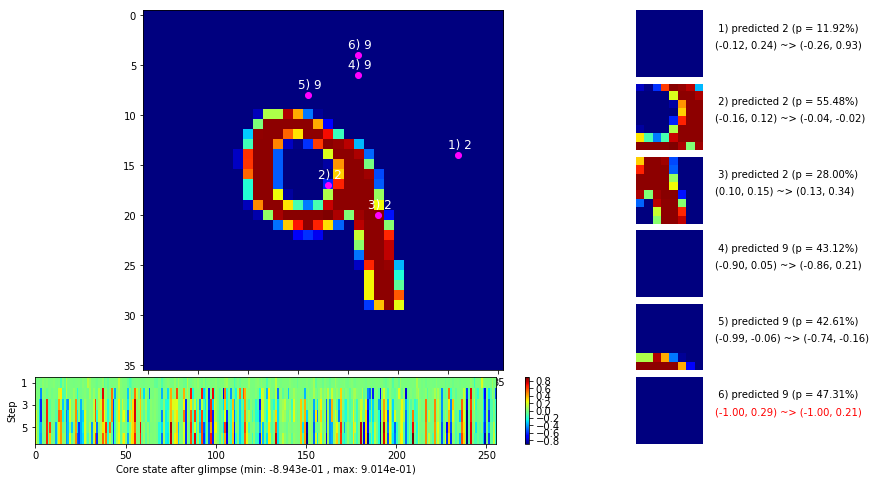

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


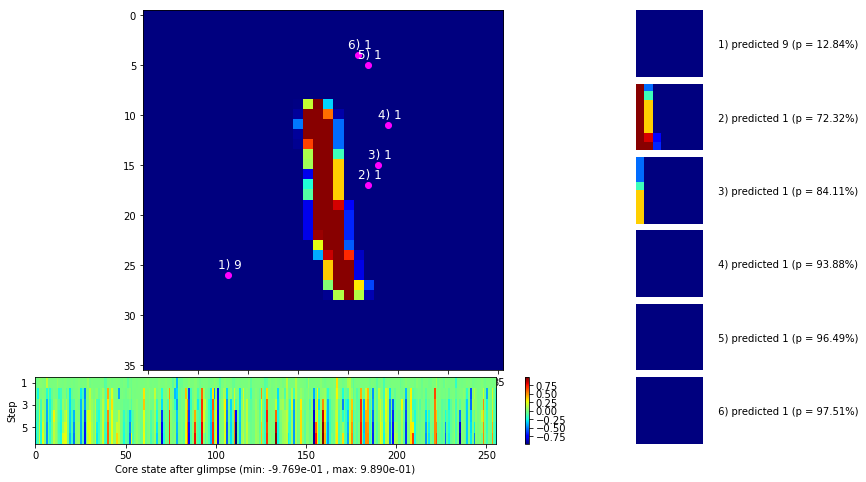


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


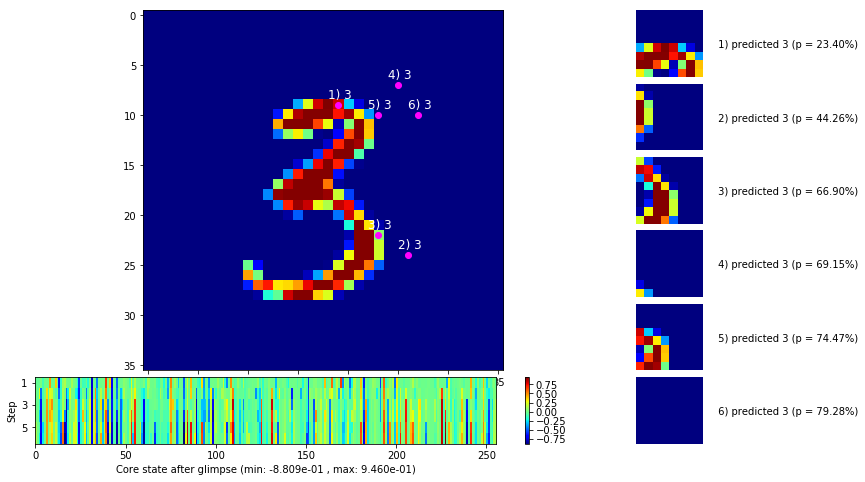

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


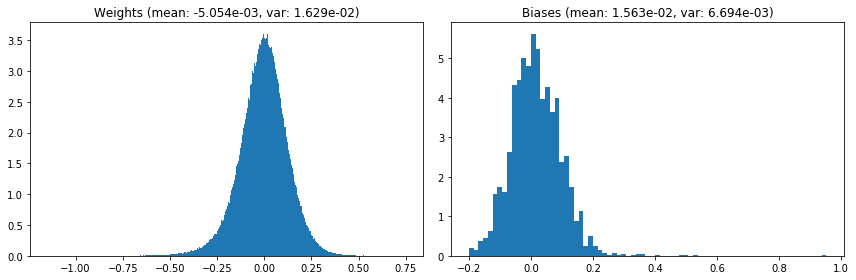

                                      Location network weights and biases


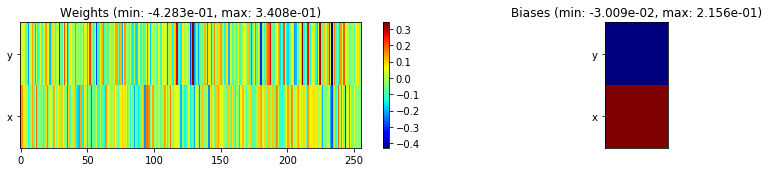

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.35 sec | TRAIN >> class loss: 0.1972 | steps:  2.101 :( | reward:  0.9340 :( | acc.: 93.397% :(
                          | VAL   >> class loss: 0.2010 | steps:  1.983 :( | reward:  0.9344 :( | acc.: 93.440% :(


Epoch  17/400) lr = 8.963e-05
 b    500/  3000 >> 133.5 ms/b | lr: 8.78e-05 | grad 2norm:  5.36 | grad inf norm:  1.331
       Weights || abs max:  1.14 (20925.65) | mean: -5.03e-03 ( 0.09) | var: 1.63e-02 (17670.81)
        Biases || abs max:  0.95 ( 2680.15) | mean:  1.57e-02 ( 1.88) | var: 6.69e-03 (452095.12)
                  class loss: 0.204 | steps: 2.117 | reward:  0.932 | acc.: 93.19%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 139.7 ms/b | lr: 8.61e-05 | grad 2norm:  5.32 | grad inf norm:  1.341
       Weights || abs max:  1.14 (31126.09) | mean: -5.01e-03 ( 0.11) 

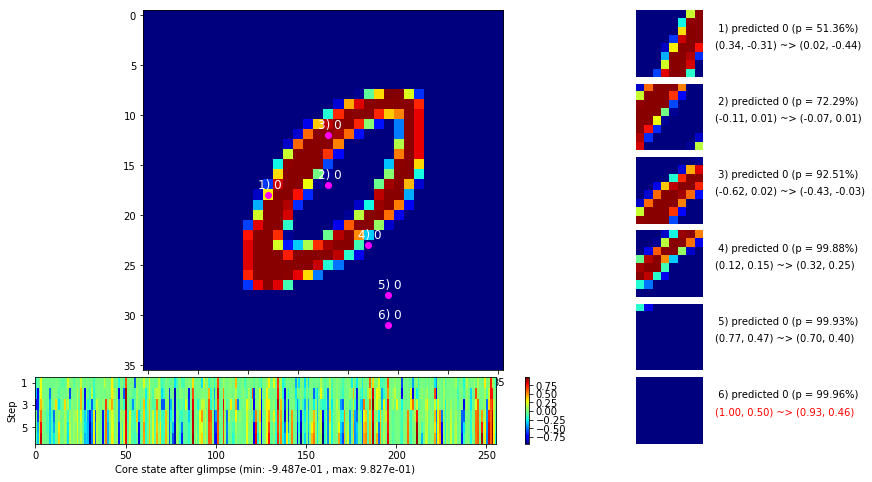

 b   1500/  3000 >> 140.4 ms/b | lr: 8.35e-05 | grad 2norm:  5.36 | grad inf norm:  1.291
       Weights || abs max:  1.15 (56770.98) | mean: -5.00e-03 ( 0.15) | var: 1.63e-02 (362533.81)
        Biases || abs max:  0.95 (  963.53) | mean:  1.58e-02 ( 0.87) | var: 6.70e-03 (11674.74)
                  class loss: 0.197 | steps: 2.101 | reward:  0.933 | acc.: 93.35%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.8 ms/b | lr: 8.19e-05 | grad 2norm:  5.20 | grad inf norm:  1.282
       Weights || abs max:  1.15 (31646.77) | mean: -4.97e-03 ( 0.11) | var: 1.63e-02 (58643.03)
        Biases || abs max:  0.95 ( 4257.76) | mean:  1.60e-02 ( 2.12) | var: 6.70e-03 (583093.06)
                  class loss: 0.196 | steps: 2.129 | reward:  0.936 | acc.: 93.59%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

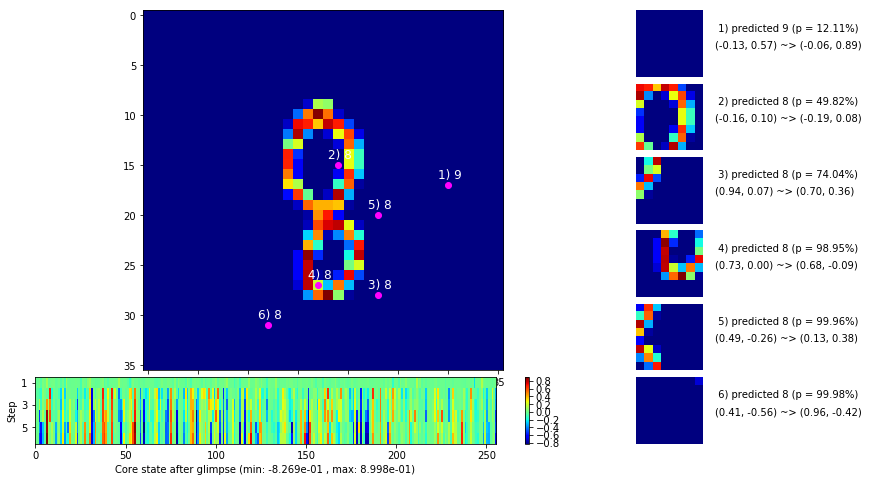

 b   2500/  3000 >> 134.2 ms/b | lr: 7.94e-05 | grad 2norm:  5.43 | grad inf norm:  1.344
       Weights || abs max:  1.15 (30393.83) | mean: -4.98e-03 ( 0.11) | var: 1.63e-02 (22888.69)
        Biases || abs max:  0.95 ( 2357.65) | mean:  1.59e-02 ( 1.55) | var: 6.69e-03 (90090.62)
                  class loss: 0.203 | steps: 2.100 | reward:  0.930 | acc.: 93.00%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.1 ms/b | lr: 7.79e-05 | grad 2norm:  5.40 | grad inf norm:  1.335
       Weights || abs max:  1.15 (246168.05) | mean: -4.96e-03 ( 0.47) | var: 1.63e-02 (21338184.00)
        Biases || abs max:  0.95 ( 1936.48) | mean:  1.59e-02 ( 1.26) | var: 6.70e-03 (127277.88)
                  class loss: 0.203 | steps: 2.099 | reward:  0.932 | acc.: 93.22%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

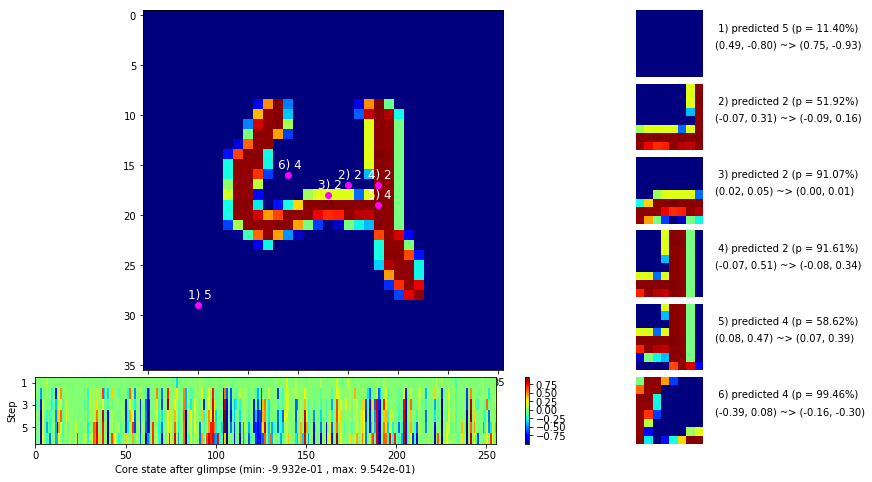

                                          ---===  VALIDATION  ===---

	Target class: 8  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


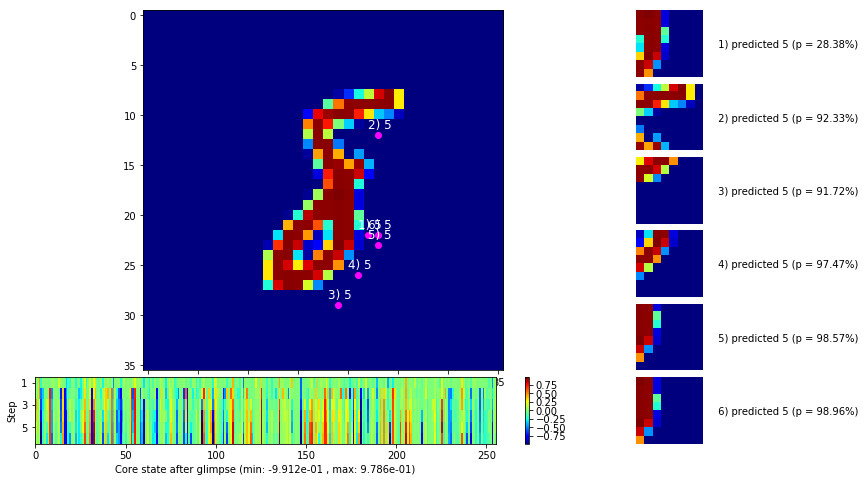


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


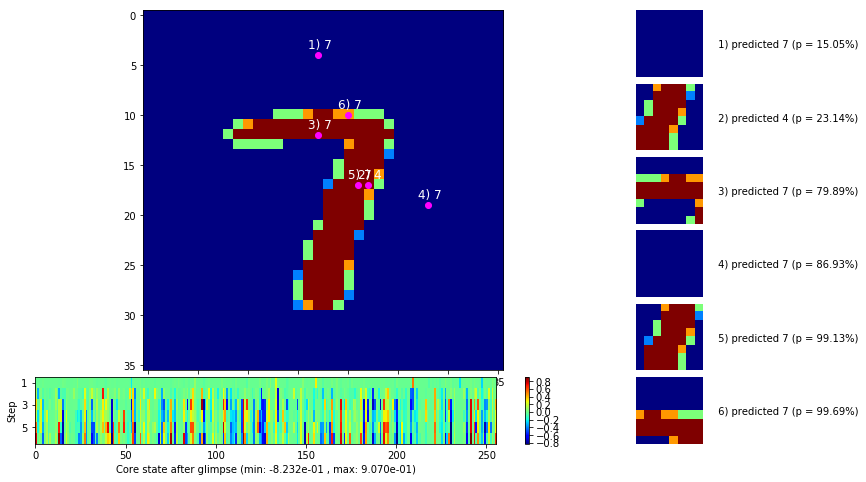

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


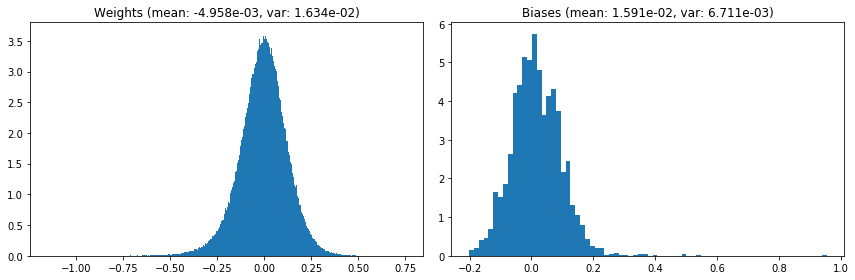

                                      Location network weights and biases


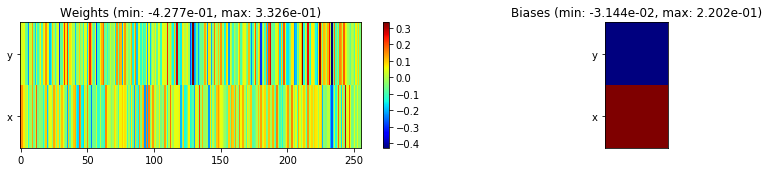

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.89 sec | TRAIN >> class loss: 0.2011 | steps:  2.107 :( | reward:  0.9326 :( | acc.: 93.262% :(
                          | VAL   >> class loss: 0.1831 | steps:  1.975    | reward:  0.9390 :( | acc.: 93.900% :(


Epoch  18/400) lr = 7.709e-05
 b    500/  3000 >> 134.5 ms/b | lr: 7.56e-05 | grad 2norm:  5.31 | grad inf norm:  1.321
       Weights || abs max:  1.15 (18388.96) | mean: -4.95e-03 ( 0.08) | var: 1.63e-02 ( 7235.84)
        Biases || abs max:  0.95 ( 5672.77) | mean:  1.60e-02 ( 3.01) | var: 6.70e-03 (2496640.75)
                  class loss: 0.199 | steps: 2.095 | reward:  0.934 | acc.: 93.40%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.0 ms/b | lr: 7.40e-05 | grad 2norm:  5.24 | grad inf norm:  1.306
       Weights || abs max:  1.15 (26016.80) | mean: -4.94e-03 ( 0.10)

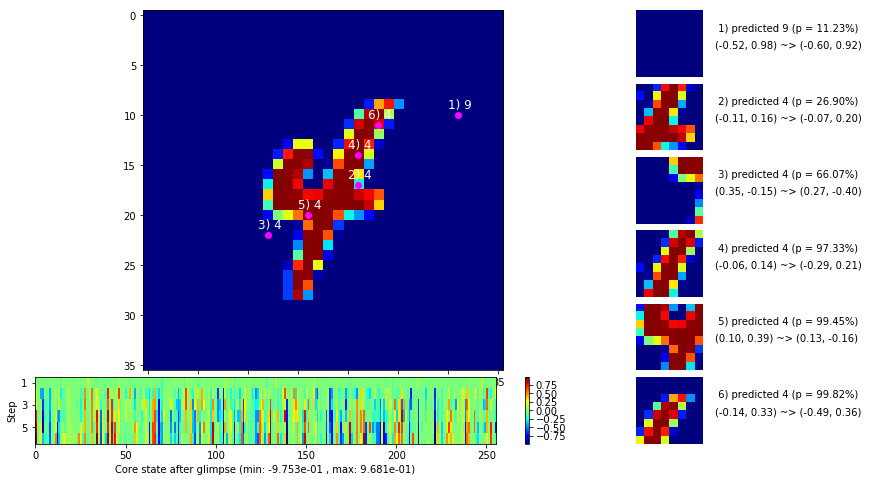

 b   1500/  3000 >> 135.5 ms/b | lr: 7.18e-05 | grad 2norm:  5.28 | grad inf norm:  1.308
       Weights || abs max:  1.15 (473840.12) | mean: -4.94e-03 ( 0.84) | var: 1.64e-02 (171451632.00)
        Biases || abs max:  0.95 (  807.89) | mean:  1.59e-02 ( 0.67) | var: 6.70e-03 ( 7701.33)
                  class loss: 0.192 | steps: 2.100 | reward:  0.933 | acc.: 93.33%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.0 ms/b | lr: 7.04e-05 | grad 2norm:  5.07 | grad inf norm:  1.249
       Weights || abs max:  1.15 (37271.05) | mean: -4.92e-03 ( 0.12) | var: 1.64e-02 (128643.52)
        Biases || abs max:  0.95 (10794.99) | mean:  1.60e-02 ( 4.59) | var: 6.69e-03 (18385858.00)
                  class loss: 0.185 | steps: 2.086 | reward:  0.940 | acc.: 93.95%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 

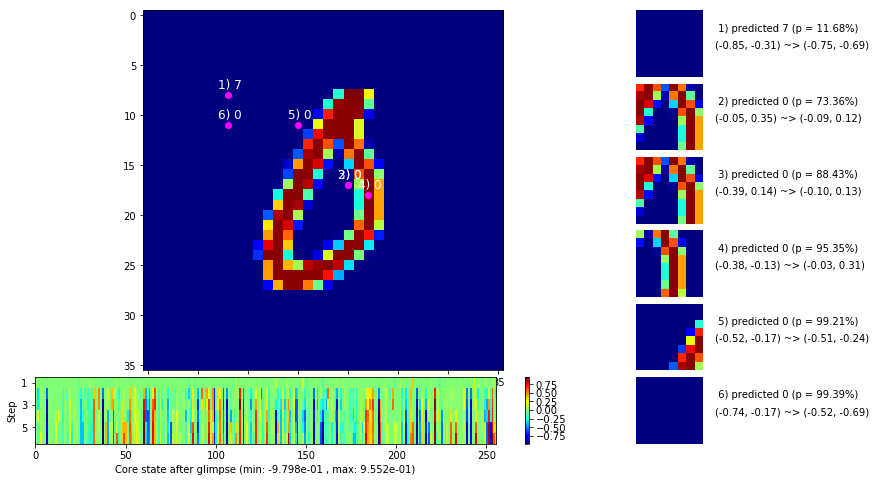

 b   2500/  3000 >> 145.5 ms/b | lr: 6.83e-05 | grad 2norm:  5.21 | grad inf norm:  1.285
       Weights || abs max:  1.15 (43763.62) | mean: -4.92e-03 ( 0.14) | var: 1.64e-02 (49657.50)
        Biases || abs max:  0.96 ( 2844.08) | mean:  1.60e-02 ( 1.57) | var: 6.69e-03 (418658.16)
                  class loss: 0.203 | steps: 2.099 | reward:  0.935 | acc.: 93.47%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.4 ms/b | lr: 6.70e-05 | grad 2norm:  5.35 | grad inf norm:  1.288
       Weights || abs max:  1.16 (33204.50) | mean: -4.92e-03 ( 0.12) | var: 1.64e-02 (68162.30)
        Biases || abs max:  0.95 ( 1743.54) | mean:  1.61e-02 ( 1.45) | var: 6.70e-03 (349013.06)
                  class loss: 0.204 | steps: 2.095 | reward:  0.932 | acc.: 93.25%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

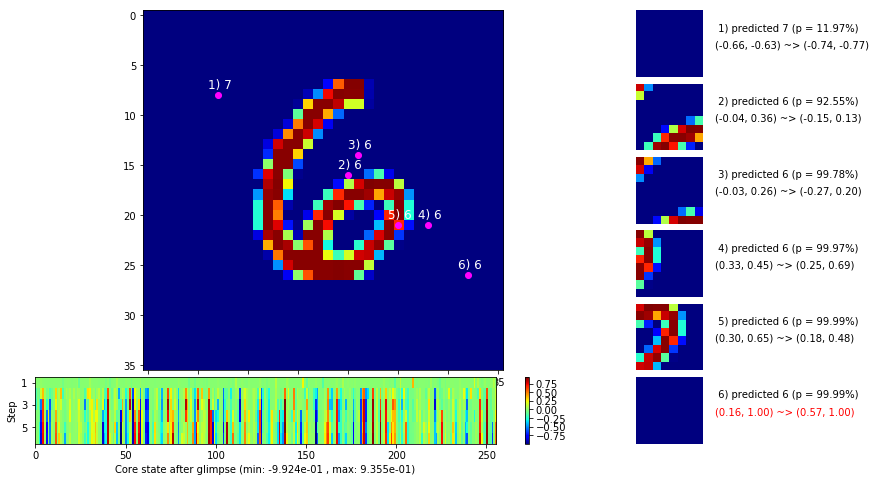

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


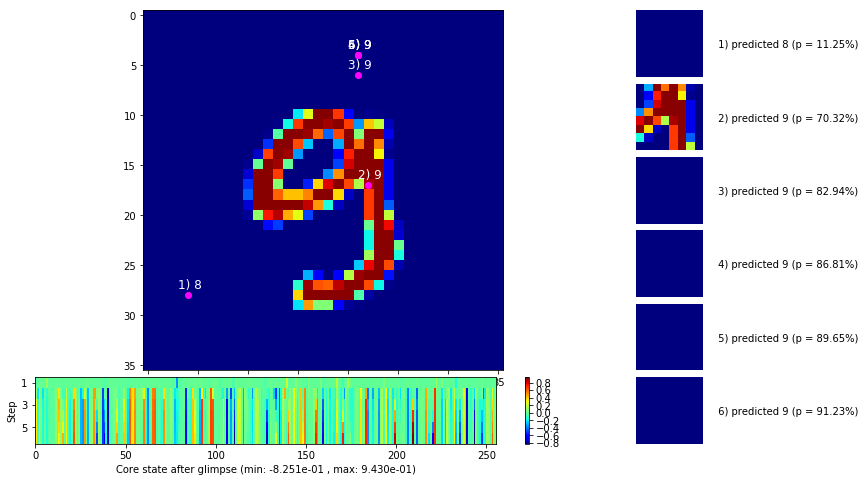


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


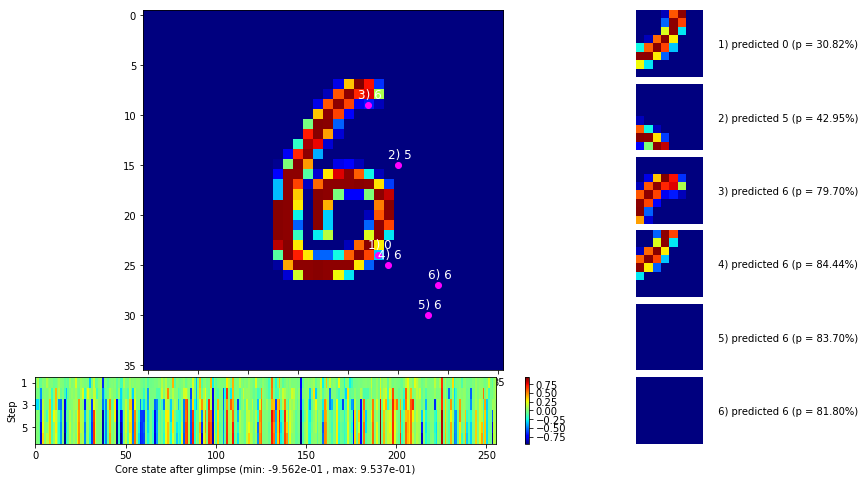

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


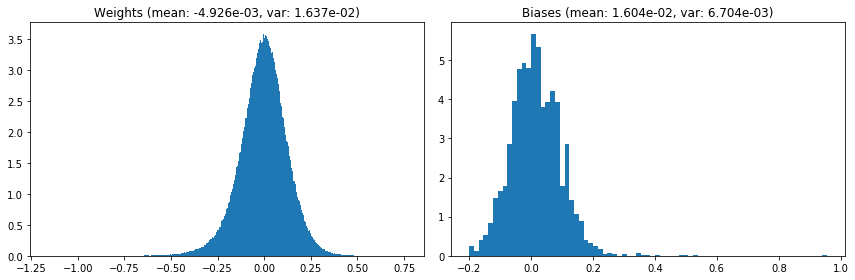

                                      Location network weights and biases


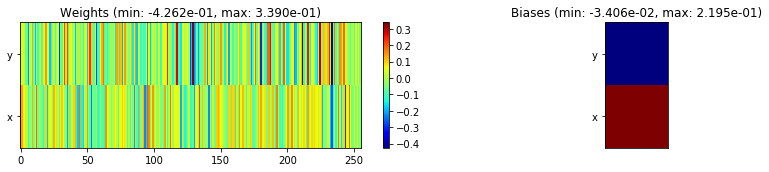

---------------------------------------------------------------------------------------------------------------
Elapsed time:  411.00 sec | TRAIN >> class loss: 0.1961 | steps:  2.093    | reward:  0.9348 :( | acc.: 93.480% :(
                          | VAL   >> class loss: 0.2220 | steps:  2.010 :( | reward:  0.9256 :( | acc.: 92.560% :(


Epoch  19/400) lr = 6.63e-05
 b    500/  3000 >> 134.9 ms/b | lr: 6.50e-05 | grad 2norm:  5.30 | grad inf norm:  1.293
       Weights || abs max:  1.16 (58563.71) | mean: -4.92e-03 ( 0.16) | var: 1.64e-02 (873385.75)
        Biases || abs max:  0.96 (  948.57) | mean:  1.61e-02 ( 0.78) | var: 6.71e-03 (15835.05)
                  class loss: 0.195 | steps: 2.094 | reward:  0.933 | acc.: 93.33%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.3 ms/b | lr: 6.37e-05 | grad 2norm:  5.35 | grad inf norm:  1.323
       Weights || abs max:  1.16 (55985.71) | mean: -4.90e-03 ( 0.15) |

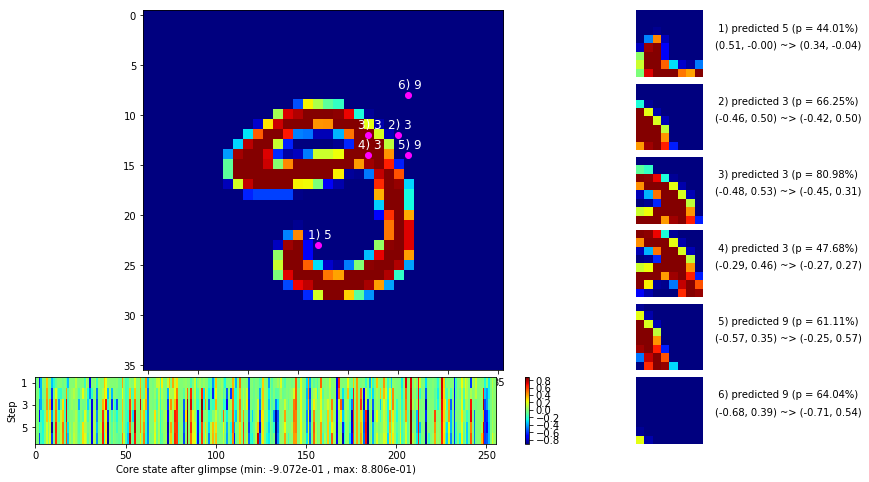

 b   1500/  3000 >> 134.9 ms/b | lr: 6.18e-05 | grad 2norm:  5.40 | grad inf norm:  1.352
       Weights || abs max:  1.16 (21453.01) | mean: -4.90e-03 ( 0.09) | var: 1.64e-02 (17419.85)
        Biases || abs max:  0.95 (  767.62) | mean:  1.62e-02 ( 0.67) | var: 6.71e-03 (14154.52)
                  class loss: 0.210 | steps: 2.109 | reward:  0.930 | acc.: 93.02%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.0 ms/b | lr: 6.06e-05 | grad 2norm:  5.33 | grad inf norm:  1.328
       Weights || abs max:  1.17 (23633.96) | mean: -4.91e-03 ( 0.10) | var: 1.64e-02 (34738.34)
        Biases || abs max:  0.95 (13149.53) | mean:  1.61e-02 ( 5.47) | var: 6.71e-03 (29950444.00)
                  class loss: 0.204 | steps: 2.104 | reward:  0.933 | acc.: 93.29%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

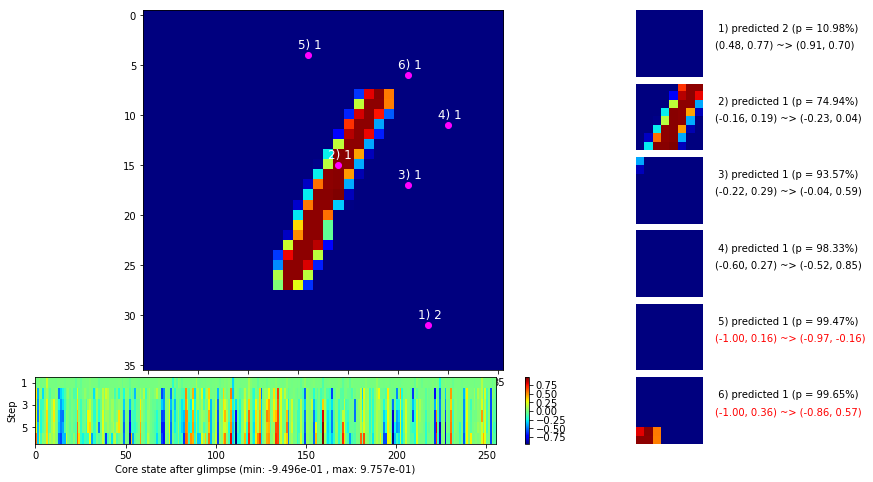

 b   2500/  3000 >> 135.7 ms/b | lr: 5.88e-05 | grad 2norm:  5.42 | grad inf norm:  1.257
       Weights || abs max:  1.17 (22222.24) | mean: -4.91e-03 ( 0.10) | var: 1.64e-02 ( 6227.01)
        Biases || abs max:  0.95 (  597.95) | mean:  1.61e-02 ( 0.57) | var: 6.71e-03 ( 1652.42)
                  class loss: 0.196 | steps: 2.101 | reward:  0.932 | acc.: 93.21%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.9 ms/b | lr: 5.76e-05 | grad 2norm:  5.27 | grad inf norm:  1.286
       Weights || abs max:  1.17 (33663.68) | mean: -4.90e-03 ( 0.12) | var: 1.64e-02 (82749.02)
        Biases || abs max:  0.95 ( 1280.62) | mean:  1.62e-02 ( 0.89) | var: 6.71e-03 (40042.99)
                  class loss: 0.198 | steps: 2.099 | reward:  0.934 | acc.: 93.43%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

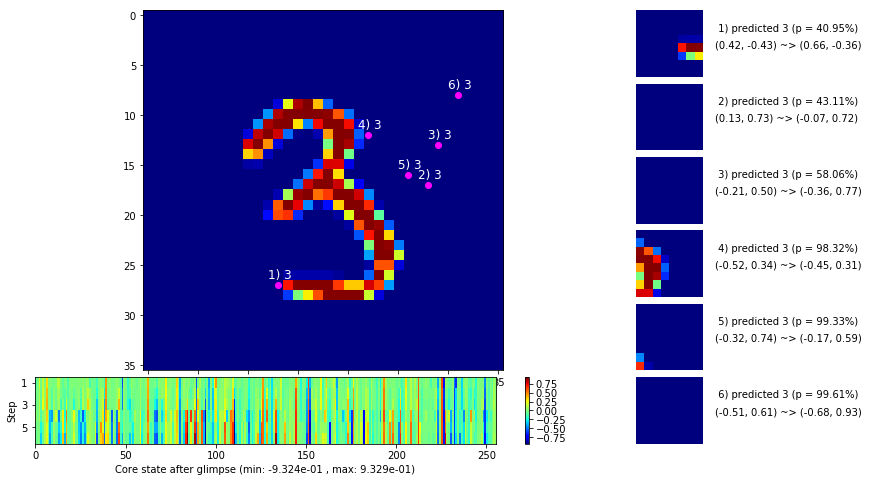

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


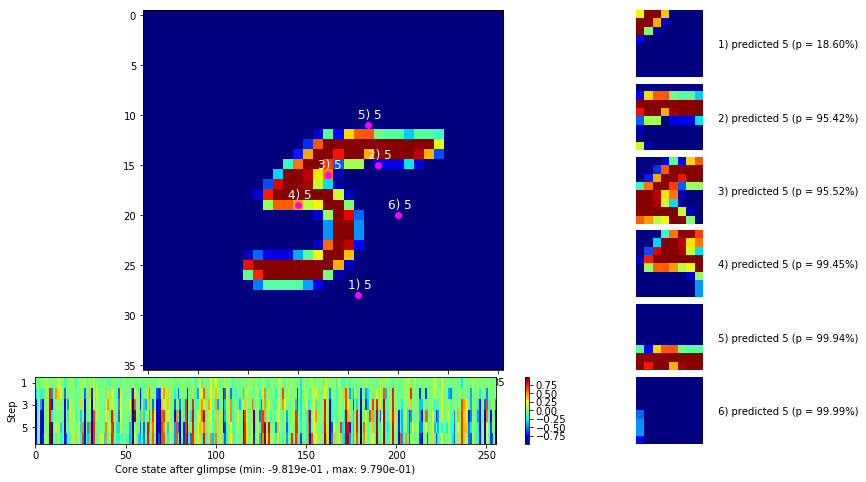


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


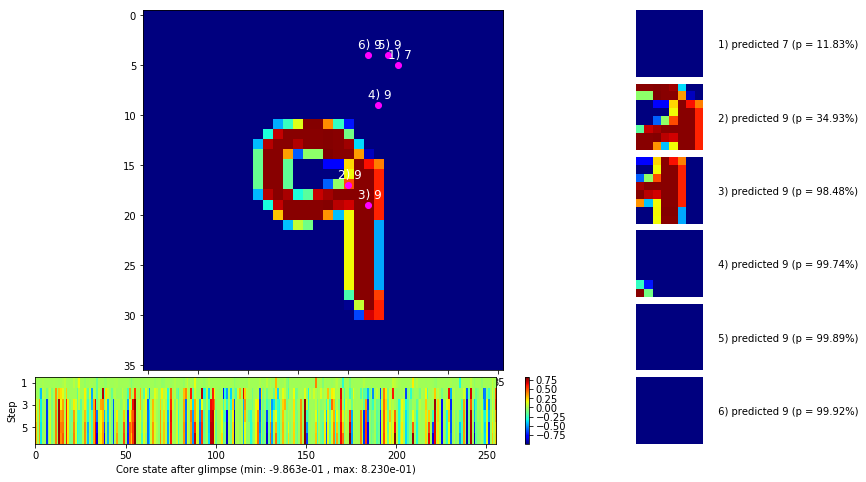

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


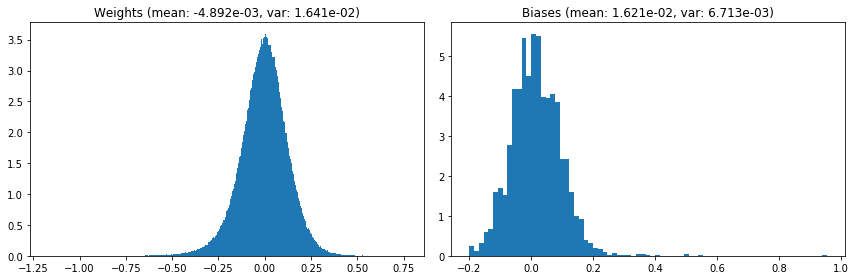

                                      Location network weights and biases


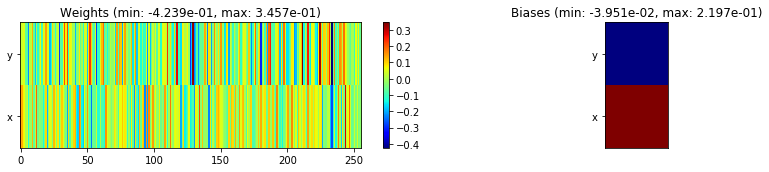

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.92 sec | TRAIN >> class loss: 0.2005 | steps:  2.102 :( | reward:  0.9324 :( | acc.: 93.237% :(
                          | VAL   >> class loss: 0.2015 | steps:  1.986 :( | reward:  0.9320 :( | acc.: 93.200% :(


Epoch  20/400) lr = 5.702e-05
 b    500/  3000 >> 135.4 ms/b | lr: 5.59e-05 | grad 2norm:  5.23 | grad inf norm:  1.285
       Weights || abs max:  1.17 (56143.32) | mean: -4.90e-03 ( 0.15) | var: 1.64e-02 (556291.75)
        Biases || abs max:  0.96 ( 1307.54) | mean:  1.62e-02 ( 1.01) | var: 6.71e-03 ( 4625.26)
                  class loss: 0.203 | steps: 2.122 | reward:  0.934 | acc.: 93.39%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 142.9 ms/b | lr: 5.48e-05 | grad 2norm:  5.06 | grad inf norm:  1.293
       Weights || abs max:  1.17 (32354.60) | mean: -4.88e-03 ( 0.11) 

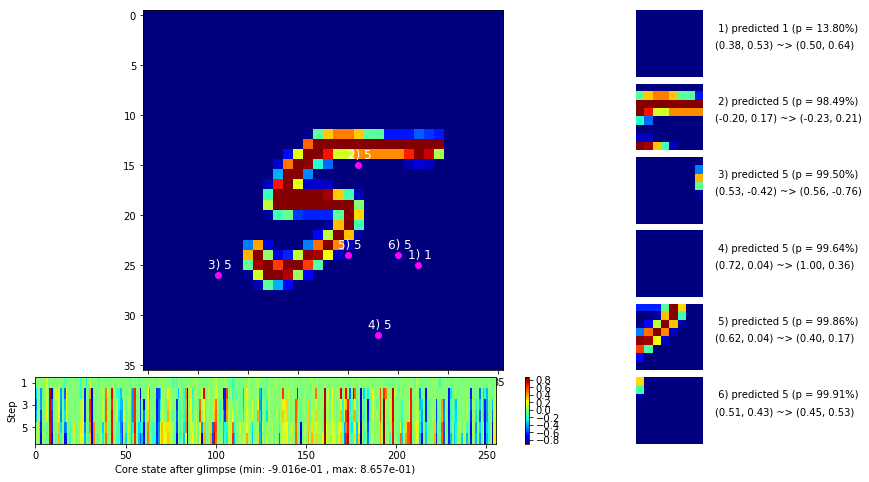

 b   1500/  3000 >> 135.4 ms/b | lr: 5.31e-05 | grad 2norm:  5.29 | grad inf norm:  1.309
       Weights || abs max:  1.17 (28430.91) | mean: -4.86e-03 ( 0.10) | var: 1.64e-02 (49465.28)
        Biases || abs max:  0.96 ( 1270.53) | mean:  1.64e-02 ( 0.88) | var: 6.72e-03 (41958.70)
                  class loss: 0.199 | steps: 2.103 | reward:  0.934 | acc.: 93.41%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.7 ms/b | lr: 5.21e-05 | grad 2norm:  5.12 | grad inf norm:  1.250
       Weights || abs max:  1.17 (32605.91) | mean: -4.85e-03 ( 0.11) | var: 1.64e-02 (57844.42)
        Biases || abs max:  0.96 (  939.24) | mean:  1.64e-02 ( 0.73) | var: 6.72e-03 (11496.96)
                  class loss: 0.187 | steps: 2.089 | reward:  0.938 | acc.: 93.84%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

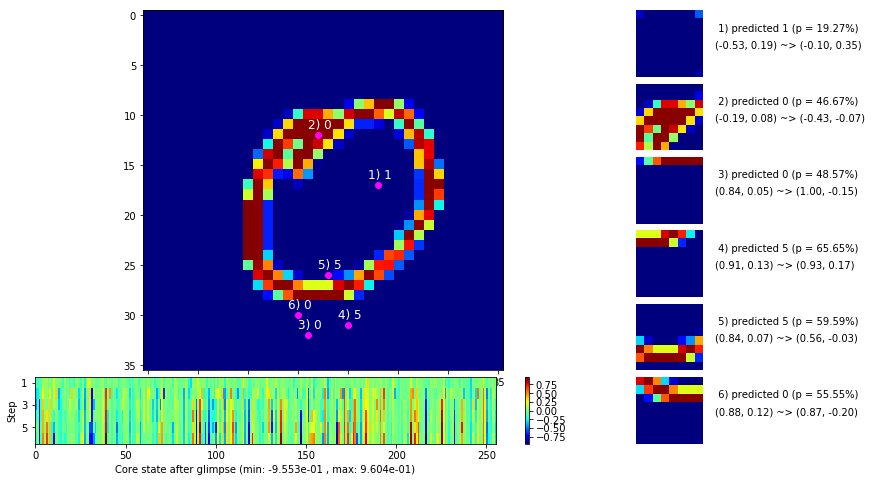

 b   2500/  3000 >> 135.2 ms/b | lr: 5.05e-05 | grad 2norm:  5.50 | grad inf norm:  1.296
       Weights || abs max:  1.18 (86676.84) | mean: -4.86e-03 ( 0.21) | var: 1.64e-02 (2197334.50)
        Biases || abs max:  0.96 ( 1020.50) | mean:  1.64e-02 ( 0.76) | var: 6.72e-03 ( 9397.35)
                  class loss: 0.208 | steps: 2.114 | reward:  0.929 | acc.: 92.89%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.3 ms/b | lr: 4.95e-05 | grad 2norm:  5.11 | grad inf norm:  1.281
       Weights || abs max:  1.18 (21318.95) | mean: -4.88e-03 ( 0.09) | var: 1.64e-02 ( 7240.18)
        Biases || abs max:  0.96 (  679.53) | mean:  1.63e-02 ( 0.62) | var: 6.71e-03 ( 3622.02)
                  class loss: 0.191 | steps: 2.095 | reward:  0.938 | acc.: 93.75%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

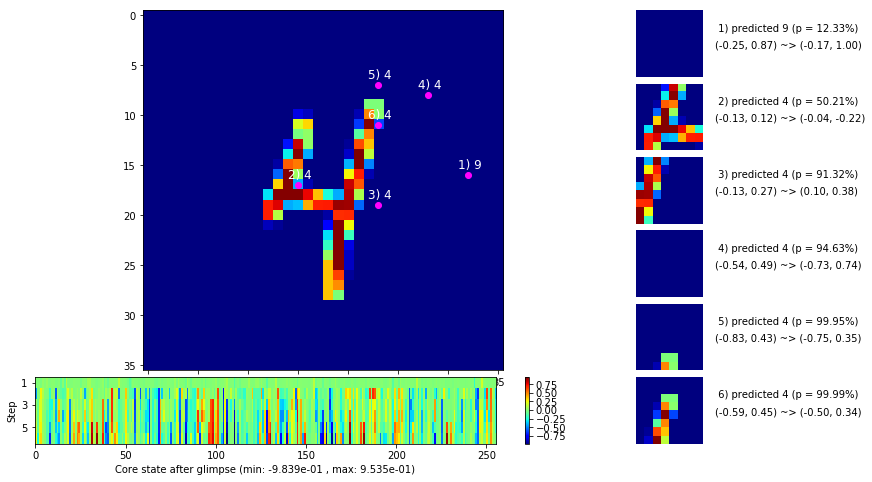

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


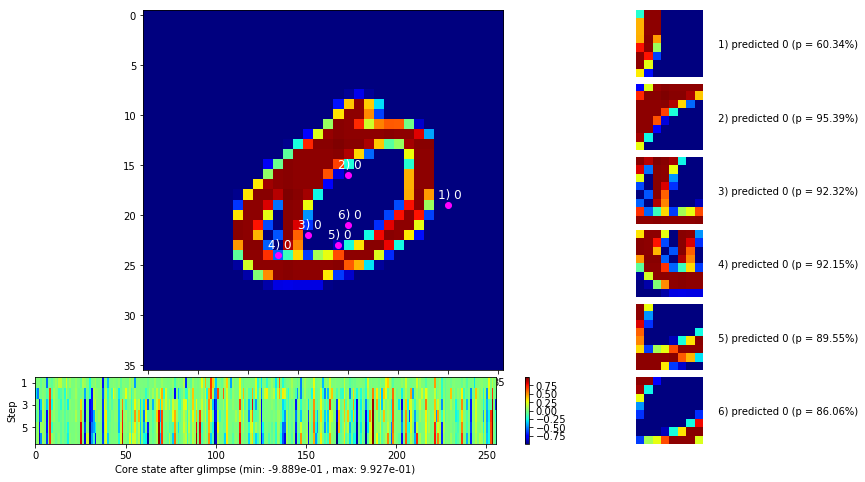


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


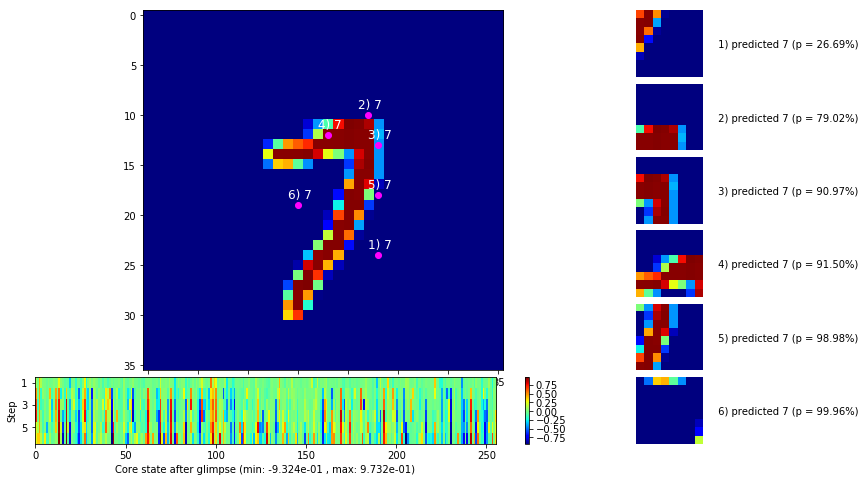

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


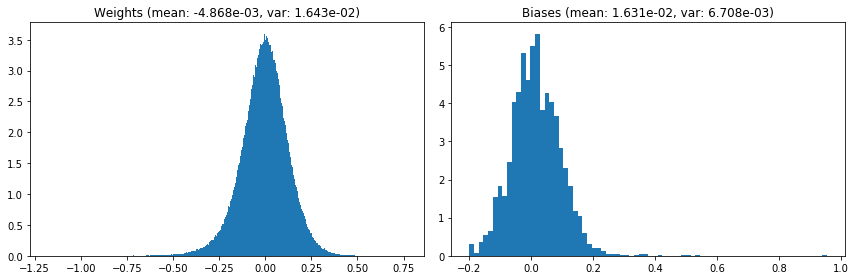

                                      Location network weights and biases


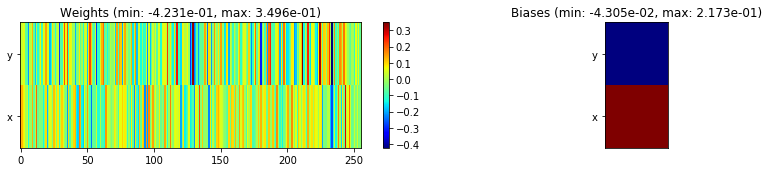

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.10 sec | TRAIN >> class loss: 0.1949 | steps:  2.101 :( | reward:  0.9354 :( | acc.: 93.537% :(
                          | VAL   >> class loss: 0.2087 | steps:  1.988 :( | reward:  0.9288 :( | acc.: 92.880% :(


Epoch  21/400) lr = 4.904e-05
 b    500/  3000 >> 136.0 ms/b | lr: 4.81e-05 | grad 2norm:  5.39 | grad inf norm:  1.275
       Weights || abs max:  1.18 (15391.56) | mean: -4.86e-03 ( 0.08) | var: 1.64e-02 ( 4622.80)
        Biases || abs max:  0.96 ( 1116.94) | mean:  1.63e-02 ( 1.04) | var: 6.70e-03 (28496.47)
                  class loss: 0.204 | steps: 2.123 | reward:  0.932 | acc.: 93.18%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.5 ms/b | lr: 4.71e-05 | grad 2norm:  5.35 | grad inf norm:  1.307
       Weights || abs max:  1.18 (18635.43) | mean: -4.86e-03 ( 0.08) |

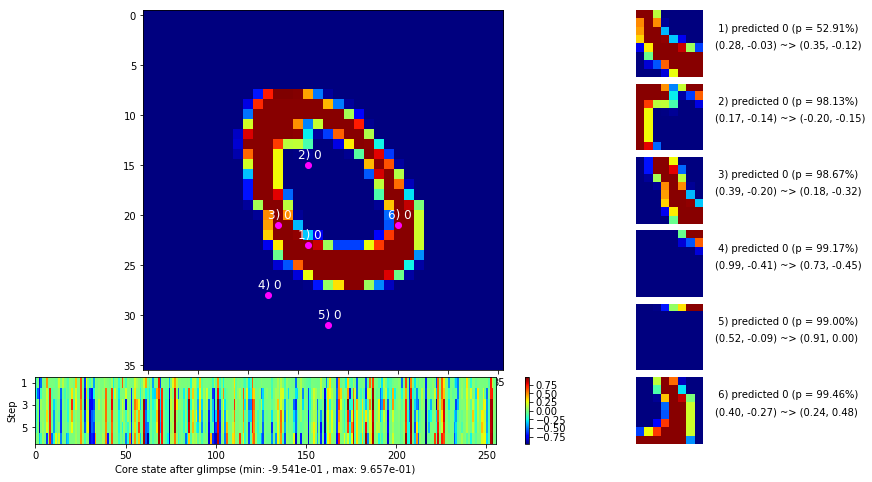

 b   1500/  3000 >> 135.6 ms/b | lr: 4.57e-05 | grad 2norm:  5.47 | grad inf norm:  1.310
       Weights || abs max:  1.18 (26687.07) | mean: -4.84e-03 ( 0.10) | var: 1.64e-02 (16862.52)
        Biases || abs max:  0.95 ( 2819.63) | mean:  1.64e-02 ( 1.49) | var: 6.71e-03 (894440.50)
                  class loss: 0.209 | steps: 2.099 | reward:  0.930 | acc.: 93.04%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 138.1 ms/b | lr: 4.48e-05 | grad 2norm:  5.39 | grad inf norm:  1.332
       Weights || abs max:  1.18 (20774.91) | mean: -4.84e-03 ( 0.08) | var: 1.64e-02 (30901.99)
        Biases || abs max:  0.96 ( 1202.88) | mean:  1.64e-02 ( 1.00) | var: 6.70e-03 ( 7708.35)
                  class loss: 0.201 | steps: 2.106 | reward:  0.932 | acc.: 93.25%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0

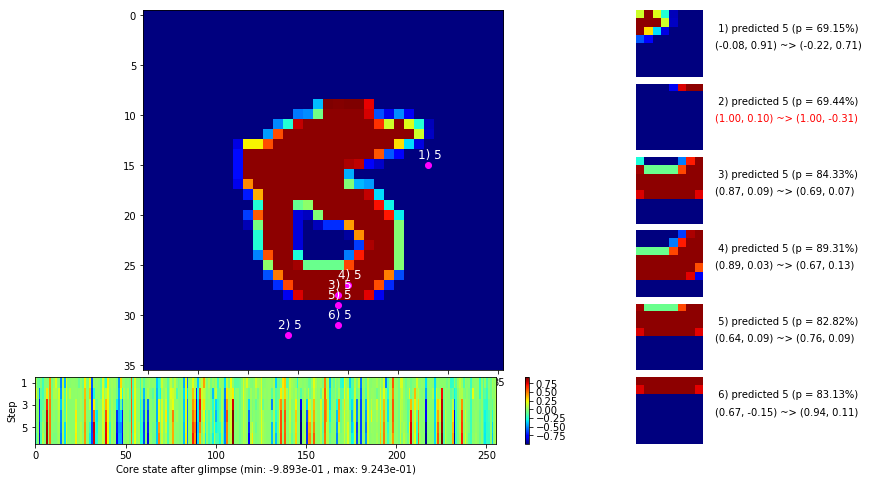

 b   2500/  3000 >> 137.8 ms/b | lr: 4.35e-05 | grad 2norm:  5.59 | grad inf norm:  1.346
       Weights || abs max:  1.18 (18862.57) | mean: -4.83e-03 ( 0.08) | var: 1.65e-02 (13337.48)
        Biases || abs max:  0.95 ( 1177.58) | mean:  1.65e-02 ( 0.91) | var: 6.70e-03 ( 6302.07)
                  class loss: 0.213 | steps: 2.111 | reward:  0.927 | acc.: 92.75%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.4 ms/b | lr: 4.26e-05 | grad 2norm:  5.47 | grad inf norm:  1.349
       Weights || abs max:  1.18 (23224.09) | mean: -4.83e-03 ( 0.09) | var: 1.65e-02 (39478.38)
        Biases || abs max:  0.95 ( 1456.20) | mean:  1.65e-02 ( 1.11) | var: 6.70e-03 (42149.68)
                  class loss: 0.213 | steps: 2.115 | reward:  0.930 | acc.: 93.01%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

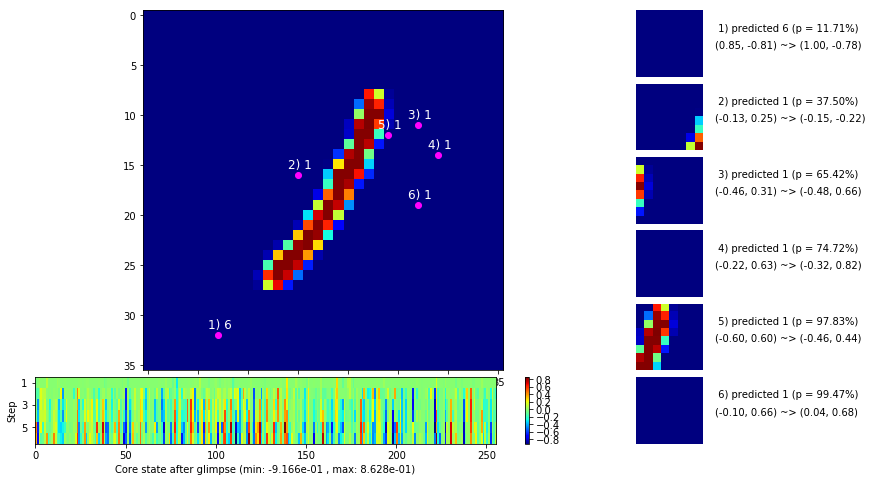

                                          ---===  VALIDATION  ===---

	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


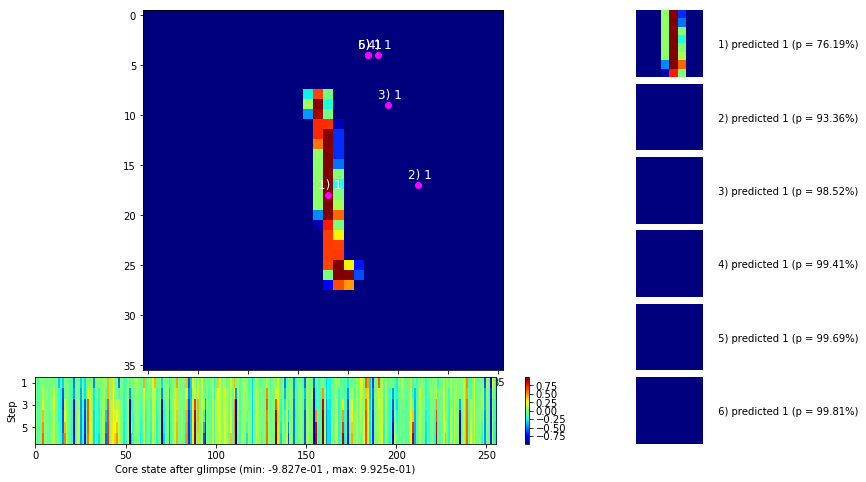


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


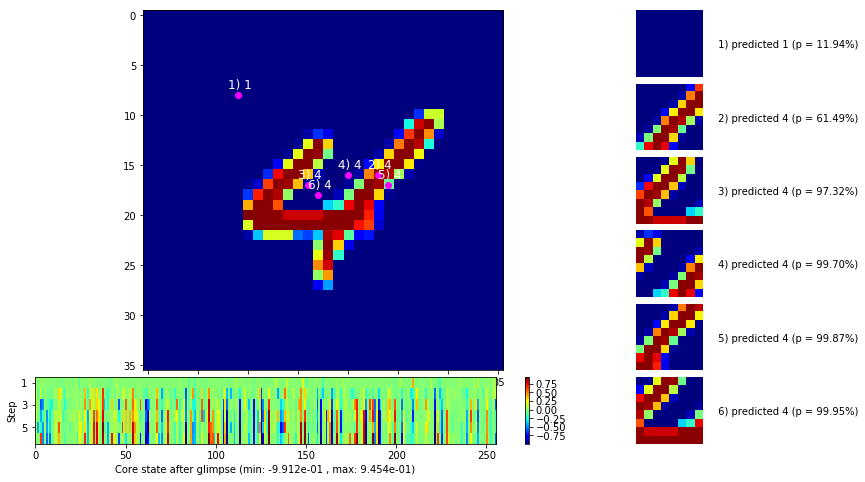

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


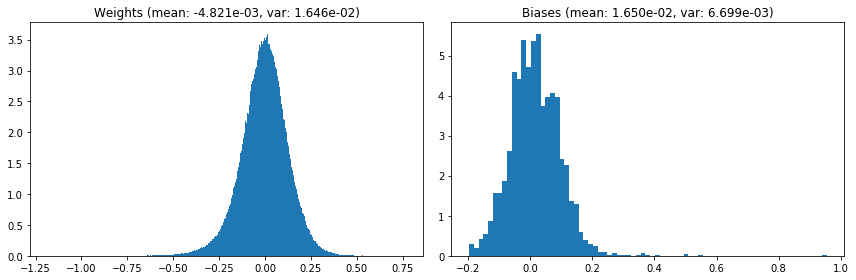

                                      Location network weights and biases


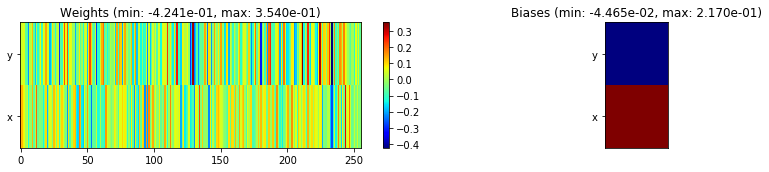

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.71 sec | TRAIN >> class loss: 0.2069 | steps:  2.110 :( | reward:  0.9308 :( | acc.: 93.080% :(
                          | VAL   >> class loss: 0.1992 | steps:  1.998 :( | reward:  0.9368 :( | acc.: 93.680% :(


Epoch  22/400) lr = 4.218e-05
 b    500/  3000 >> 133.6 ms/b | lr: 4.13e-05 | grad 2norm:  5.16 | grad inf norm:  1.285
       Weights || abs max:  1.18 (14376.22) | mean: -4.81e-03 ( 0.08) | var: 1.65e-02 ( 2308.28)
        Biases || abs max:  0.95 (  701.62) | mean:  1.65e-02 ( 0.75) | var: 6.70e-03 ( 3498.69)
                  class loss: 0.192 | steps: 2.083 | reward:  0.936 | acc.: 93.57%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.6 ms/b | lr: 4.05e-05 | grad 2norm:  5.54 | grad inf norm:  1.343
       Weights || abs max:  1.18 (32075.15) | mean: -4.80e-03 ( 0.11) |

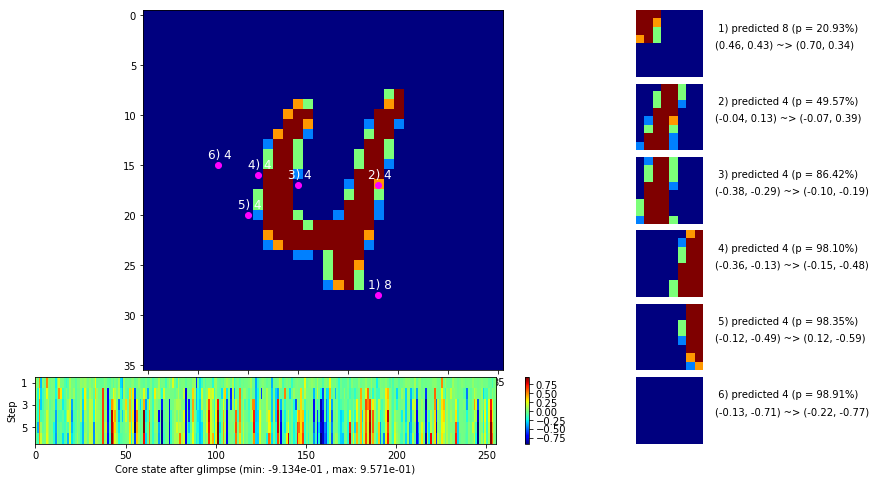

 b   1500/  3000 >> 135.7 ms/b | lr: 3.93e-05 | grad 2norm:  5.40 | grad inf norm:  1.323
       Weights || abs max:  1.18 (108999.95) | mean: -4.80e-03 ( 0.24) | var: 1.65e-02 (6409151.50)
        Biases || abs max:  0.95 ( 7321.34) | mean:  1.65e-02 ( 3.35) | var: 6.71e-03 (4816792.50)
                  class loss: 0.204 | steps: 2.119 | reward:  0.931 | acc.: 93.06%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.7 ms/b | lr: 3.85e-05 | grad 2norm:  5.51 | grad inf norm:  1.331
       Weights || abs max:  1.18 (19849.89) | mean: -4.79e-03 ( 0.09) | var: 1.65e-02 (14739.04)
        Biases || abs max:  0.95 ( 1034.90) | mean:  1.65e-02 ( 0.82) | var: 6.71e-03 ( 5893.88)
                  class loss: 0.208 | steps: 2.111 | reward:  0.931 | acc.: 93.09%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

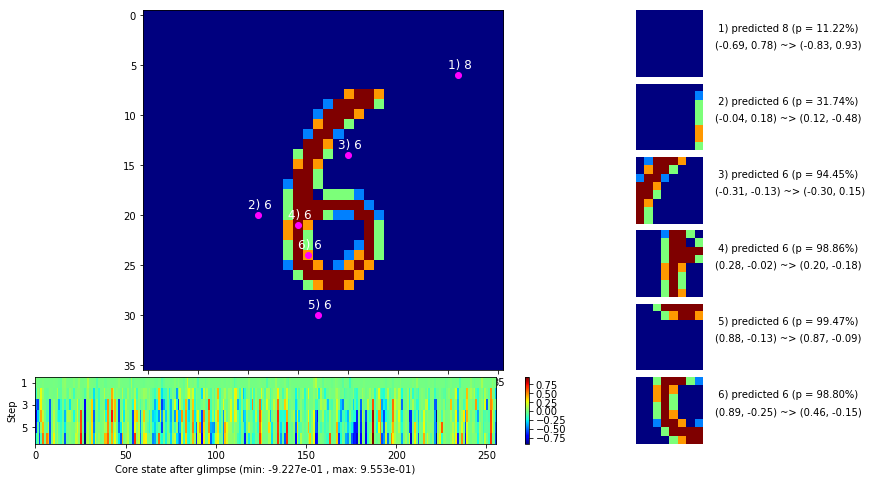

 b   2500/  3000 >> 134.0 ms/b | lr: 3.74e-05 | grad 2norm:  5.44 | grad inf norm:  1.327
       Weights || abs max:  1.18 (16830.88) | mean: -4.78e-03 ( 0.08) | var: 1.65e-02 ( 4780.46)
        Biases || abs max:  0.95 (  826.50) | mean:  1.66e-02 ( 0.70) | var: 6.71e-03 (32790.12)
                  class loss: 0.204 | steps: 2.114 | reward:  0.931 | acc.: 93.08%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.3 ms/b | lr: 3.66e-05 | grad 2norm:  5.27 | grad inf norm:  1.290
       Weights || abs max:  1.18 (67481.53) | mean: -4.77e-03 ( 0.17) | var: 1.65e-02 (1254934.50)
        Biases || abs max:  0.95 (  573.20) | mean:  1.66e-02 ( 0.64) | var: 6.71e-03 ( 3447.30)
                  class loss: 0.198 | steps: 2.088 | reward:  0.934 | acc.: 93.45%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

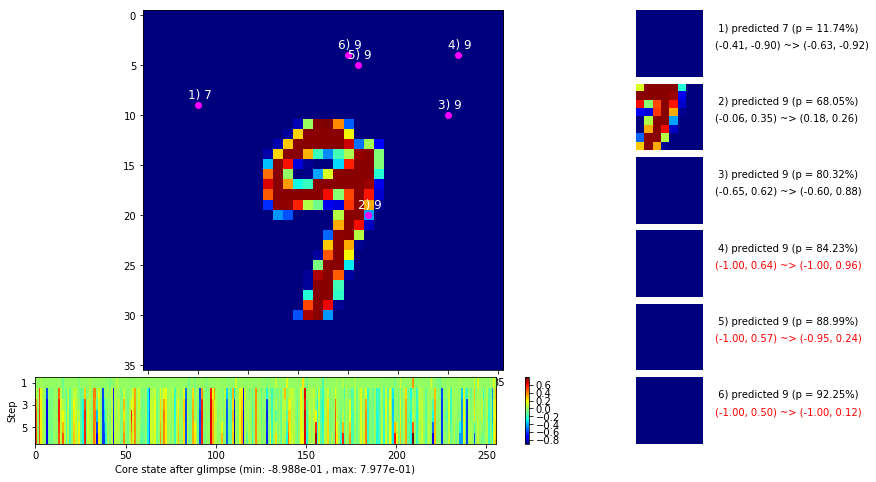

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


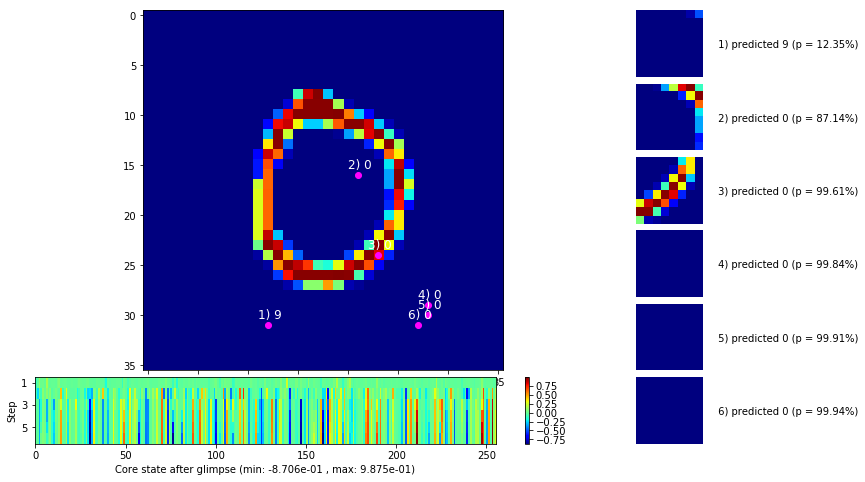


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


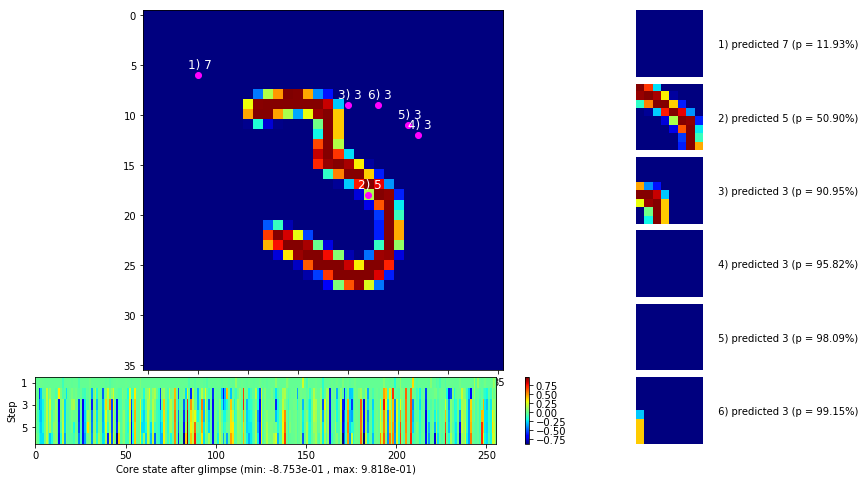

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


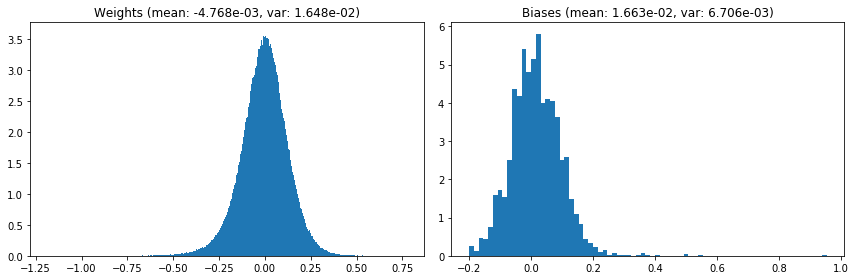

                                      Location network weights and biases


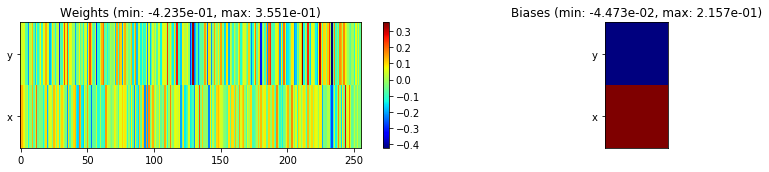

---------------------------------------------------------------------------------------------------------------
Elapsed time:  404.10 sec | TRAIN >> class loss: 0.2017 | steps:  2.104 :( | reward:  0.9321 :( | acc.: 93.213% :(
                          | VAL   >> class loss: 0.1998 | steps:  1.980 :( | reward:  0.9324 :( | acc.: 93.240% :(


Epoch  23/400) lr = 3.628e-05
 b    500/  3000 >> 142.7 ms/b | lr: 3.56e-05 | grad 2norm:  5.32 | grad inf norm:  1.308
       Weights || abs max:  1.18 (36775.66) | mean: -4.77e-03 ( 0.12) | var: 1.65e-02 (47401.97)
        Biases || abs max:  0.95 ( 1479.28) | mean:  1.66e-02 ( 1.16) | var: 6.71e-03 (23166.77)
                  class loss: 0.205 | steps: 2.106 | reward:  0.933 | acc.: 93.30%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.9 ms/b | lr: 3.48e-05 | grad 2norm:  5.37 | grad inf norm:  1.272
       Weights || abs max:  1.18 (141382.42) | mean: -4.77e-03 ( 0.30) 

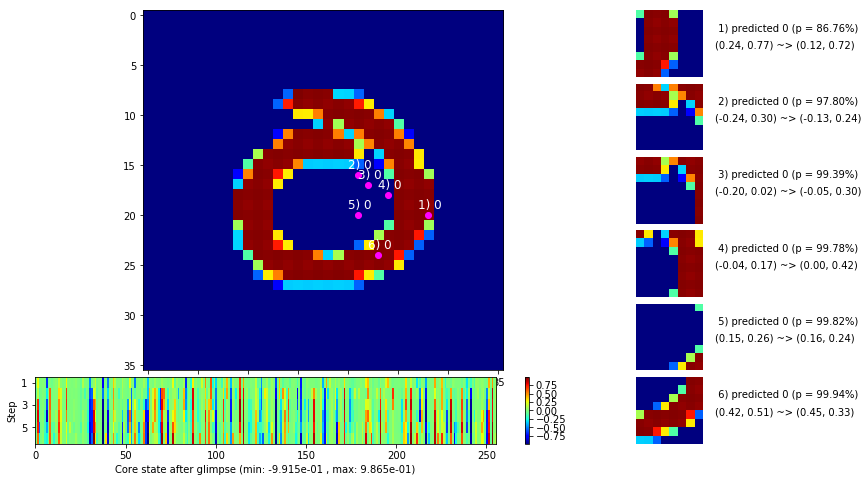

 b   1500/  3000 >> 136.9 ms/b | lr: 3.38e-05 | grad 2norm:  5.47 | grad inf norm:  1.299
       Weights || abs max:  1.18 (36748.86) | mean: -4.76e-03 ( 0.12) | var: 1.65e-02 (69234.86)
        Biases || abs max:  0.95 ( 2349.82) | mean:  1.67e-02 ( 1.24) | var: 6.71e-03 (206262.52)
                  class loss: 0.203 | steps: 2.117 | reward:  0.932 | acc.: 93.17%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.9 ms/b | lr: 3.31e-05 | grad 2norm:  5.53 | grad inf norm:  1.316
       Weights || abs max:  1.18 (42608.62) | mean: -4.76e-03 ( 0.13) | var: 1.65e-02 (121662.12)
        Biases || abs max:  0.95 (  959.74) | mean:  1.67e-02 ( 0.72) | var: 6.71e-03 (16809.36)
                  class loss: 0.205 | steps: 2.088 | reward:  0.931 | acc.: 93.08%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

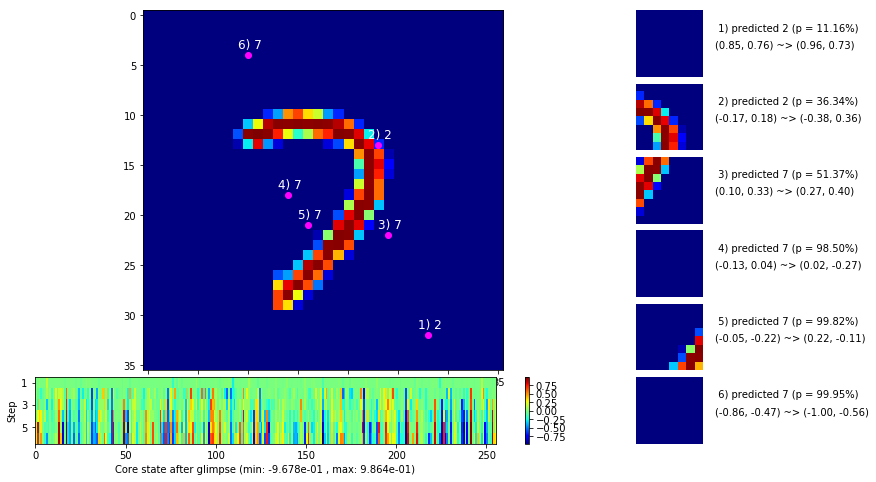

 b   2500/  3000 >> 136.7 ms/b | lr: 3.22e-05 | grad 2norm:  5.26 | grad inf norm:  1.312
       Weights || abs max:  1.19 (107949.08) | mean: -4.76e-03 ( 0.24) | var: 1.65e-02 (2411641.75)
        Biases || abs max:  0.95 (  369.57) | mean:  1.67e-02 ( 0.48) | var: 6.71e-03 ( 2695.84)
                  class loss: 0.194 | steps: 2.104 | reward:  0.935 | acc.: 93.51%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.7 ms/b | lr: 3.15e-05 | grad 2norm:  5.47 | grad inf norm:  1.307
       Weights || abs max:  1.19 (34324.73) | mean: -4.75e-03 ( 0.12) | var: 1.65e-02 (130558.52)
        Biases || abs max:  0.95 ( 1190.84) | mean:  1.67e-02 ( 0.85) | var: 6.70e-03 ( 9867.62)
                  class loss: 0.199 | steps: 2.082 | reward:  0.932 | acc.: 93.16%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

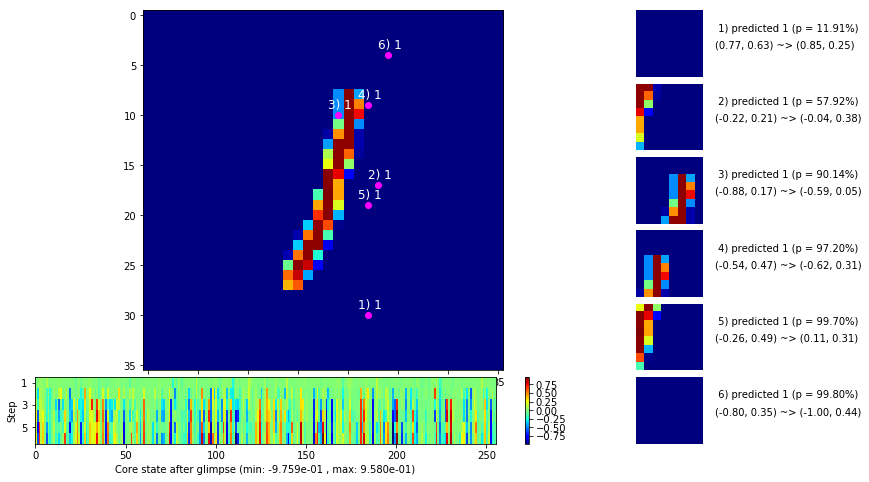

                                          ---===  VALIDATION  ===---

	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


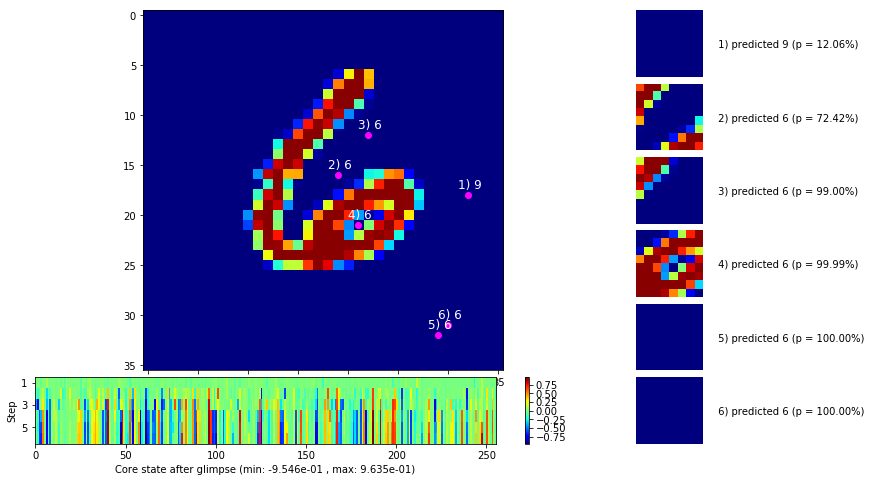


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


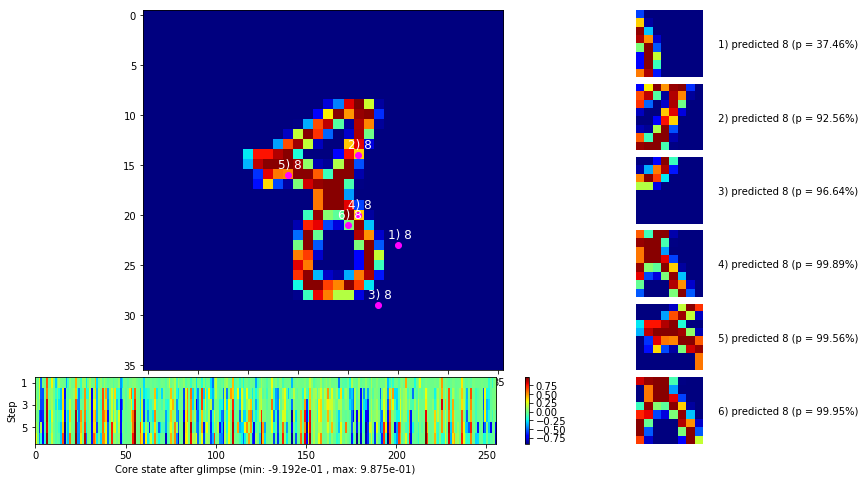

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


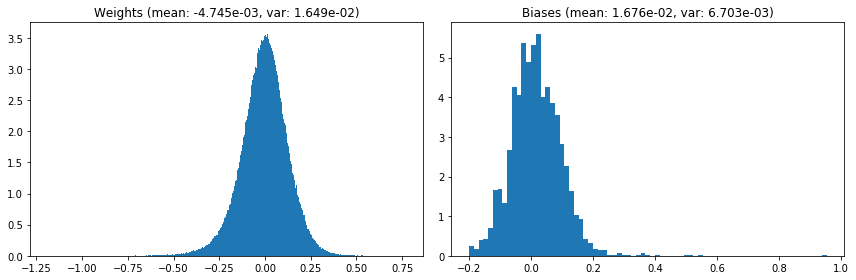

                                      Location network weights and biases


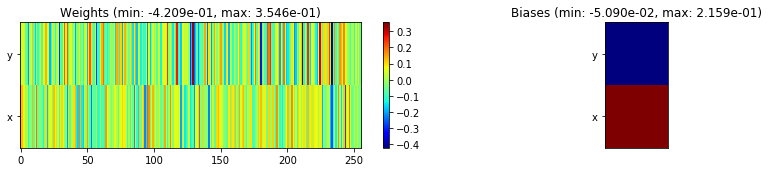

---------------------------------------------------------------------------------------------------------------
Elapsed time:  409.50 sec | TRAIN >> class loss: 0.2012 | steps:  2.097 :( | reward:  0.9326 :( | acc.: 93.257% :(
                          | VAL   >> class loss: 0.1980 | steps:  2.008 :( | reward:  0.9368 :( | acc.: 93.680% :(


Epoch  24/400) lr = 3.12e-05
 b    500/  3000 >> 133.3 ms/b | lr: 3.06e-05 | grad 2norm:  5.20 | grad inf norm:  1.293
       Weights || abs max:  1.19 (44893.95) | mean: -4.75e-03 ( 0.14) | var: 1.65e-02 (76237.68)
        Biases || abs max:  0.95 (  606.36) | mean:  1.68e-02 ( 0.64) | var: 6.70e-03 ( 8581.20)
                  class loss: 0.201 | steps: 2.101 | reward:  0.935 | acc.: 93.46%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.6 ms/b | lr: 3.00e-05 | grad 2norm:  5.30 | grad inf norm:  1.321
       Weights || abs max:  1.19 (21333.48) | mean: -4.75e-03 ( 0.09) | 

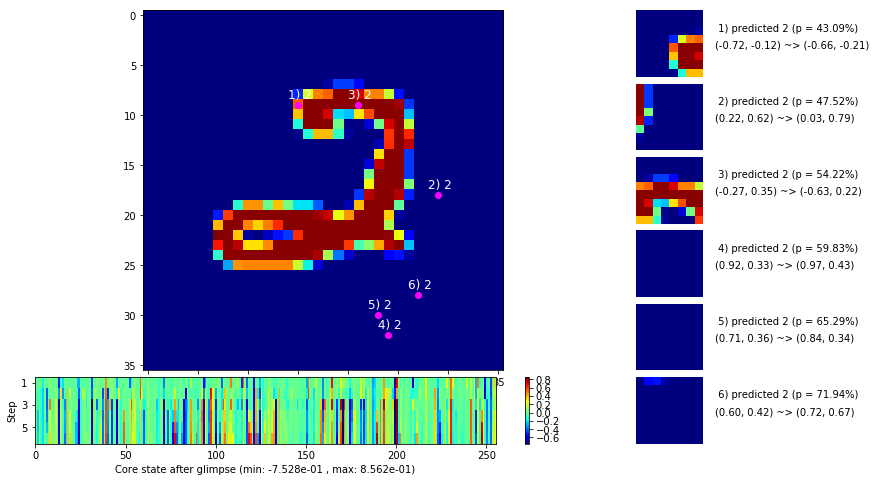

 b   1500/  3000 >> 135.6 ms/b | lr: 2.91e-05 | grad 2norm:  5.25 | grad inf norm:  1.279
       Weights || abs max:  1.19 (58380.99) | mean: -4.74e-03 ( 0.16) | var: 1.65e-02 (155540.22)
        Biases || abs max:  0.95 ( 1173.22) | mean:  1.68e-02 ( 0.91) | var: 6.70e-03 ( 6075.62)
                  class loss: 0.193 | steps: 2.094 | reward:  0.936 | acc.: 93.63%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 142.4 ms/b | lr: 2.85e-05 | grad 2norm:  5.30 | grad inf norm:  1.261
       Weights || abs max:  1.19 (21578.00) | mean: -4.74e-03 ( 0.10) | var: 1.65e-02 ( 4945.87)
        Biases || abs max:  0.95 ( 4079.14) | mean:  1.68e-02 ( 2.15) | var: 6.70e-03 (968156.81)
                  class loss: 0.192 | steps: 2.089 | reward:  0.936 | acc.: 93.56%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

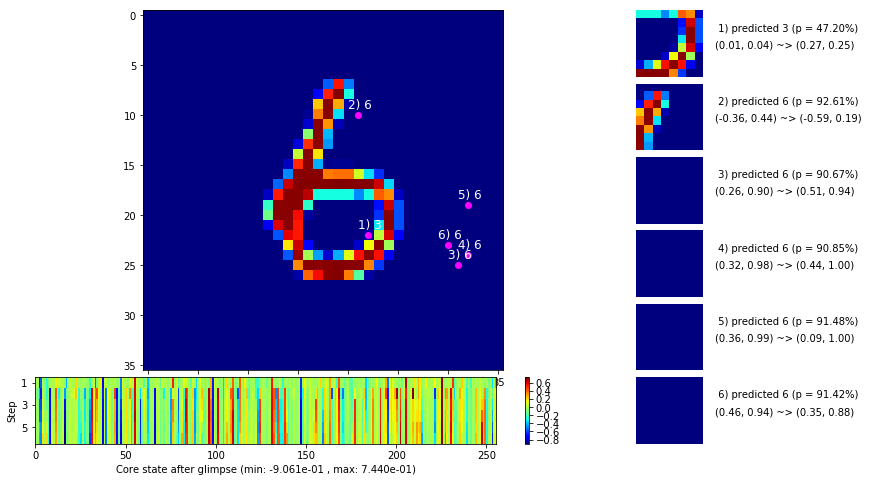

 b   2500/  3000 >> 134.9 ms/b | lr: 2.77e-05 | grad 2norm:  5.23 | grad inf norm:  1.279
       Weights || abs max:  1.19 (202487.73) | mean: -4.73e-03 ( 0.39) | var: 1.65e-02 (27607682.00)
        Biases || abs max:  0.95 ( 1572.45) | mean:  1.68e-02 ( 1.14) | var: 6.70e-03 (37783.33)
                  class loss: 0.190 | steps: 2.092 | reward:  0.938 | acc.: 93.78%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 134.7 ms/b | lr: 2.71e-05 | grad 2norm:  5.58 | grad inf norm:  1.350
       Weights || abs max:  1.19 (14682.83) | mean: -4.72e-03 ( 0.08) | var: 1.65e-02 ( 8495.40)
        Biases || abs max:  0.95 ( 1722.72) | mean:  1.68e-02 ( 1.00) | var: 6.71e-03 (184180.77)
                  class loss: 0.209 | steps: 2.128 | reward:  0.929 | acc.: 92.87%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0,

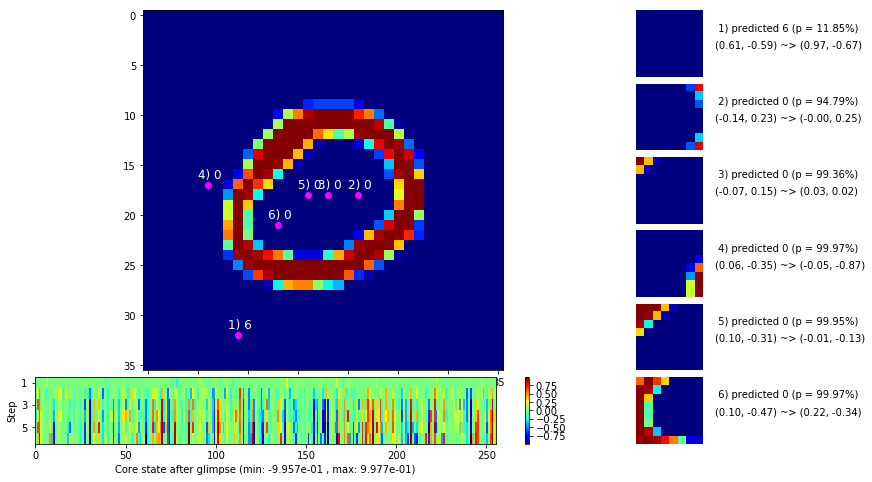

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


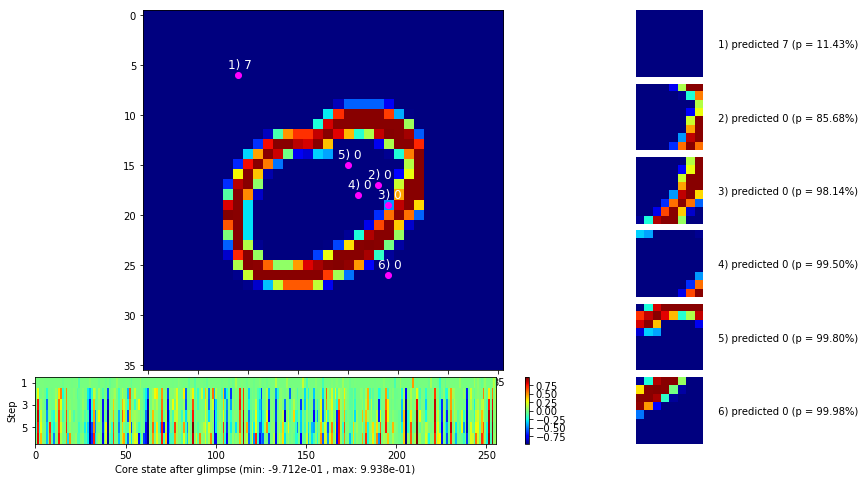


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


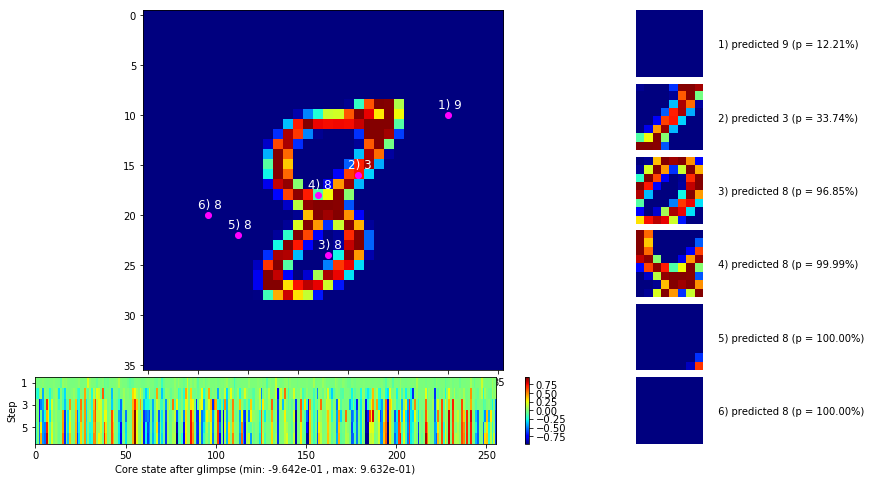

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


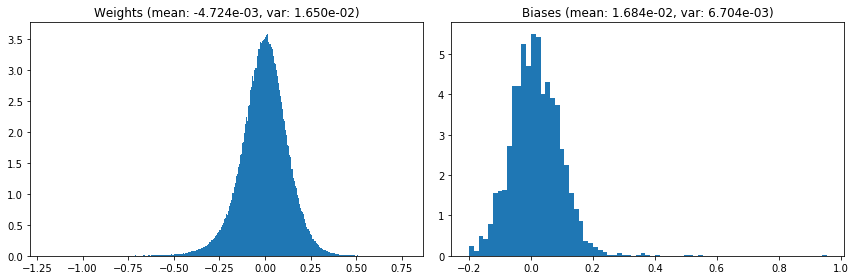

                                      Location network weights and biases


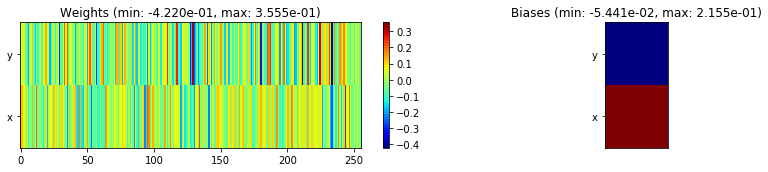

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.93 sec | TRAIN >> class loss: 0.1967 | steps:  2.100 :( | reward:  0.9346 :( | acc.: 93.465% :(
                          | VAL   >> class loss: 0.1810 | steps:  1.938    | reward:  0.9442    | acc.: 94.420% 


Epoch  25/400) lr = 2.683e-05
 b    500/  3000 >> 133.9 ms/b | lr: 2.63e-05 | grad 2norm:  5.40 | grad inf norm:  1.324
       Weights || abs max:  1.19 (1354739.50) | mean: -4.73e-03 ( 2.32) | var: 1.65e-02 (1184192000.00)
        Biases || abs max:  0.95 (  298.34) | mean:  1.68e-02 ( 0.46) | var: 6.70e-03 (  652.73)
                  class loss: 0.200 | steps: 2.104 | reward:  0.932 | acc.: 93.23%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 133.5 ms/b | lr: 2.58e-05 | grad 2norm:  5.31 | grad inf norm:  1.246
       Weights || abs max:  1.19 (43412.62) | mean: -4.73e-03 ( 0.

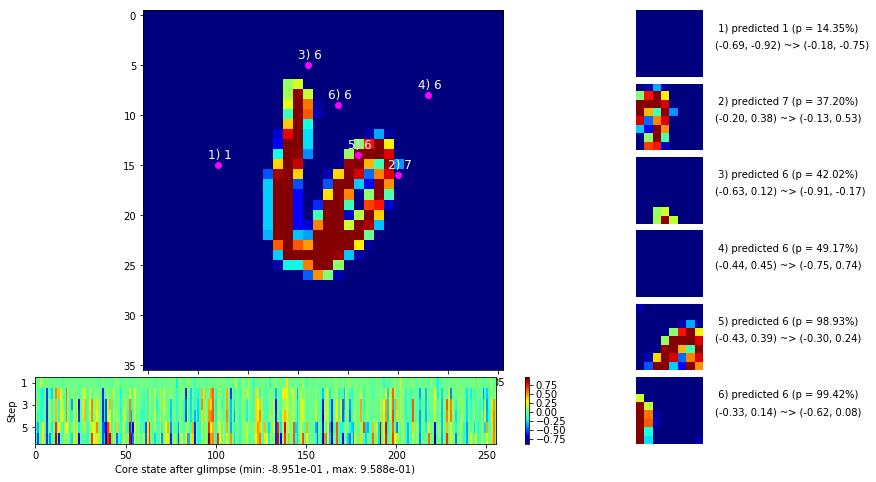

 b   1500/  3000 >> 135.5 ms/b | lr: 2.50e-05 | grad 2norm:  5.58 | grad inf norm:  1.320
       Weights || abs max:  1.19 (38491.08) | mean: -4.73e-03 ( 0.12) | var: 1.65e-02 (187236.20)
        Biases || abs max:  0.95 (  909.70) | mean:  1.68e-02 ( 0.77) | var: 6.71e-03 (15212.13)
                  class loss: 0.209 | steps: 2.123 | reward:  0.928 | acc.: 92.83%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.5 ms/b | lr: 2.45e-05 | grad 2norm:  5.26 | grad inf norm:  1.292
       Weights || abs max:  1.19 (23923.80) | mean: -4.73e-03 ( 0.09) | var: 1.65e-02 (96178.17)
        Biases || abs max:  0.95 ( 1847.61) | mean:  1.68e-02 ( 1.13) | var: 6.71e-03 (80754.34)
                  class loss: 0.194 | steps: 2.077 | reward:  0.935 | acc.: 93.54%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0

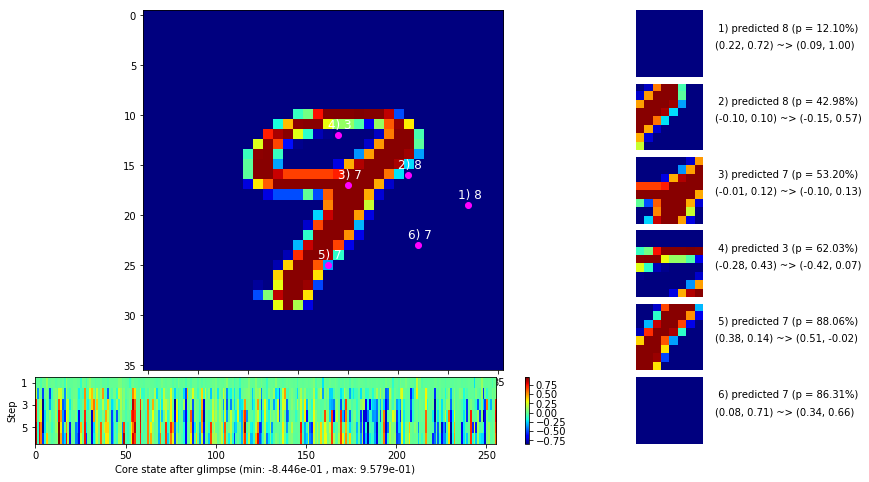

 b   2500/  3000 >> 135.5 ms/b | lr: 2.38e-05 | grad 2norm:  5.27 | grad inf norm:  1.294
       Weights || abs max:  1.19 (16719.06) | mean: -4.72e-03 ( 0.08) | var: 1.65e-02 (15846.81)
        Biases || abs max:  0.95 (  347.28) | mean:  1.68e-02 ( 0.46) | var: 6.71e-03 (  706.30)
                  class loss: 0.196 | steps: 2.095 | reward:  0.935 | acc.: 93.54%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 139.3 ms/b | lr: 2.33e-05 | grad 2norm:  5.48 | grad inf norm:  1.327
       Weights || abs max:  1.19 (44042.84) | mean: -4.73e-03 ( 0.13) | var: 1.65e-02 (671869.62)
        Biases || abs max:  0.95 ( 1335.99) | mean:  1.68e-02 ( 1.23) | var: 6.71e-03 (157163.23)
                  class loss: 0.205 | steps: 2.114 | reward:  0.930 | acc.: 92.96%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

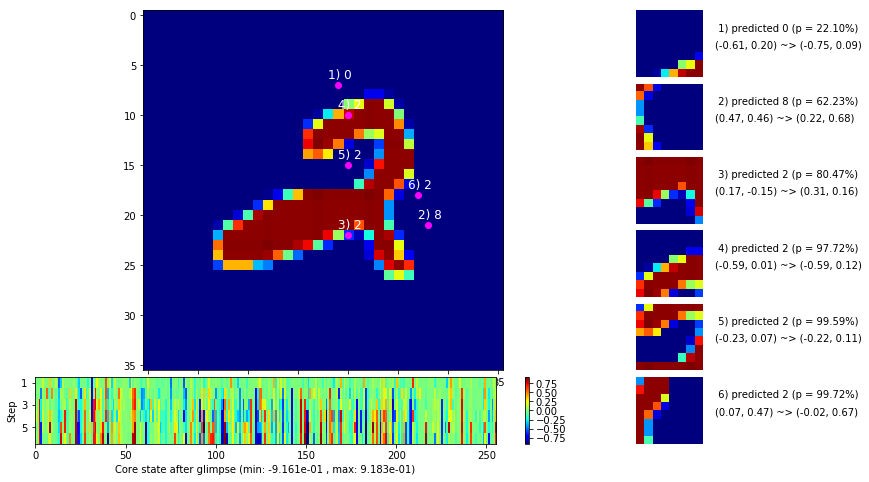

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


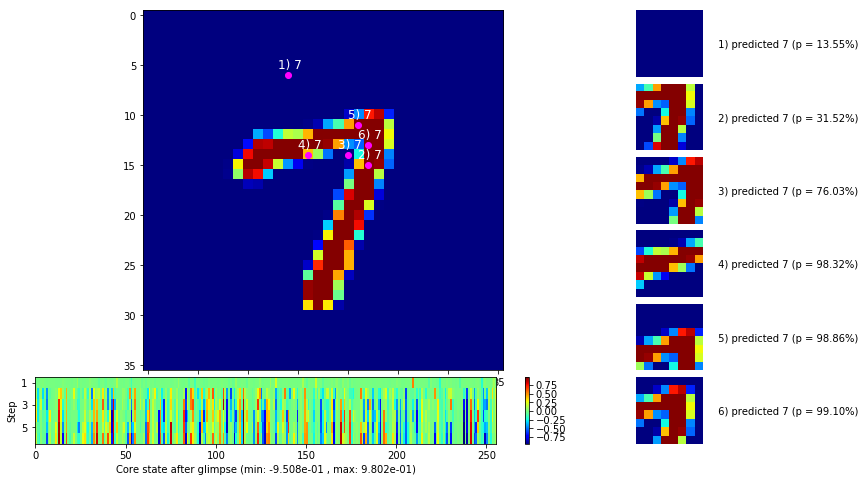


	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


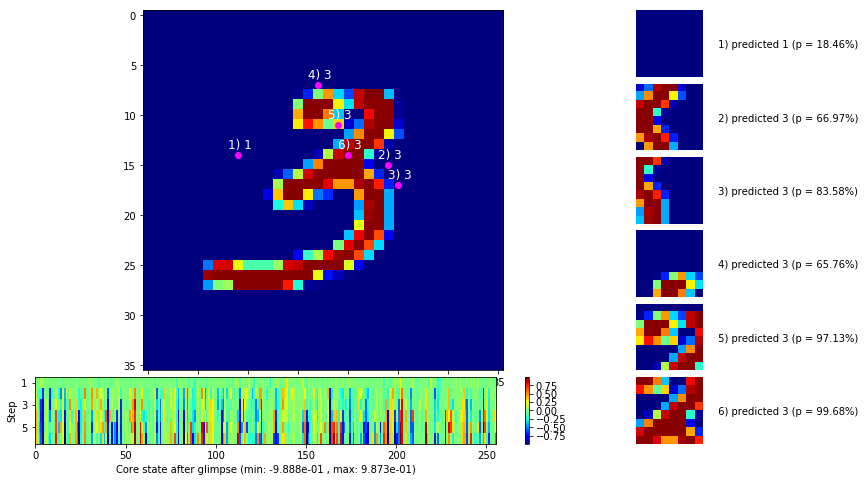

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


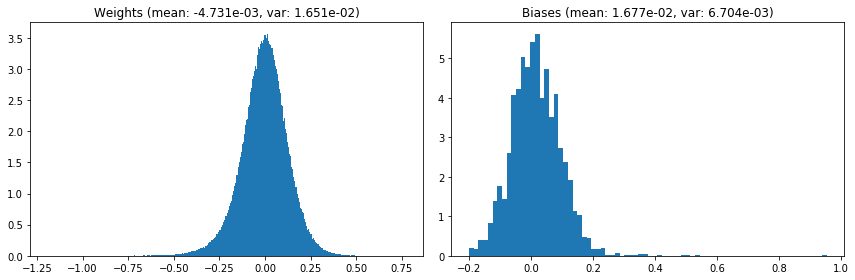

                                      Location network weights and biases


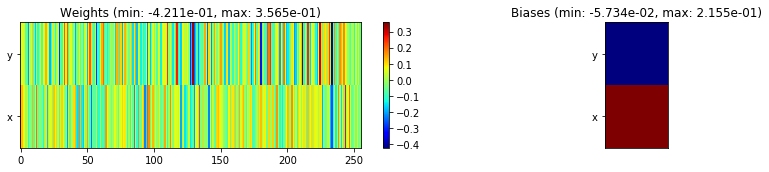

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.23 sec | TRAIN >> class loss: 0.2002 | steps:  2.098 :( | reward:  0.9328 :( | acc.: 93.280% :(
                          | VAL   >> class loss: 0.1866 | steps:  1.973 :( | reward:  0.9380 :( | acc.: 93.800% :(


Epoch  26/400) lr = 2.308e-05
 b    500/  3000 >> 141.5 ms/b | lr: 2.26e-05 | grad 2norm:  5.45 | grad inf norm:  1.300
       Weights || abs max:  1.19 (29130.89) | mean: -4.72e-03 ( 0.11) | var: 1.65e-02 (27363.45)
        Biases || abs max:  0.95 ( 3934.18) | mean:  1.68e-02 ( 1.89) | var: 6.71e-03 (2329171.25)
                  class loss: 0.196 | steps: 2.100 | reward:  0.932 | acc.: 93.19%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.6 ms/b | lr: 2.22e-05 | grad 2norm:  5.37 | grad inf norm:  1.284
       Weights || abs max:  1.19 (40001.40) | mean: -4.72e-03 ( 0.12)

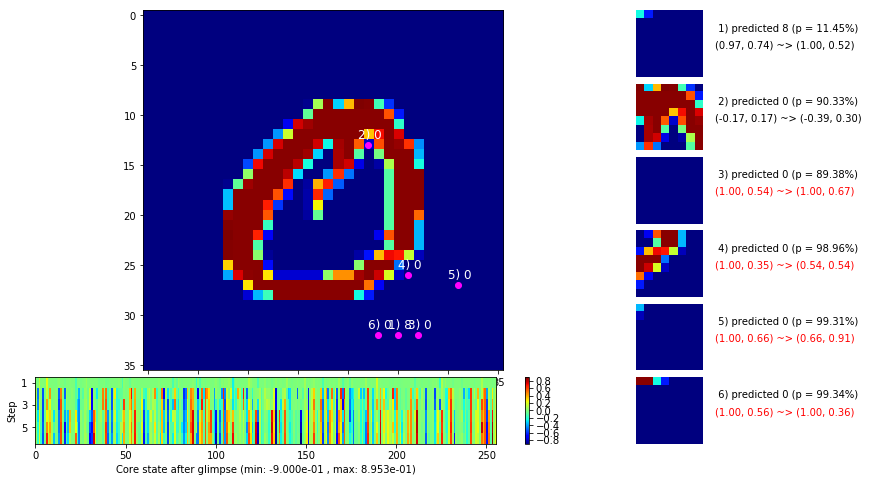

 b   1500/  3000 >> 137.2 ms/b | lr: 2.15e-05 | grad 2norm:  5.47 | grad inf norm:  1.318
       Weights || abs max:  1.19 (23368.60) | mean: -4.72e-03 ( 0.09) | var: 1.65e-02 (56241.04)
        Biases || abs max:  0.95 ( 1485.14) | mean:  1.68e-02 ( 1.03) | var: 6.71e-03 (59543.16)
                  class loss: 0.205 | steps: 2.101 | reward:  0.933 | acc.: 93.26%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.5 ms/b | lr: 2.11e-05 | grad 2norm:  5.34 | grad inf norm:  1.287
       Weights || abs max:  1.19 (20231.90) | mean: -4.71e-03 ( 0.08) | var: 1.65e-02 (12052.37)
        Biases || abs max:  0.95 ( 1700.24) | mean:  1.69e-02 ( 1.08) | var: 6.71e-03 (118928.85)
                  class loss: 0.197 | steps: 2.086 | reward:  0.934 | acc.: 93.36%
                 --------------------------------------------------------------------------------

	Target class: 0 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

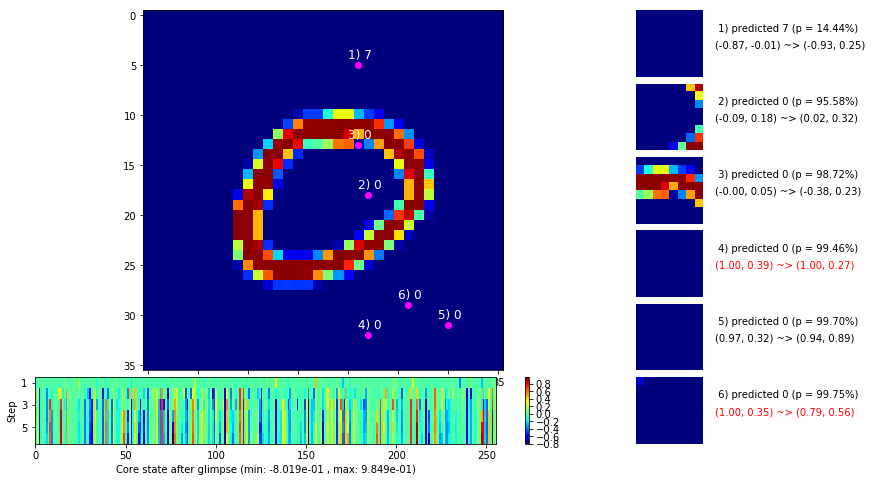

 b   2500/  3000 >> 136.9 ms/b | lr: 2.05e-05 | grad 2norm:  5.39 | grad inf norm:  1.292
       Weights || abs max:  1.19 ( 8973.32) | mean: -4.71e-03 ( 0.06) | var: 1.65e-02 (  952.30)
        Biases || abs max:  0.95 ( 4273.04) | mean:  1.69e-02 ( 3.59) | var: 6.71e-03 (4641407.50)
                  class loss: 0.211 | steps: 2.108 | reward:  0.932 | acc.: 93.21%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 135.6 ms/b | lr: 2.00e-05 | grad 2norm:  5.68 | grad inf norm:  1.350
       Weights || abs max:  1.19 ( 8150.05) | mean: -4.72e-03 ( 0.06) | var: 1.65e-02 ( 1136.20)
        Biases || abs max:  0.95 (  987.30) | mean:  1.68e-02 ( 0.77) | var: 6.71e-03 (48789.79)
                  class loss: 0.213 | steps: 2.125 | reward:  0.927 | acc.: 92.73%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.

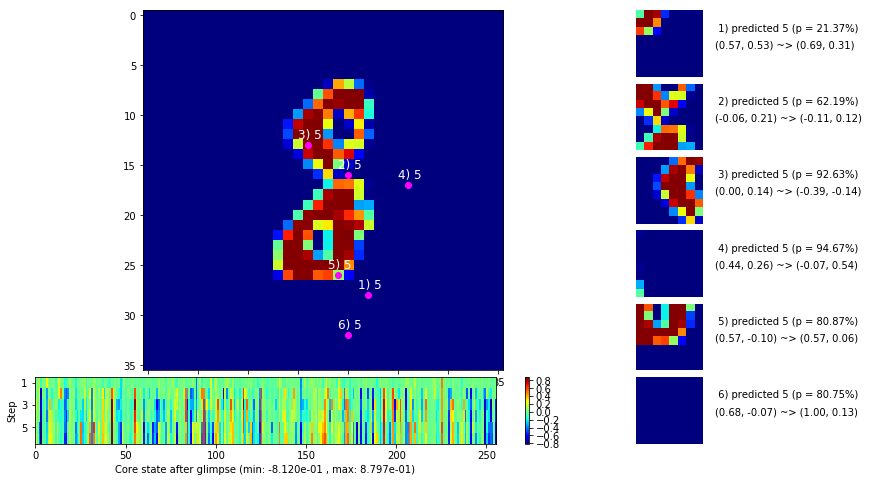

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


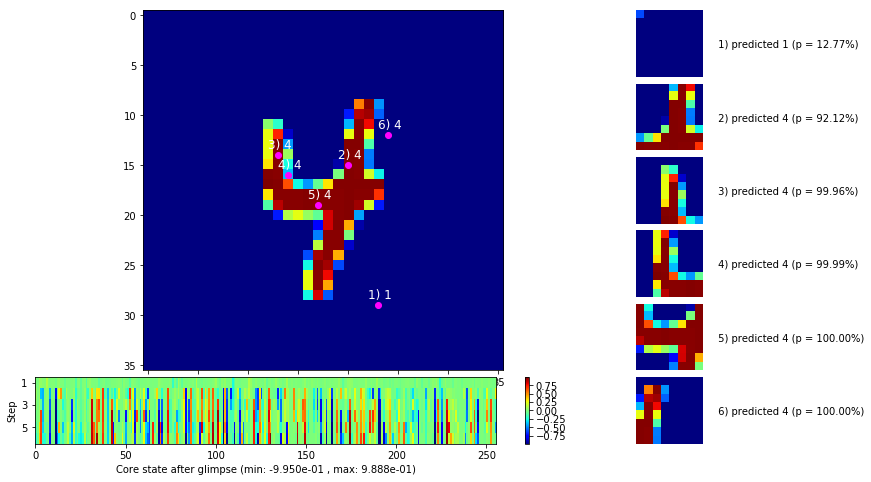


	Target class: 1  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


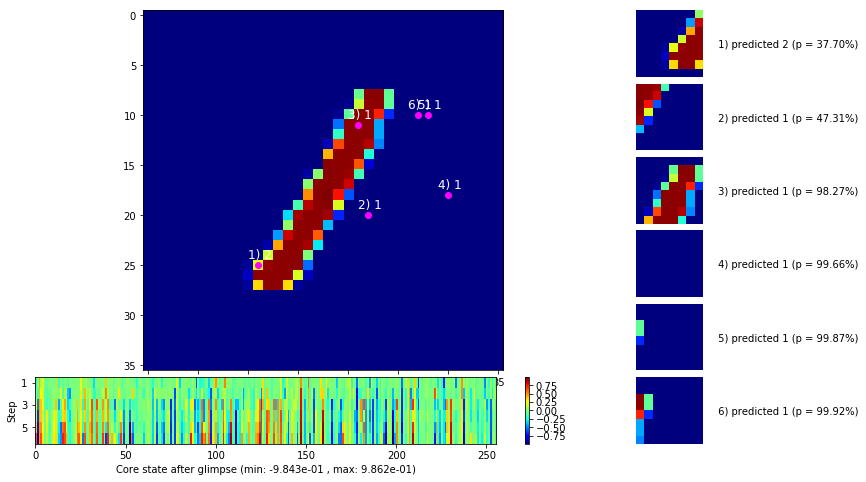

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


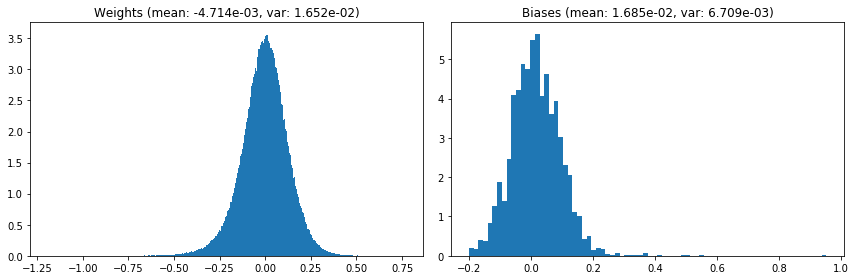

                                      Location network weights and biases


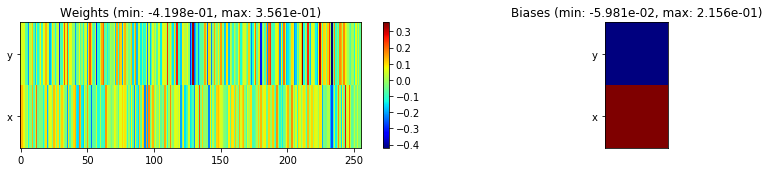

---------------------------------------------------------------------------------------------------------------
Elapsed time:  411.76 sec | TRAIN >> class loss: 0.2020 | steps:  2.101 :( | reward:  0.9321 :( | acc.: 93.212% :(
                          | VAL   >> class loss: 0.2052 | steps:  2.007 :( | reward:  0.9304 :( | acc.: 93.040% :(


Epoch  27/400) lr = 1.985e-05
 b    500/  3000 >> 136.0 ms/b | lr: 1.95e-05 | grad 2norm:  5.27 | grad inf norm:  1.299
       Weights || abs max:  1.19 (15962.59) | mean: -4.71e-03 ( 0.08) | var: 1.65e-02 (22654.07)
        Biases || abs max:  0.95 ( 1763.57) | mean:  1.69e-02 ( 1.09) | var: 6.71e-03 (69785.43)
                  class loss: 0.197 | steps: 2.093 | reward:  0.936 | acc.: 93.64%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 135.8 ms/b | lr: 1.91e-05 | grad 2norm:  5.27 | grad inf norm:  1.301
       Weights || abs max:  1.19 (15356.11) | mean: -4.70e-03 ( 0.08) |

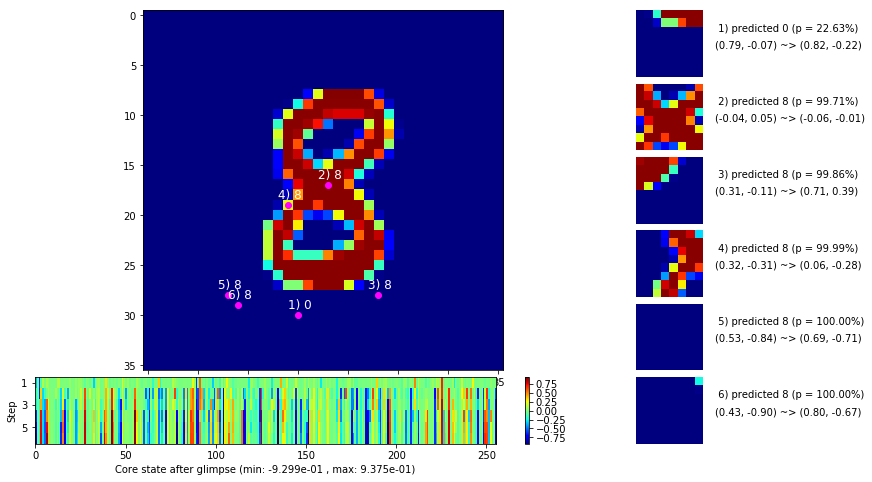

 b   1500/  3000 >> 146.4 ms/b | lr: 1.85e-05 | grad 2norm:  5.63 | grad inf norm:  1.362
       Weights || abs max:  1.19 (71941.45) | mean: -4.70e-03 ( 0.17) | var: 1.65e-02 (1384223.88)
        Biases || abs max:  0.95 (  901.69) | mean:  1.69e-02 ( 0.79) | var: 6.71e-03 ( 5085.40)
                  class loss: 0.214 | steps: 2.096 | reward:  0.927 | acc.: 92.68%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.1 ms/b | lr: 1.81e-05 | grad 2norm:  5.37 | grad inf norm:  1.337
       Weights || abs max:  1.19 (30191.55) | mean: -4.70e-03 ( 0.11) | var: 1.65e-02 (68490.09)
        Biases || abs max:  0.95 ( 4944.12) | mean:  1.69e-02 ( 2.46) | var: 6.71e-03 (1298872.12)
                  class loss: 0.201 | steps: 2.089 | reward:  0.934 | acc.: 93.39%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

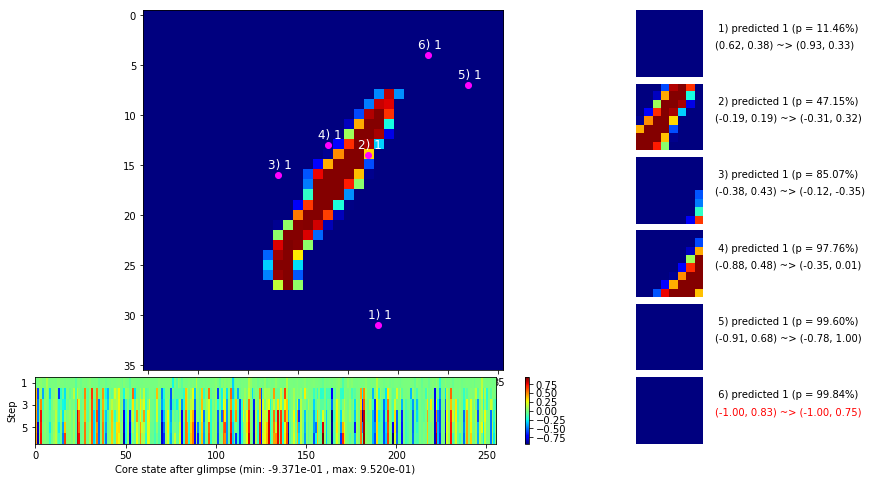

 b   2500/  3000 >> 137.3 ms/b | lr: 1.76e-05 | grad 2norm:  5.09 | grad inf norm:  1.226
       Weights || abs max:  1.19 (17418.57) | mean: -4.70e-03 ( 0.08) | var: 1.65e-02 ( 2726.24)
        Biases || abs max:  0.95 ( 4514.45) | mean:  1.69e-02 ( 2.48) | var: 6.71e-03 (337448.94)
                  class loss: 0.182 | steps: 2.106 | reward:  0.939 | acc.: 93.88%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.5 ms/b | lr: 1.72e-05 | grad 2norm:  5.02 | grad inf norm:  1.247
       Weights || abs max:  1.19 (36614.17) | mean: -4.69e-03 ( 0.11) | var: 1.65e-02 (222236.22)
        Biases || abs max:  0.96 ( 1946.46) | mean:  1.70e-02 ( 1.24) | var: 6.71e-03 (89179.77)
                  class loss: 0.182 | steps: 2.078 | reward:  0.941 | acc.: 94.07%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

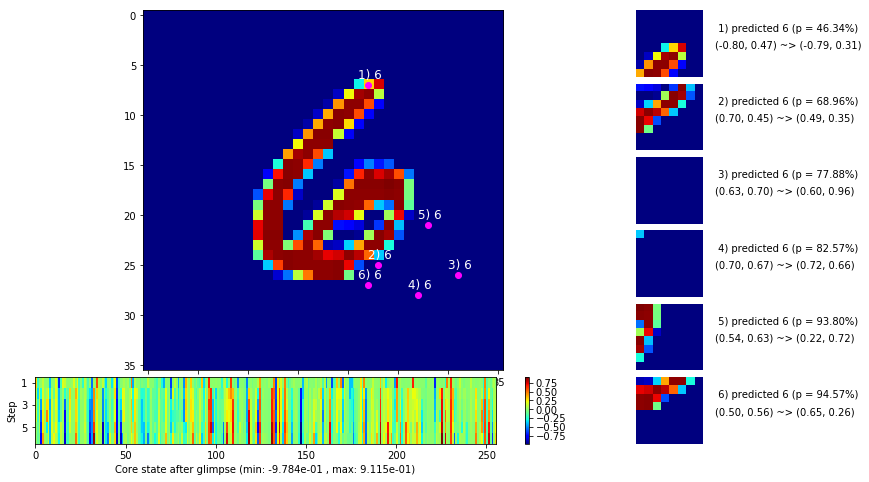

                                          ---===  VALIDATION  ===---

	Target class: 2  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


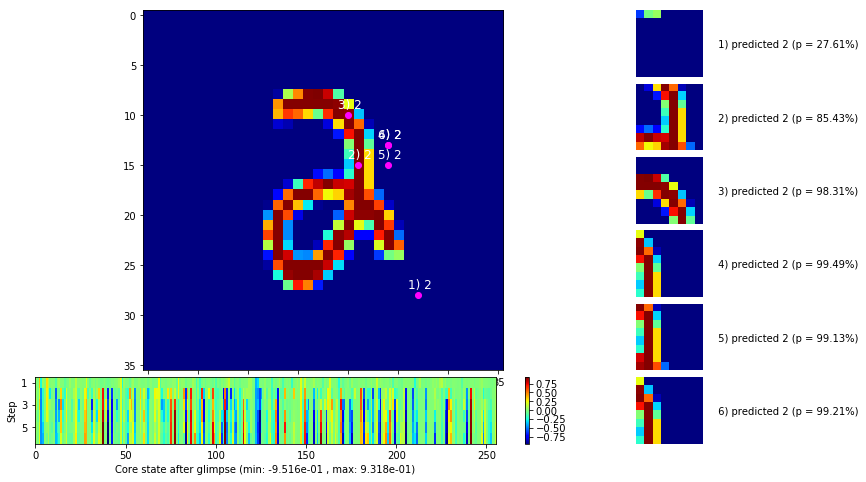


	Target class: 8  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


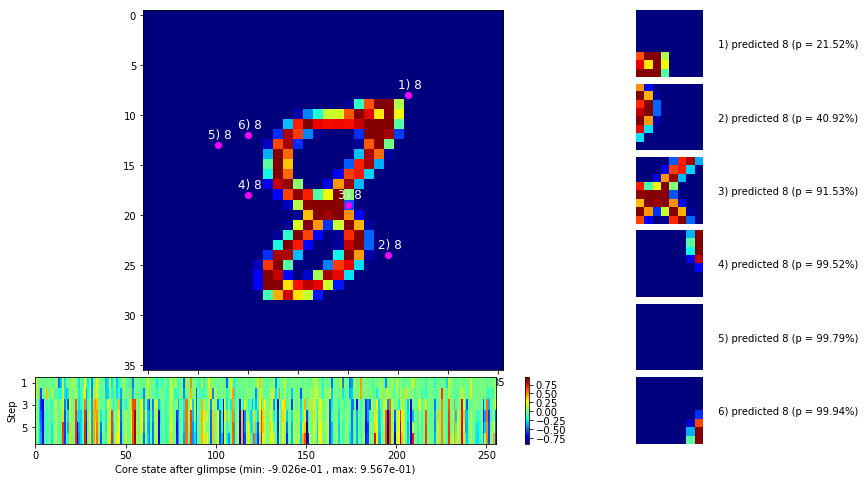

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


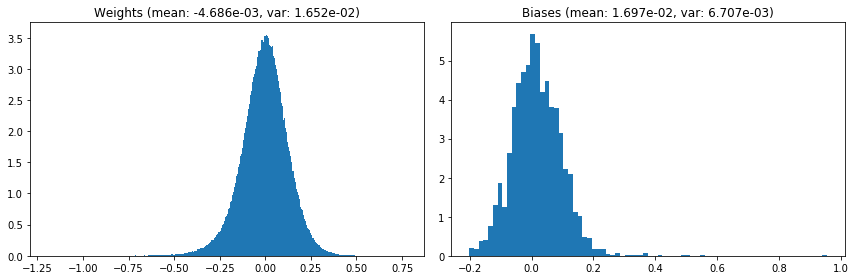

                                      Location network weights and biases


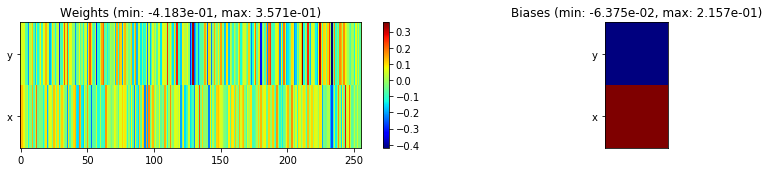

---------------------------------------------------------------------------------------------------------------
Elapsed time:  414.56 sec | TRAIN >> class loss: 0.1953 | steps:  2.090    | reward:  0.9353 :( | acc.: 93.532% :(
                          | VAL   >> class loss: 0.2110 | steps:  2.013 :( | reward:  0.9296 :( | acc.: 92.960% :(


Epoch  28/400) lr = 1.707e-05
 b    500/  3000 >> 136.8 ms/b | lr: 1.67e-05 | grad 2norm:  5.24 | grad inf norm:  1.313
       Weights || abs max:  1.19 (13330.45) | mean: -4.69e-03 ( 0.07) | var: 1.65e-02 ( 5243.86)
        Biases || abs max:  0.96 ( 1038.43) | mean:  1.70e-02 ( 0.84) | var: 6.70e-03 ( 9983.85)
                  class loss: 0.198 | steps: 2.099 | reward:  0.935 | acc.: 93.54%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.9 ms/b | lr: 1.64e-05 | grad 2norm:  5.47 | grad inf norm:  1.310
       Weights || abs max:  1.19 (22846.94) | mean: -4.69e-03 ( 0.10) |

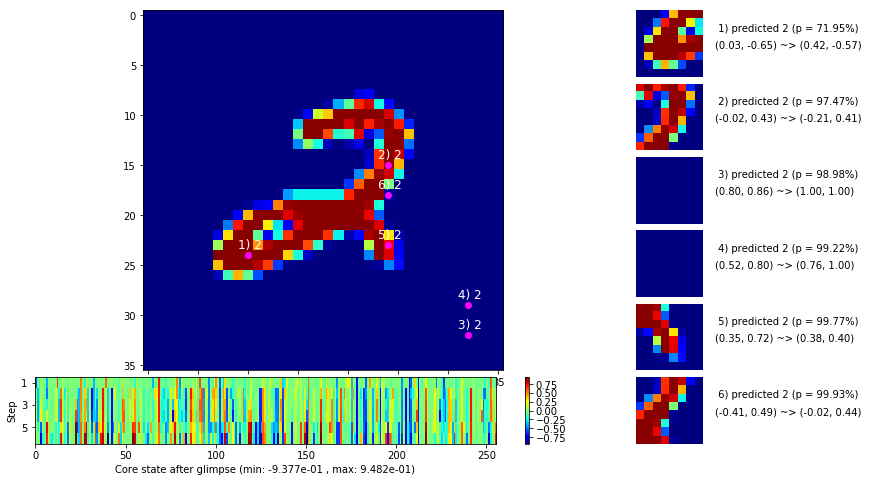

 b   1500/  3000 >> 137.2 ms/b | lr: 1.59e-05 | grad 2norm:  5.55 | grad inf norm:  1.298
       Weights || abs max:  1.19 (20812.99) | mean: -4.69e-03 ( 0.09) | var: 1.65e-02 ( 8930.06)
        Biases || abs max:  0.95 (  528.76) | mean:  1.70e-02 ( 0.54) | var: 6.70e-03 (  839.19)
                  class loss: 0.207 | steps: 2.109 | reward:  0.930 | acc.: 92.97%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.3 ms/b | lr: 1.56e-05 | grad 2norm:  5.38 | grad inf norm:  1.329
       Weights || abs max:  1.19 (15237.12) | mean: -4.69e-03 ( 0.08) | var: 1.65e-02 ( 9121.61)
        Biases || abs max:  0.95 (  841.95) | mean:  1.70e-02 ( 0.67) | var: 6.70e-03 (22642.92)
                  class loss: 0.200 | steps: 2.086 | reward:  0.933 | acc.: 93.29%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

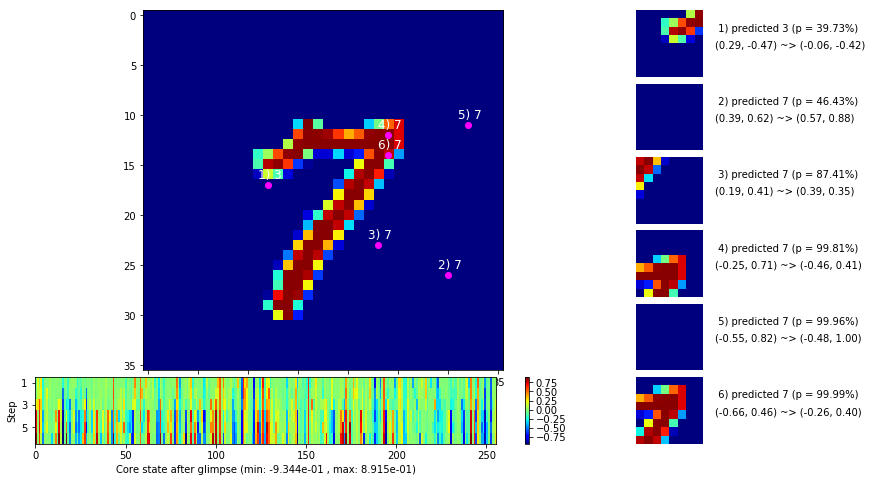

 b   2500/  3000 >> 139.9 ms/b | lr: 1.51e-05 | grad 2norm:  5.26 | grad inf norm:  1.244
       Weights || abs max:  1.19 (20981.05) | mean: -4.68e-03 ( 0.09) | var: 1.65e-02 (89001.36)
        Biases || abs max:  0.95 (  706.47) | mean:  1.70e-02 ( 0.60) | var: 6.71e-03 ( 8149.76)
                  class loss: 0.193 | steps: 2.096 | reward:  0.936 | acc.: 93.60%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 145.0 ms/b | lr: 1.48e-05 | grad 2norm:  5.56 | grad inf norm:  1.380
       Weights || abs max:  1.19 (136999.38) | mean: -4.68e-03 ( 0.29) | var: 1.65e-02 (5081498.00)
        Biases || abs max:  0.95 ( 2626.49) | mean:  1.70e-02 ( 1.38) | var: 6.71e-03 (138218.81)
                  class loss: 0.207 | steps: 2.093 | reward:  0.929 | acc.: 92.89%
                 --------------------------------------------------------------------------------

	Target class: 9 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 

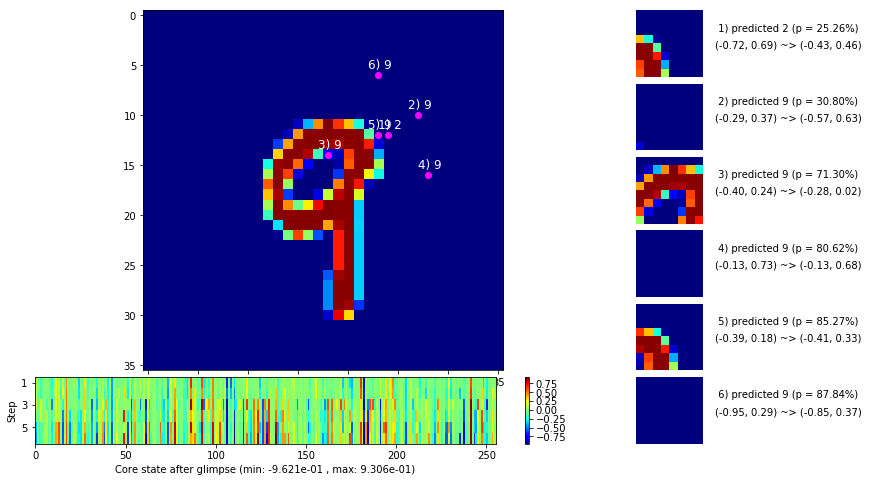

                                          ---===  VALIDATION  ===---

	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


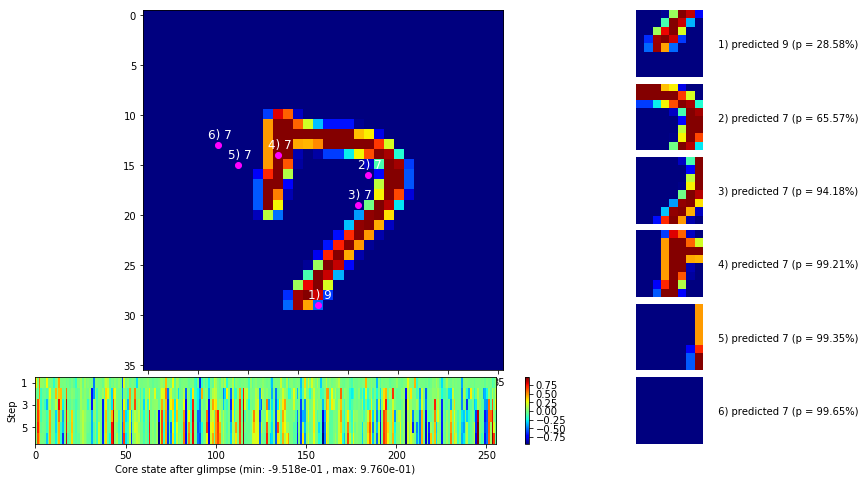


	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


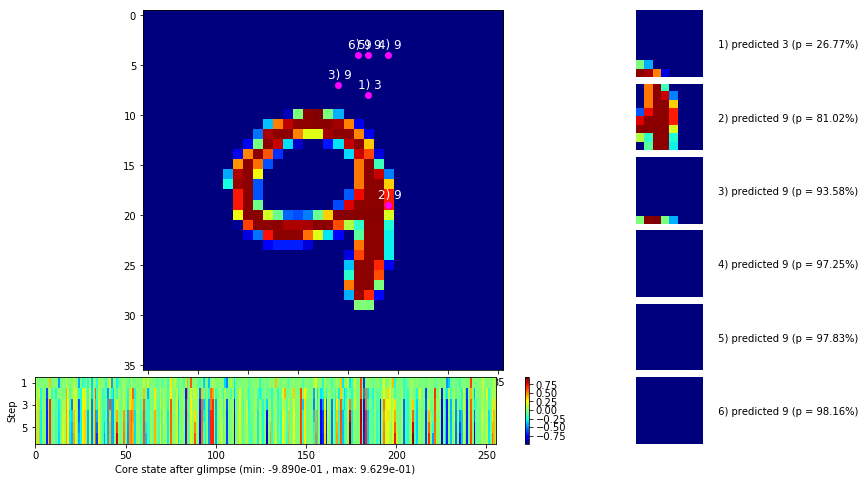

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


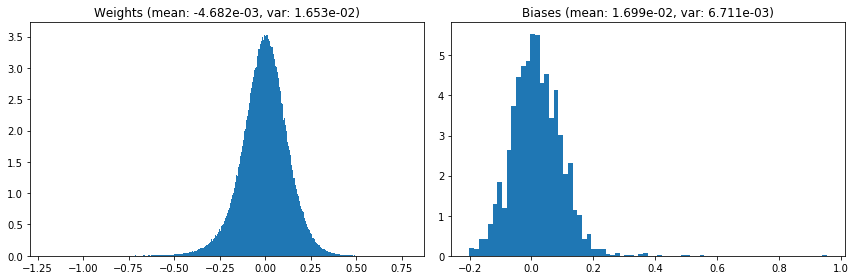

                                      Location network weights and biases


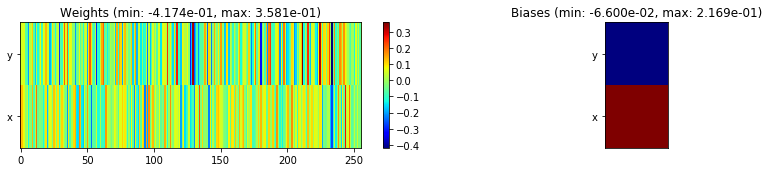

---------------------------------------------------------------------------------------------------------------
Elapsed time:  415.11 sec | TRAIN >> class loss: 0.2011 | steps:  2.099 :( | reward:  0.9324 :( | acc.: 93.238% :(
                          | VAL   >> class loss: 0.2098 | steps:  1.972 :( | reward:  0.9314 :( | acc.: 93.140% :(


Epoch  29/400) lr = 1.468e-05
 b    500/  3000 >> 135.7 ms/b | lr: 1.44e-05 | grad 2norm:  5.53 | grad inf norm:  1.336
       Weights || abs max:  1.19 (15572.60) | mean: -4.68e-03 ( 0.08) | var: 1.65e-02 ( 4938.79)
        Biases || abs max:  0.95 ( 5438.65) | mean:  1.70e-02 ( 2.48) | var: 6.71e-03 (2986557.50)
                  class loss: 0.203 | steps: 2.114 | reward:  0.930 | acc.: 92.98%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 136.5 ms/b | lr: 1.41e-05 | grad 2norm:  5.38 | grad inf norm:  1.246
       Weights || abs max:  1.19 (35226.57) | mean: -4.68e-03 ( 0.12)

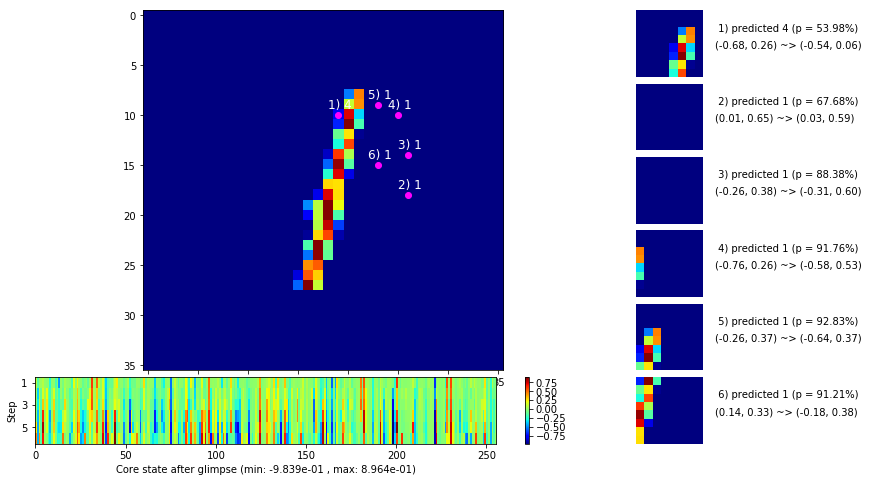

 b   1500/  3000 >> 136.7 ms/b | lr: 1.37e-05 | grad 2norm:  5.39 | grad inf norm:  1.276
       Weights || abs max:  1.19 (38301.93) | mean: -4.68e-03 ( 0.12) | var: 1.65e-02 (71945.49)
        Biases || abs max:  0.95 (  862.01) | mean:  1.70e-02 ( 0.66) | var: 6.71e-03 ( 6978.53)
                  class loss: 0.203 | steps: 2.101 | reward:  0.932 | acc.: 93.23%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.7 ms/b | lr: 1.34e-05 | grad 2norm:  5.39 | grad inf norm:  1.311
       Weights || abs max:  1.19 (17446.80) | mean: -4.68e-03 ( 0.08) | var: 1.65e-02 ( 3884.67)
        Biases || abs max:  0.95 ( 4447.69) | mean:  1.70e-02 ( 2.07) | var: 6.71e-03 (1046742.00)
                  class loss: 0.202 | steps: 2.097 | reward:  0.932 | acc.: 93.25%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

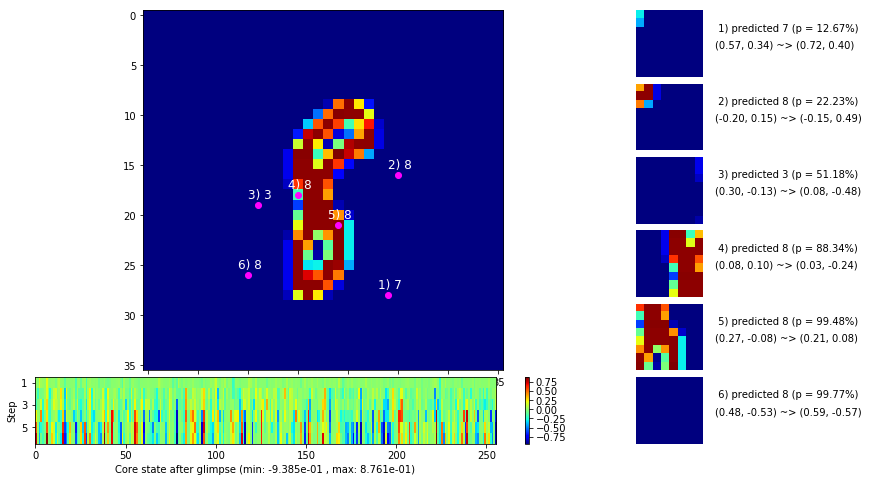

 b   2500/  3000 >> 135.2 ms/b | lr: 1.30e-05 | grad 2norm:  5.26 | grad inf norm:  1.278
       Weights || abs max:  1.19 (17717.07) | mean: -4.68e-03 ( 0.08) | var: 1.65e-02 ( 9376.12)
        Biases || abs max:  0.95 (  180.12) | mean:  1.70e-02 ( 0.36) | var: 6.71e-03 (   59.49)
                  class loss: 0.198 | steps: 2.094 | reward:  0.934 | acc.: 93.45%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.6 ms/b | lr: 1.28e-05 | grad 2norm:  5.62 | grad inf norm:  1.315
       Weights || abs max:  1.19 (44520.68) | mean: -4.67e-03 ( 0.13) | var: 1.65e-02 (74287.90)
        Biases || abs max:  0.95 (  111.14) | mean:  1.70e-02 ( 0.35) | var: 6.71e-03 (   13.85)
                  class loss: 0.207 | steps: 2.075 | reward:  0.930 | acc.: 93.02%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

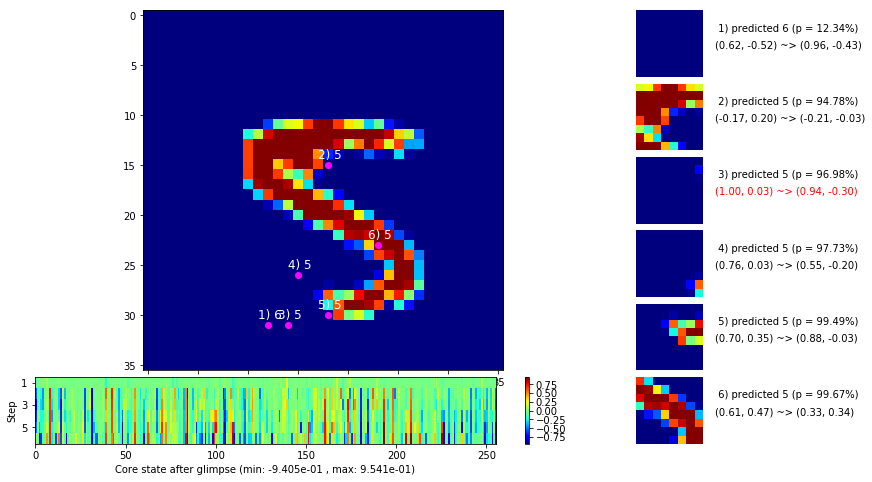

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


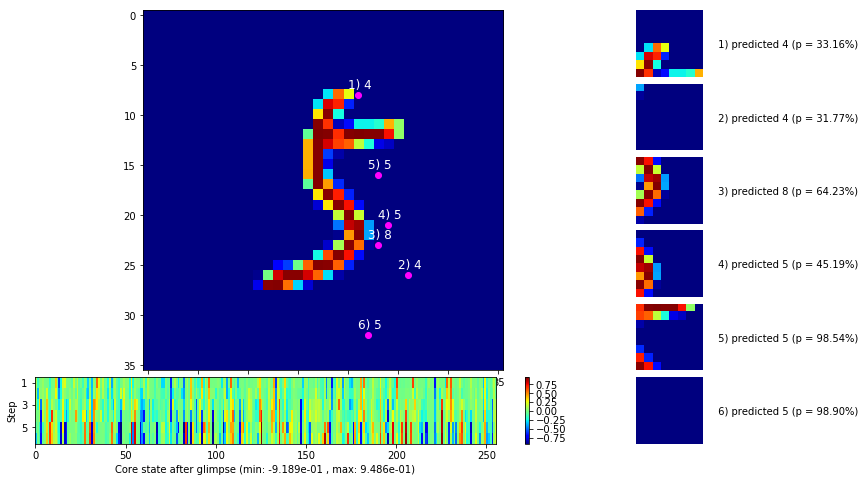


	Target class: 9  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


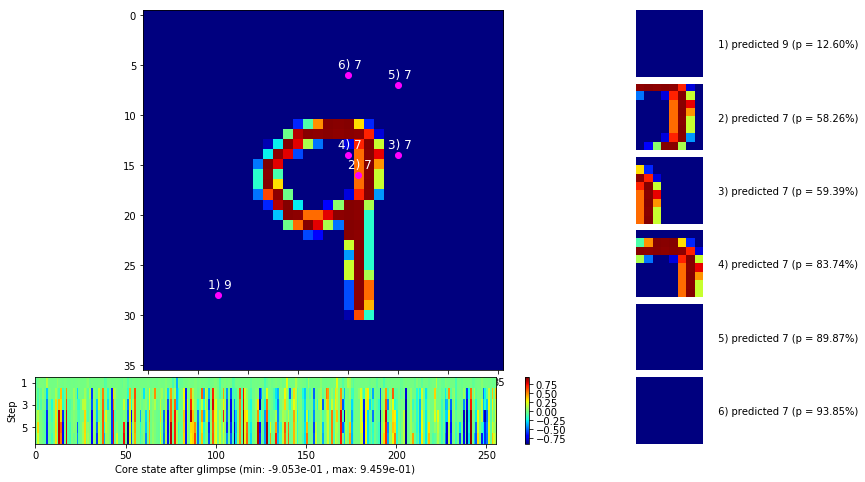

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


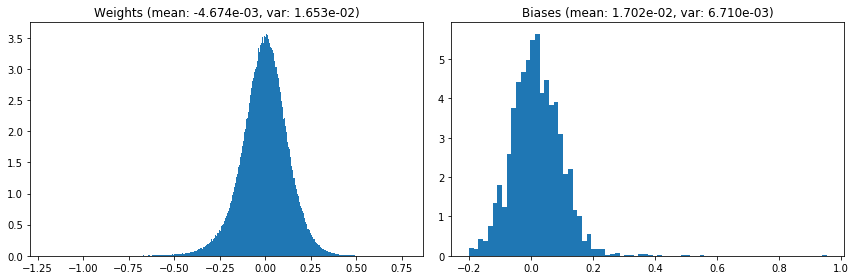

                                      Location network weights and biases


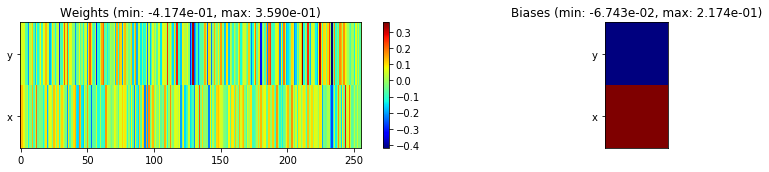

---------------------------------------------------------------------------------------------------------------
Elapsed time:  406.70 sec | TRAIN >> class loss: 0.2018 | steps:  2.099 :( | reward:  0.9322 :( | acc.: 93.222% :(
                          | VAL   >> class loss: 0.2125 | steps:  1.981 :( | reward:  0.9310 :( | acc.: 93.100% :(


Epoch  30/400) lr = 1.263e-05
 b    500/  3000 >> 135.2 ms/b | lr: 1.24e-05 | grad 2norm:  5.43 | grad inf norm:  1.339
       Weights || abs max:  1.19 (18344.34) | mean: -4.67e-03 ( 0.08) | var: 1.65e-02 (40210.36)
        Biases || abs max:  0.95 (  119.80) | mean:  1.70e-02 ( 0.36) | var: 6.71e-03 (  105.93)
                  class loss: 0.198 | steps: 2.093 | reward:  0.933 | acc.: 93.30%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 145.4 ms/b | lr: 1.21e-05 | grad 2norm:  5.43 | grad inf norm:  1.302
       Weights || abs max:  1.19 (39490.34) | mean: -4.67e-03 ( 0.12) |

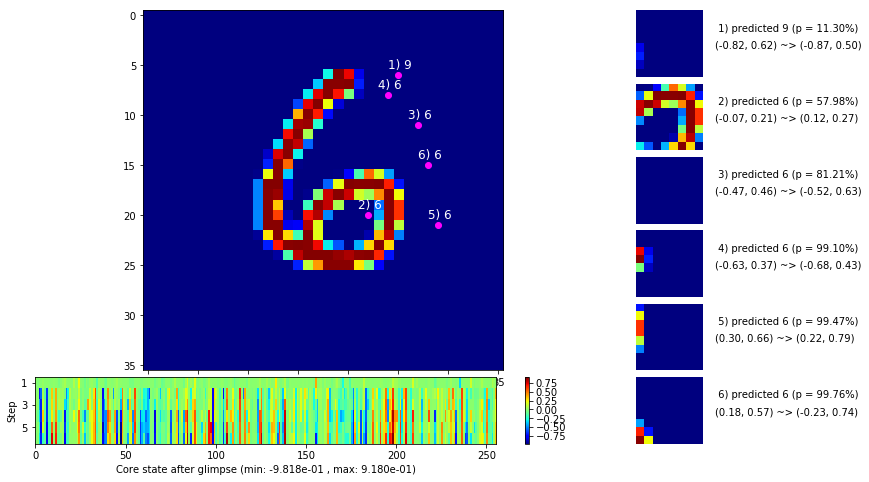

 b   1500/  3000 >> 137.6 ms/b | lr: 1.18e-05 | grad 2norm:  5.48 | grad inf norm:  1.309
       Weights || abs max:  1.19 (29495.14) | mean: -4.67e-03 ( 0.11) | var: 1.65e-02 (19579.14)
        Biases || abs max:  0.95 ( 2702.58) | mean:  1.70e-02 ( 1.37) | var: 6.71e-03 (1070116.75)
                  class loss: 0.200 | steps: 2.073 | reward:  0.932 | acc.: 93.18%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 135.7 ms/b | lr: 1.15e-05 | grad 2norm:  5.49 | grad inf norm:  1.293
       Weights || abs max:  1.19 (34416.93) | mean: -4.67e-03 ( 0.12) | var: 1.65e-02 (135941.64)
        Biases || abs max:  0.95 ( 1013.56) | mean:  1.70e-02 ( 0.71) | var: 6.71e-03 ( 4684.32)
                  class loss: 0.212 | steps: 2.111 | reward:  0.931 | acc.: 93.13%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

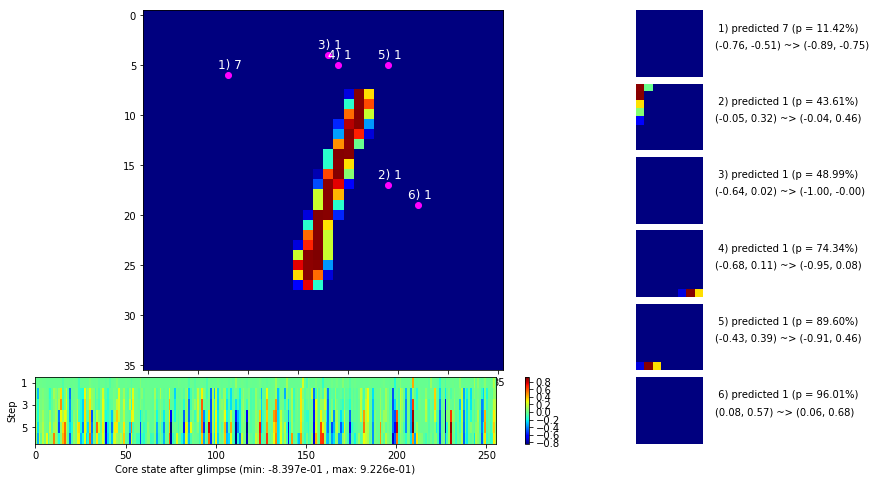

 b   2500/  3000 >> 134.0 ms/b | lr: 1.12e-05 | grad 2norm:  5.55 | grad inf norm:  1.314
       Weights || abs max:  1.19 (18849.21) | mean: -4.67e-03 ( 0.09) | var: 1.65e-02 ( 8063.19)
        Biases || abs max:  0.95 ( 1299.71) | mean:  1.70e-02 ( 0.87) | var: 6.71e-03 (14404.00)
                  class loss: 0.199 | steps: 2.100 | reward:  0.930 | acc.: 93.03%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 136.2 ms/b | lr: 1.10e-05 | grad 2norm:  5.45 | grad inf norm:  1.293
       Weights || abs max:  1.19 (26905.04) | mean: -4.67e-03 ( 0.10) | var: 1.65e-02 (49428.51)
        Biases || abs max:  0.95 ( 1944.33) | mean:  1.70e-02 ( 1.07) | var: 6.71e-03 (102674.60)
                  class loss: 0.207 | steps: 2.123 | reward:  0.933 | acc.: 93.30%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

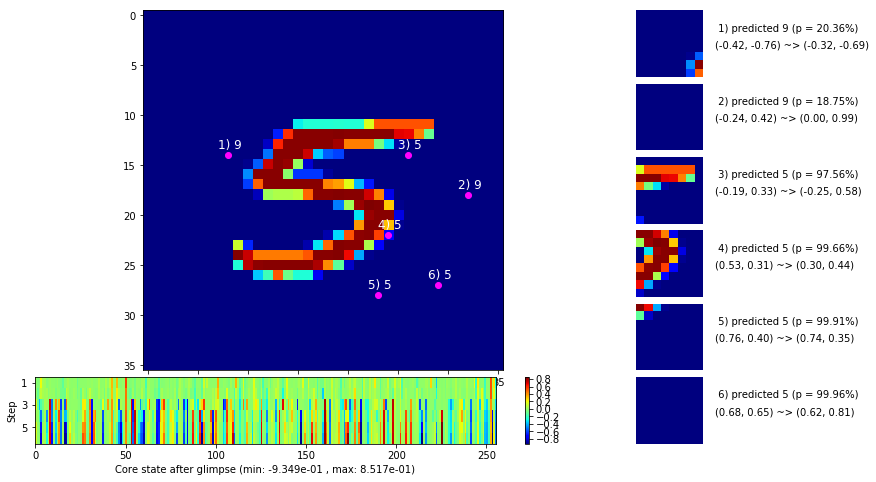

                                          ---===  VALIDATION  ===---

	Target class: 9  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


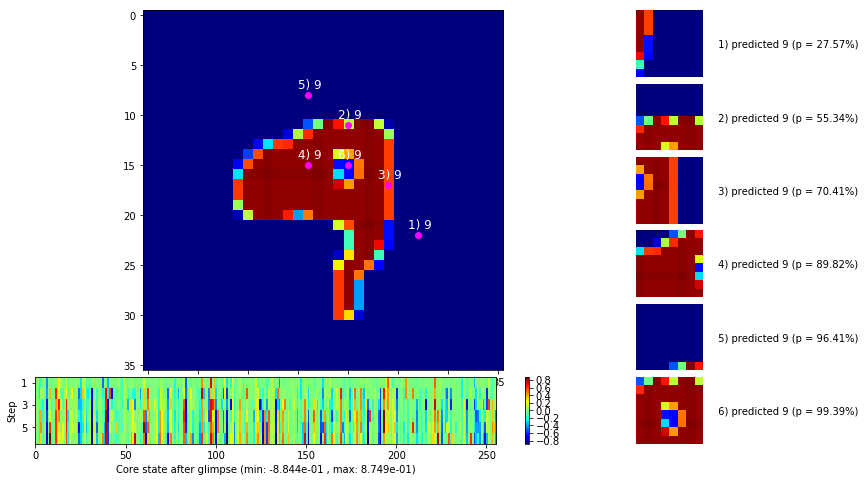


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


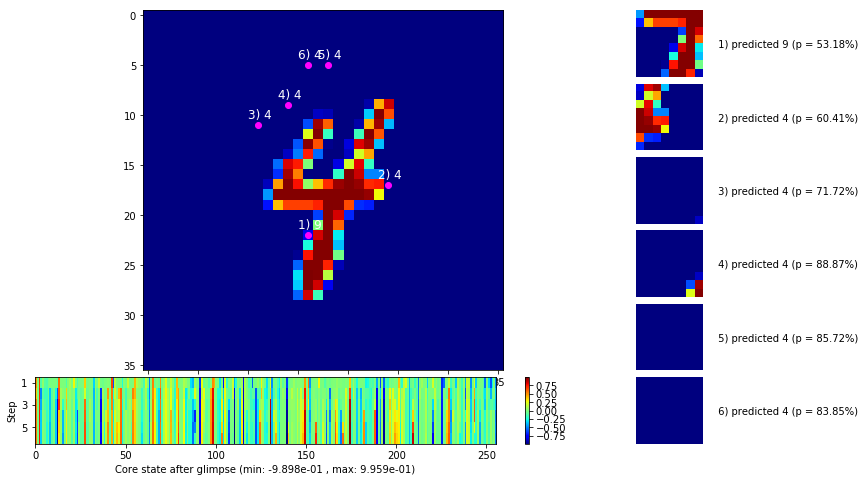

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


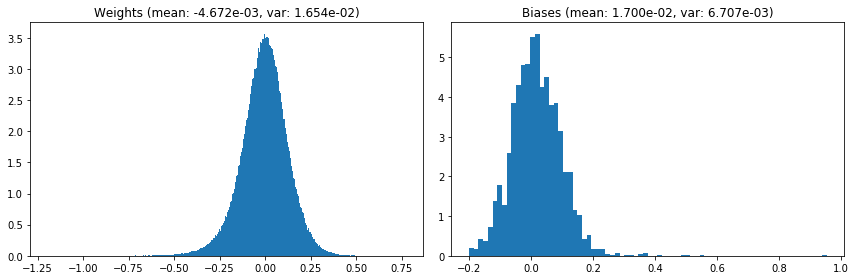

                                      Location network weights and biases


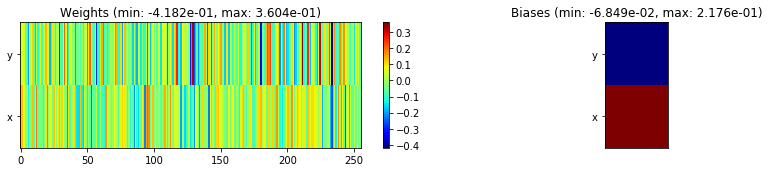

---------------------------------------------------------------------------------------------------------------
Elapsed time:  412.70 sec | TRAIN >> class loss: 0.2032 | steps:  2.103 :( | reward:  0.9318 :( | acc.: 93.180% :(
                          | VAL   >> class loss: 0.2070 | steps:  1.987 :( | reward:  0.9314 :( | acc.: 93.140% :(


Epoch  31/400) lr = 1.086e-05
 b    500/  3000 >> 133.2 ms/b | lr: 1.06e-05 | grad 2norm:  5.32 | grad inf norm:  1.258
       Weights || abs max:  1.19 (38072.87) | mean: -4.67e-03 ( 0.13) | var: 1.65e-02 (31768.19)
        Biases || abs max:  0.95 (  327.76) | mean:  1.70e-02 ( 0.43) | var: 6.71e-03 (  477.21)
                  class loss: 0.191 | steps: 2.089 | reward:  0.936 | acc.: 93.57%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.6 ms/b | lr: 1.04e-05 | grad 2norm:  5.48 | grad inf norm:  1.307
       Weights || abs max:  1.19 (23449.68) | mean: -4.67e-03 ( 0.10) |

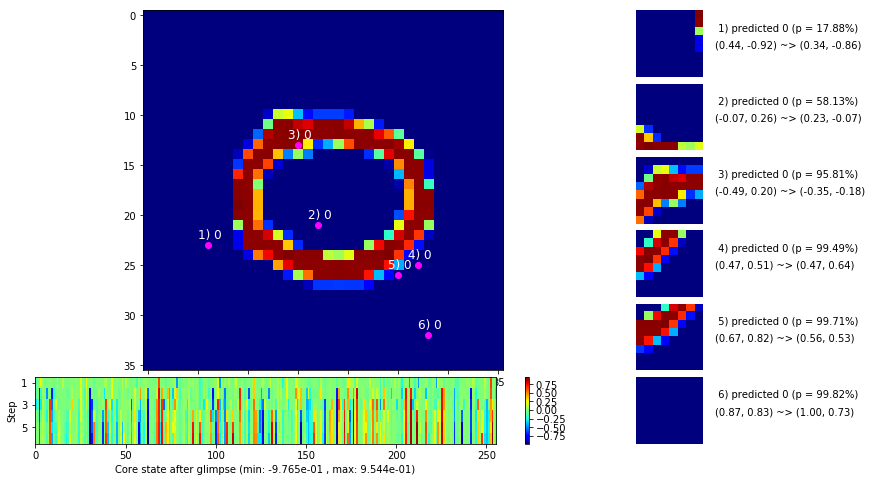

 b   1500/  3000 >> 136.1 ms/b | lr: 1.01e-05 | grad 2norm:  5.23 | grad inf norm:  1.283
       Weights || abs max:  1.19 (23878.92) | mean: -4.66e-03 ( 0.09) | var: 1.65e-02 (39850.53)
        Biases || abs max:  0.95 ( 3298.08) | mean:  1.70e-02 ( 1.63) | var: 6.71e-03 (445809.94)
                  class loss: 0.194 | steps: 2.096 | reward:  0.936 | acc.: 93.57%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.5 ms/b | lr: 9.92e-06 | grad 2norm:  5.37 | grad inf norm:  1.340
       Weights || abs max:  1.19 (31822.96) | mean: -4.66e-03 ( 0.11) | var: 1.65e-02 (80135.46)
        Biases || abs max:  0.95 (  850.06) | mean:  1.70e-02 ( 0.70) | var: 6.71e-03 (17164.34)
                  class loss: 0.204 | steps: 2.115 | reward:  0.932 | acc.: 93.19%
                 --------------------------------------------------------------------------------

	Target class: 7 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

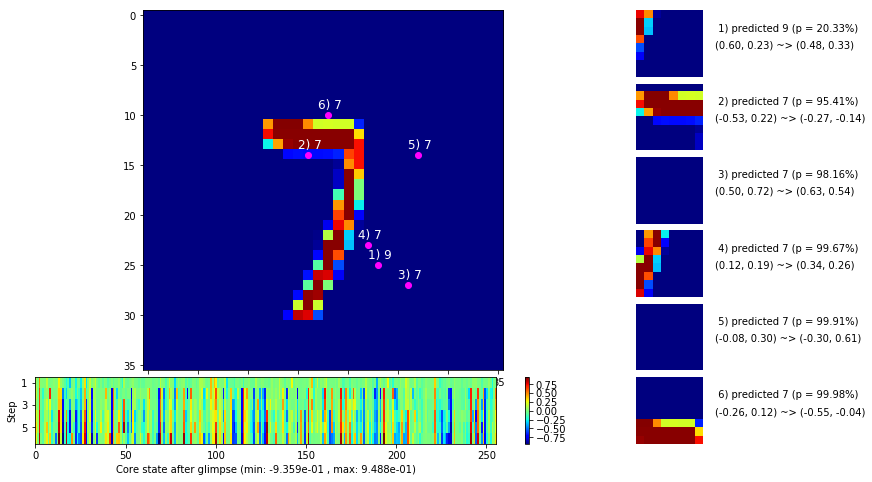

 b   2500/  3000 >> 145.5 ms/b | lr: 9.63e-06 | grad 2norm:  5.60 | grad inf norm:  1.291
       Weights || abs max:  1.19 (16019.95) | mean: -4.66e-03 ( 0.08) | var: 1.65e-02 (16592.65)
        Biases || abs max:  0.95 (  895.37) | mean:  1.70e-02 ( 0.75) | var: 6.71e-03 ( 4675.50)
                  class loss: 0.213 | steps: 2.108 | reward:  0.929 | acc.: 92.92%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 132.2 ms/b | lr: 9.43e-06 | grad 2norm:  5.30 | grad inf norm:  1.274
       Weights || abs max:  1.19 (58873.56) | mean: -4.66e-03 ( 0.16) | var: 1.65e-02 (610914.12)
        Biases || abs max:  0.95 (  734.55) | mean:  1.70e-02 ( 0.65) | var: 6.71e-03 (34225.93)
                  class loss: 0.198 | steps: 2.096 | reward:  0.934 | acc.: 93.44%
                 --------------------------------------------------------------------------------

	Target class: 3 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0

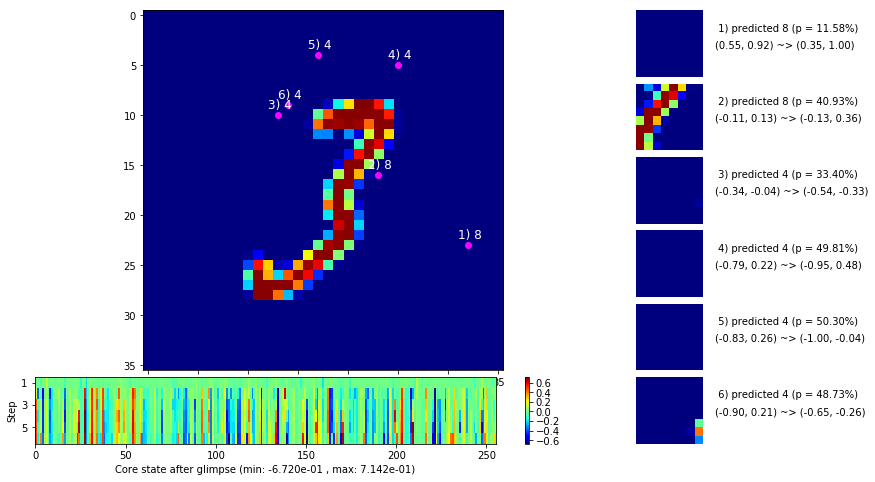

                                          ---===  VALIDATION  ===---

	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


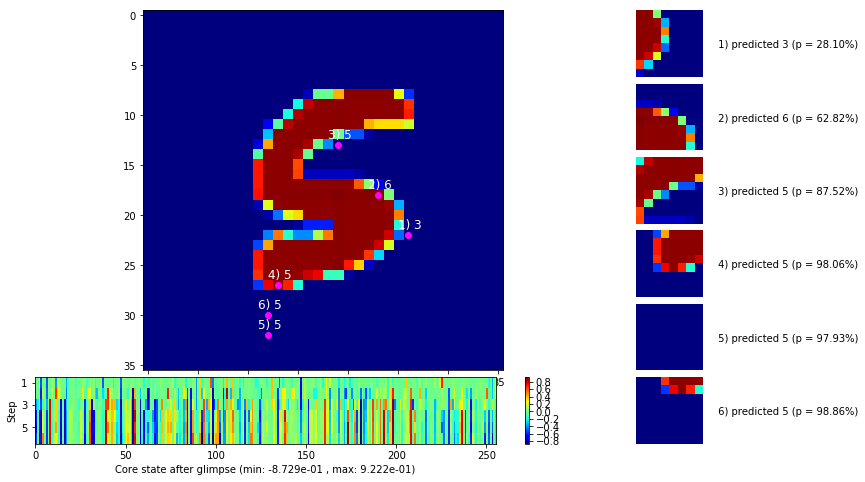


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


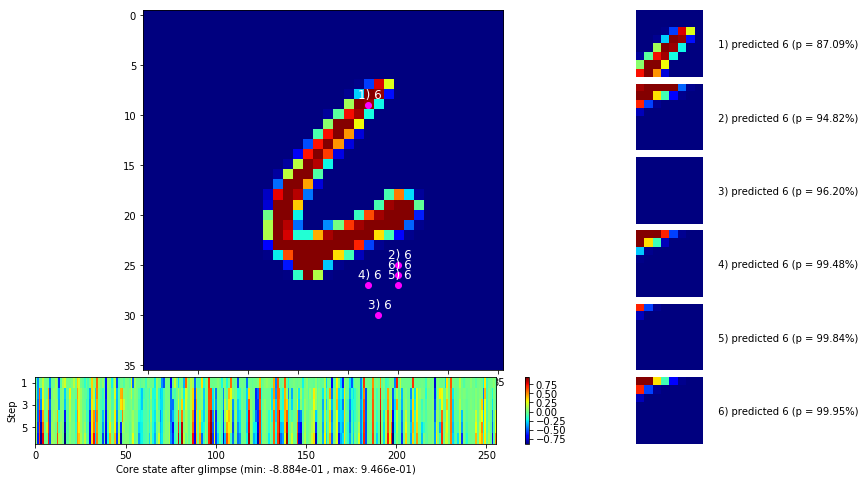

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


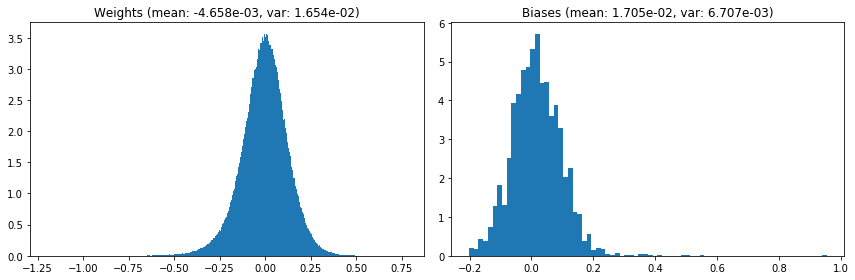

                                      Location network weights and biases


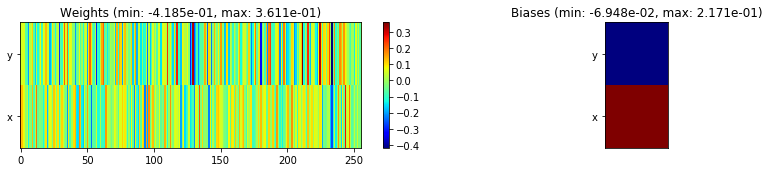

---------------------------------------------------------------------------------------------------------------
Elapsed time:  408.17 sec | TRAIN >> class loss: 0.2004 | steps:  2.102 :( | reward:  0.9330 :( | acc.: 93.297% :(
                          | VAL   >> class loss: 0.2043 | steps:  1.986 :( | reward:  0.9314 :( | acc.: 93.140% :(


Epoch  32/400) lr = 9.34e-06
 b    500/  3000 >> 134.8 ms/b | lr: 9.15e-06 | grad 2norm:  5.39 | grad inf norm:  1.311
       Weights || abs max:  1.19 (10102.50) | mean: -4.66e-03 ( 0.07) | var: 1.65e-02 ( 5628.08)
        Biases || abs max:  0.95 ( 1143.24) | mean:  1.71e-02 ( 0.84) | var: 6.71e-03 (61282.53)
                  class loss: 0.199 | steps: 2.108 | reward:  0.933 | acc.: 93.34%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.6 ms/b | lr: 8.97e-06 | grad 2norm:  5.34 | grad inf norm:  1.265
       Weights || abs max:  1.19 (26392.10) | mean: -4.66e-03 ( 0.10) | 

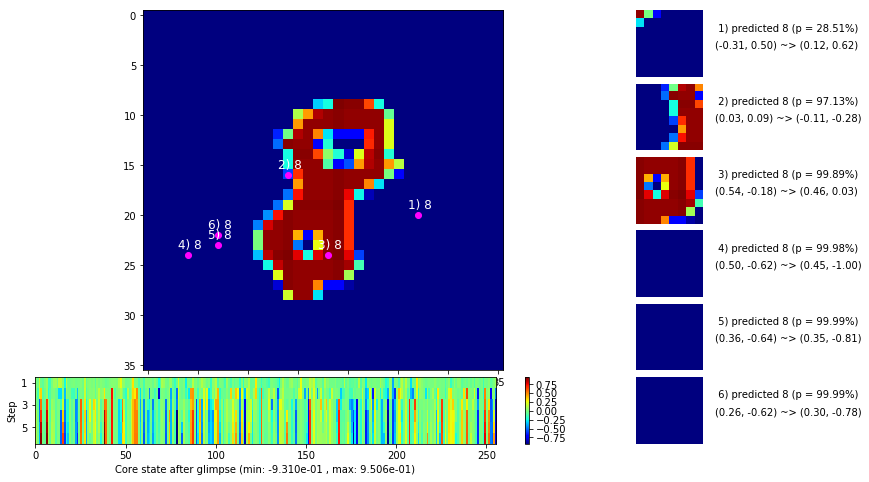

 b   1500/  3000 >> 135.1 ms/b | lr: 8.71e-06 | grad 2norm:  5.55 | grad inf norm:  1.326
       Weights || abs max:  1.19 (55407.21) | mean: -4.66e-03 ( 0.15) | var: 1.65e-02 (125392.99)
        Biases || abs max:  0.95 ( 4313.97) | mean:  1.71e-02 ( 2.22) | var: 6.71e-03 (496406.91)
                  class loss: 0.198 | steps: 2.108 | reward:  0.931 | acc.: 93.09%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.8 ms/b | lr: 8.53e-06 | grad 2norm:  5.58 | grad inf norm:  1.327
       Weights || abs max:  1.19 (14406.17) | mean: -4.66e-03 ( 0.07) | var: 1.65e-02 ( 6923.20)
        Biases || abs max:  0.95 ( 1477.64) | mean:  1.71e-02 ( 1.25) | var: 6.71e-03 (16466.25)
                  class loss: 0.209 | steps: 2.095 | reward:  0.929 | acc.: 92.90%
                 --------------------------------------------------------------------------------

	Target class: 1 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

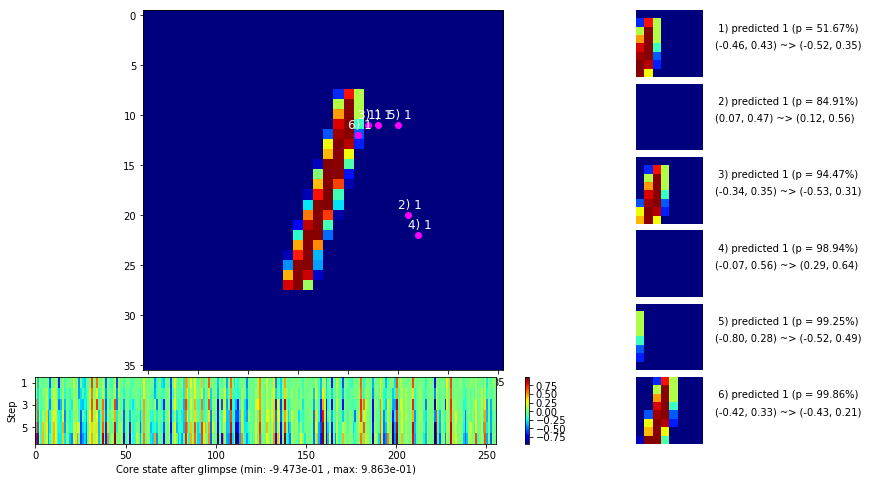

 b   2500/  3000 >> 134.0 ms/b | lr: 8.28e-06 | grad 2norm:  5.32 | grad inf norm:  1.306
       Weights || abs max:  1.19 (22117.10) | mean: -4.66e-03 ( 0.09) | var: 1.65e-02 (12456.33)
        Biases || abs max:  0.95 ( 3836.55) | mean:  1.71e-02 ( 2.11) | var: 6.71e-03 (235450.27)
                  class loss: 0.202 | steps: 2.104 | reward:  0.935 | acc.: 93.55%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.3 ms/b | lr: 8.11e-06 | grad 2norm:  5.39 | grad inf norm:  1.320
       Weights || abs max:  1.19 (23770.74) | mean: -4.65e-03 ( 0.10) | var: 1.65e-02 (56921.43)
        Biases || abs max:  0.95 ( 1849.14) | mean:  1.71e-02 ( 1.29) | var: 6.71e-03 (14597.62)
                  class loss: 0.199 | steps: 2.067 | reward:  0.934 | acc.: 93.40%
                 --------------------------------------------------------------------------------

	Target class: 6 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0

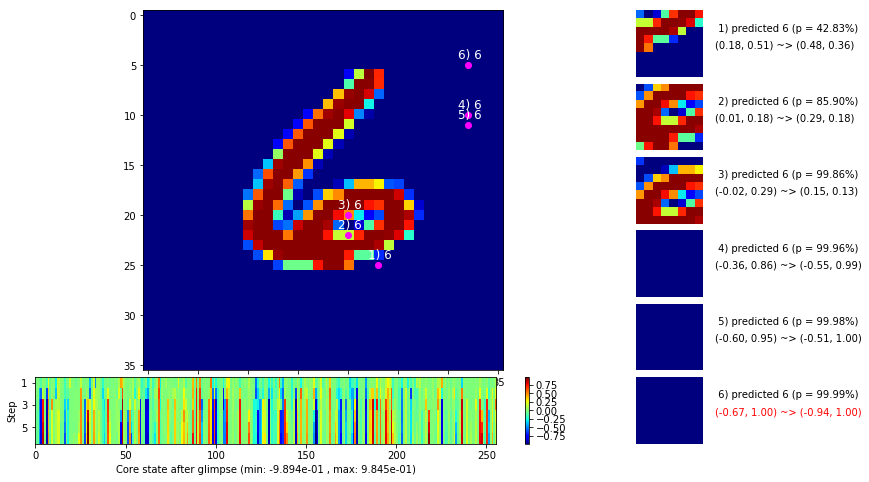

                                          ---===  VALIDATION  ===---

	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


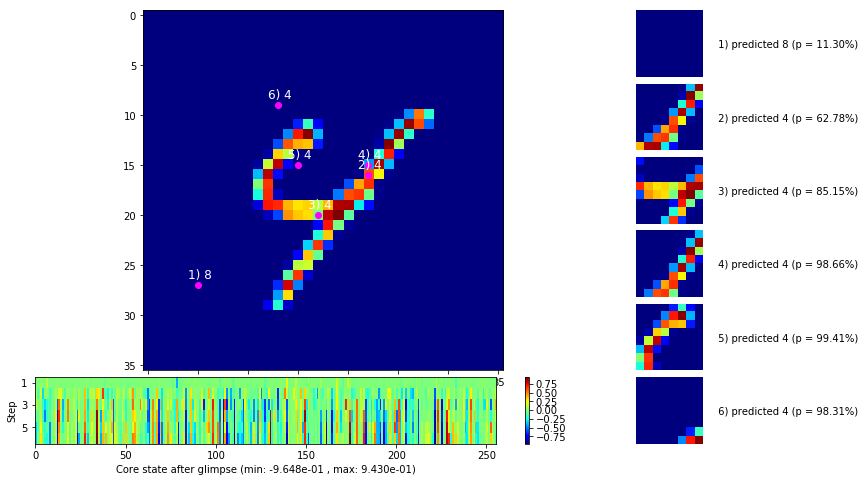


	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


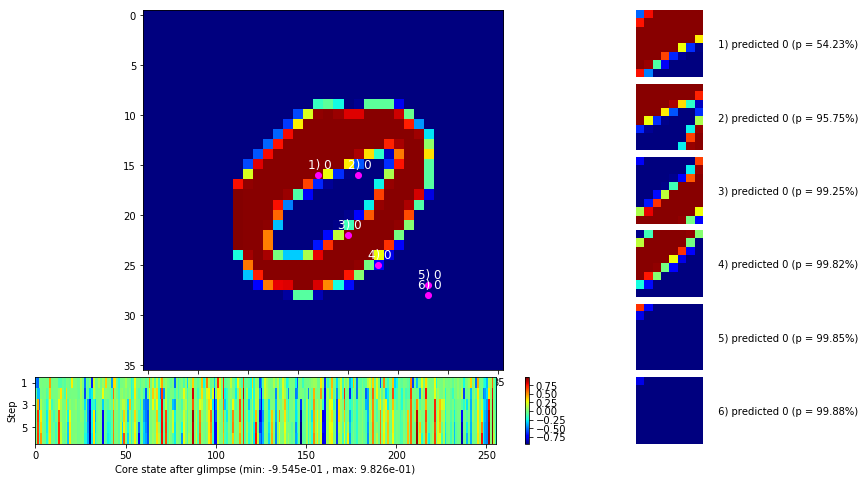

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


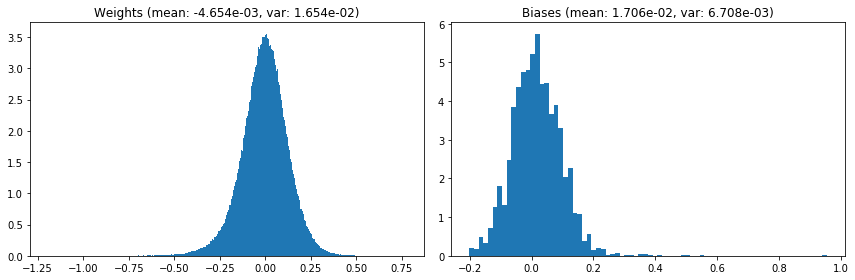

                                      Location network weights and biases


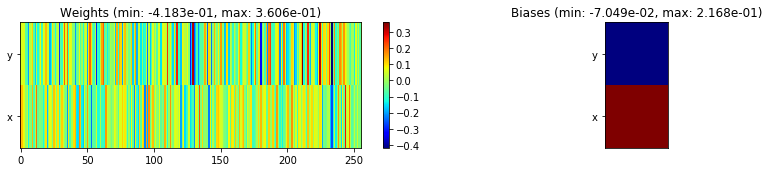

---------------------------------------------------------------------------------------------------------------
Elapsed time:  402.42 sec | TRAIN >> class loss: 0.2011 | steps:  2.096 :( | reward:  0.9328 :( | acc.: 93.283% :(
                          | VAL   >> class loss: 0.2104 | steps:  2.009 :( | reward:  0.9294 :( | acc.: 92.940% :(


Epoch  33/400) lr = 8.033e-06
 b    500/  3000 >> 141.0 ms/b | lr: 7.87e-06 | grad 2norm:  5.45 | grad inf norm:  1.302
       Weights || abs max:  1.19 (18472.00) | mean: -4.65e-03 ( 0.09) | var: 1.65e-02 (10262.82)
        Biases || abs max:  0.95 (  458.73) | mean:  1.71e-02 ( 0.66) | var: 6.71e-03 (  483.84)
                  class loss: 0.204 | steps: 2.096 | reward:  0.931 | acc.: 93.13%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 143.0 ms/b | lr: 7.72e-06 | grad 2norm:  5.21 | grad inf norm:  1.277
       Weights || abs max:  1.19 (88877.14) | mean: -4.65e-03 ( 0.21) |

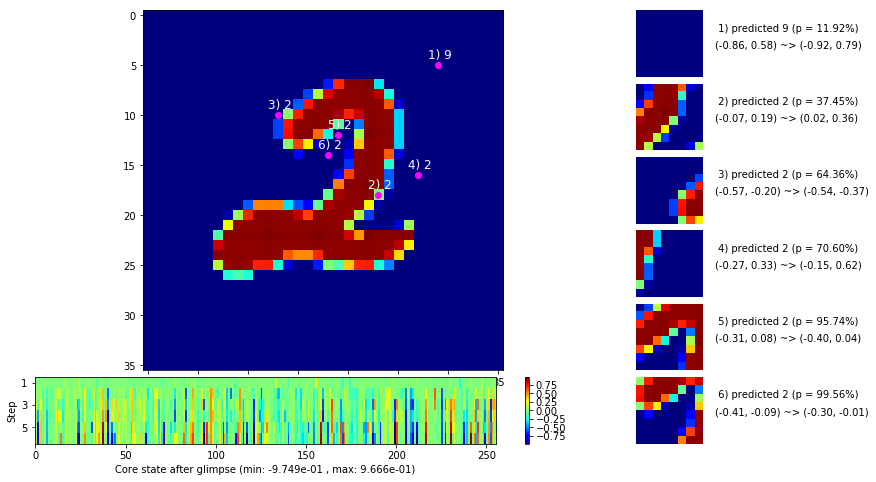

 b   1500/  3000 >> 137.0 ms/b | lr: 7.49e-06 | grad 2norm:  5.54 | grad inf norm:  1.359
       Weights || abs max:  1.19 (36921.32) | mean: -4.65e-03 ( 0.12) | var: 1.65e-02 (28552.23)
        Biases || abs max:  0.95 ( 2311.53) | mean:  1.71e-02 ( 1.57) | var: 6.71e-03 (71801.16)
                  class loss: 0.212 | steps: 2.093 | reward:  0.928 | acc.: 92.84%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 133.2 ms/b | lr: 7.34e-06 | grad 2norm:  5.33 | grad inf norm:  1.294
       Weights || abs max:  1.19 (25898.21) | mean: -4.65e-03 ( 0.10) | var: 1.65e-02 (30273.45)
        Biases || abs max:  0.95 ( 4282.18) | mean:  1.71e-02 ( 2.35) | var: 6.71e-03 (91772.13)
                  class loss: 0.193 | steps: 2.101 | reward:  0.936 | acc.: 93.60%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

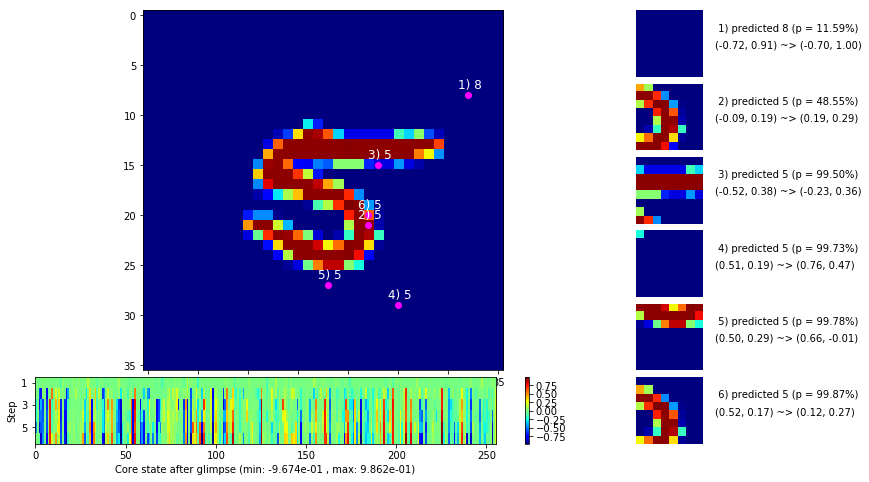

 b   2500/  3000 >> 134.5 ms/b | lr: 7.12e-06 | grad 2norm:  5.36 | grad inf norm:  1.291
       Weights || abs max:  1.19 (17311.09) | mean: -4.65e-03 ( 0.09) | var: 1.65e-02 ( 6495.91)
        Biases || abs max:  0.95 ( 1137.06) | mean:  1.71e-02 ( 1.01) | var: 6.71e-03 ( 6376.53)
                  class loss: 0.197 | steps: 2.090 | reward:  0.934 | acc.: 93.37%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.6 ms/b | lr: 6.98e-06 | grad 2norm:  5.31 | grad inf norm:  1.276
       Weights || abs max:  1.19 (46962.91) | mean: -4.64e-03 ( 0.14) | var: 1.65e-02 (68545.25)
        Biases || abs max:  0.95 ( 2099.84) | mean:  1.71e-02 ( 1.52) | var: 6.71e-03 (26342.49)
                  class loss: 0.197 | steps: 2.088 | reward:  0.937 | acc.: 93.67%
                 --------------------------------------------------------------------------------

	Target class: 8 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

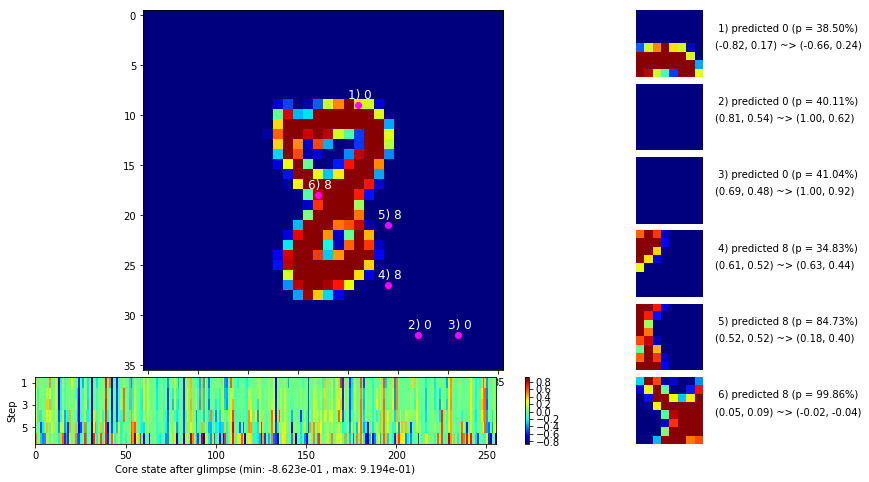

                                          ---===  VALIDATION  ===---

	Target class: 3  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


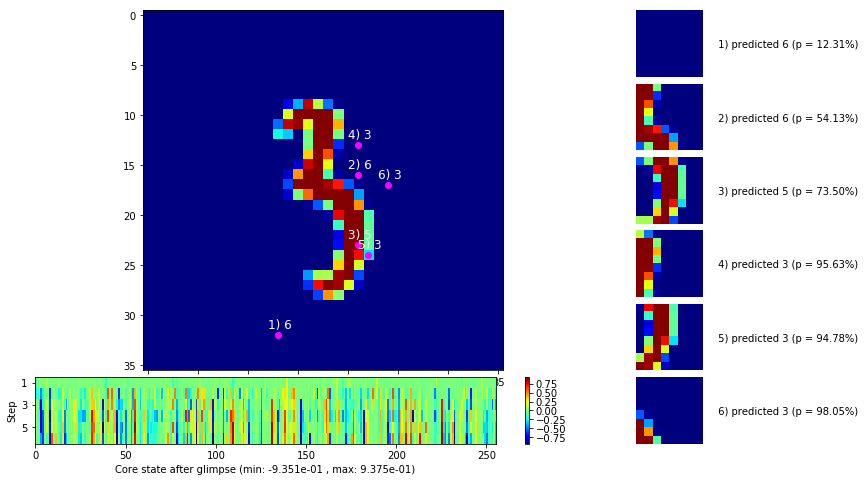


	Target class: 4  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


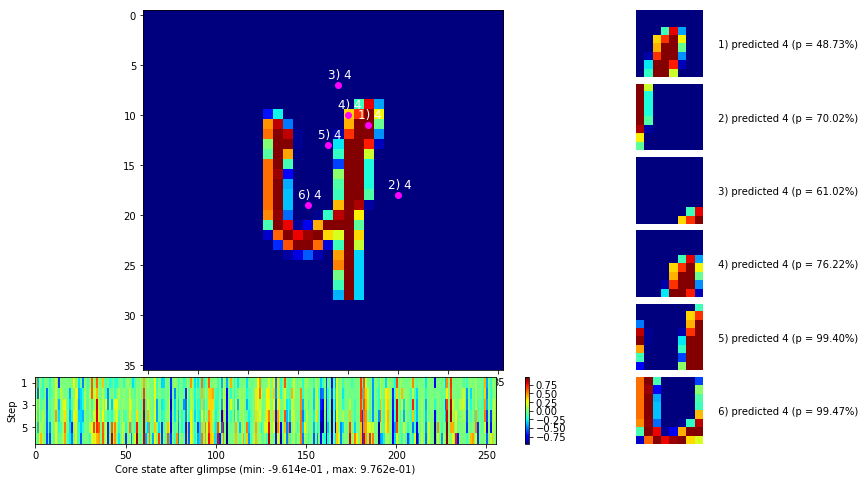

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


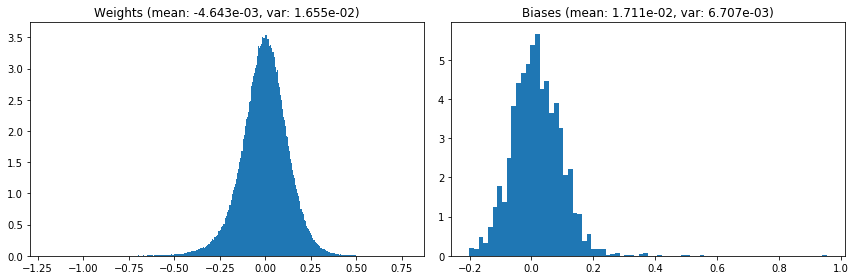

                                      Location network weights and biases


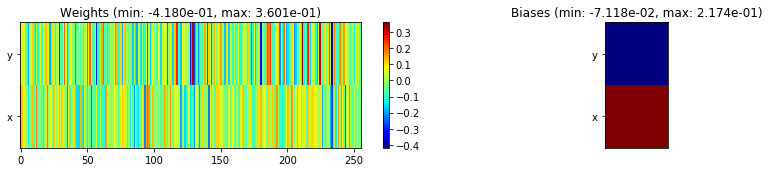

---------------------------------------------------------------------------------------------------------------
Elapsed time:  411.68 sec | TRAIN >> class loss: 0.1984 | steps:  2.094 :( | reward:  0.9338 :( | acc.: 93.378% :(
                          | VAL   >> class loss: 0.2036 | steps:  1.969 :( | reward:  0.9340 :( | acc.: 93.400% :(


Epoch  34/400) lr = 6.909e-06
 b    500/  3000 >> 133.1 ms/b | lr: 6.77e-06 | grad 2norm:  5.42 | grad inf norm:  1.311
       Weights || abs max:  1.19 (17152.33) | mean: -4.64e-03 ( 0.09) | var: 1.65e-02 ( 5972.56)
        Biases || abs max:  0.95 ( 6444.70) | mean:  1.71e-02 ( 3.39) | var: 6.71e-03 (385176.06)
                  class loss: 0.201 | steps: 2.090 | reward:  0.932 | acc.: 93.20%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 132.6 ms/b | lr: 6.64e-06 | grad 2norm:  5.42 | grad inf norm:  1.294
       Weights || abs max:  1.19 (12725.84) | mean: -4.64e-03 ( 0.08) 

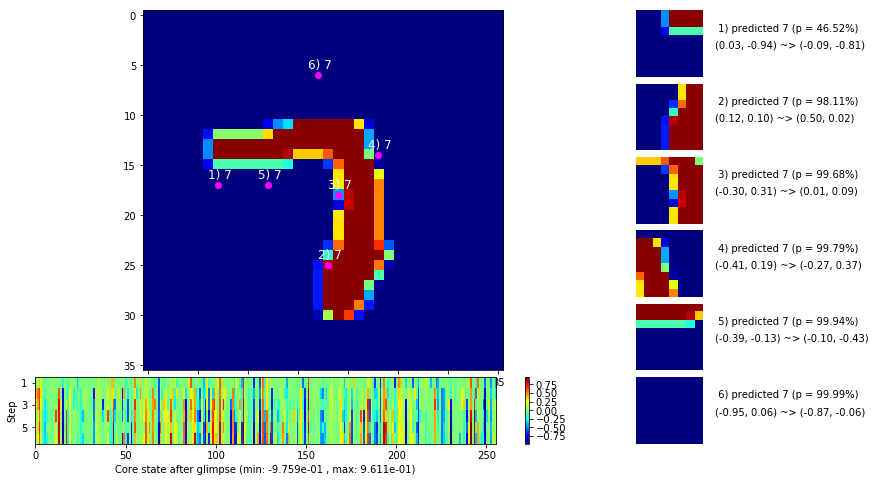

 b   1500/  3000 >> 134.8 ms/b | lr: 6.44e-06 | grad 2norm:  5.52 | grad inf norm:  1.366
       Weights || abs max:  1.19 (27260.66) | mean: -4.64e-03 ( 0.10) | var: 1.65e-02 (35745.77)
        Biases || abs max:  0.95 (10035.19) | mean:  1.71e-02 ( 4.83) | var: 6.71e-03 (2762492.00)
                  class loss: 0.210 | steps: 2.117 | reward:  0.930 | acc.: 93.03%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 136.4 ms/b | lr: 6.31e-06 | grad 2norm:  5.50 | grad inf norm:  1.318
       Weights || abs max:  1.19 (20004.03) | mean: -4.64e-03 ( 0.09) | var: 1.65e-02 ( 6019.53)
        Biases || abs max:  0.95 ( 5132.84) | mean:  1.71e-02 ( 3.14) | var: 6.71e-03 (389201.06)
                  class loss: 0.200 | steps: 2.112 | reward:  0.932 | acc.: 93.21%
                 --------------------------------------------------------------------------------

	Target class: 4 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1

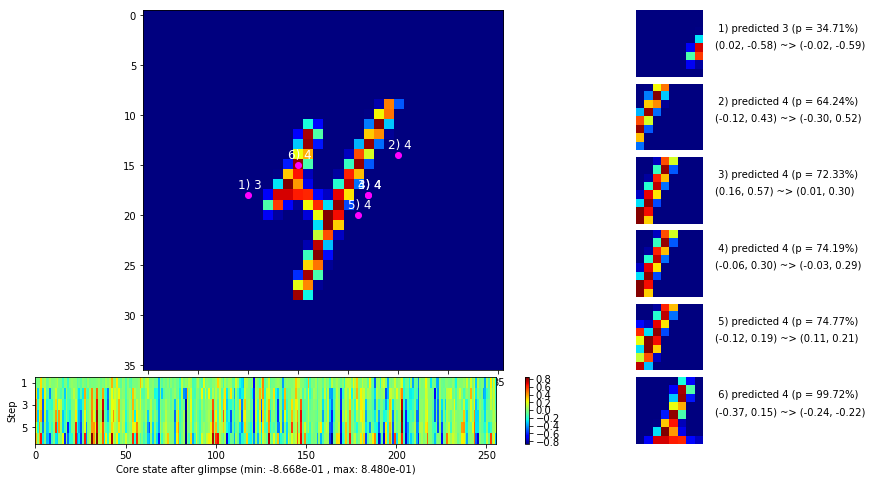

 b   2500/  3000 >> 143.9 ms/b | lr: 6.12e-06 | grad 2norm:  5.45 | grad inf norm:  1.303
       Weights || abs max:  1.19 (13988.60) | mean: -4.64e-03 ( 0.08) | var: 1.65e-02 ( 2064.15)
        Biases || abs max:  0.95 ( 1950.49) | mean:  1.71e-02 ( 1.48) | var: 6.71e-03 (32146.44)
                  class loss: 0.206 | steps: 2.097 | reward:  0.931 | acc.: 93.10%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.7 ms/b | lr: 6.00e-06 | grad 2norm:  5.51 | grad inf norm:  1.331
       Weights || abs max:  1.19 (38375.48) | mean: -4.64e-03 ( 0.12) | var: 1.65e-02 (130141.28)
        Biases || abs max:  0.95 ( 4050.05) | mean:  1.71e-02 ( 2.22) | var: 6.71e-03 (566161.31)
                  class loss: 0.202 | steps: 2.111 | reward:  0.931 | acc.: 93.08%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.

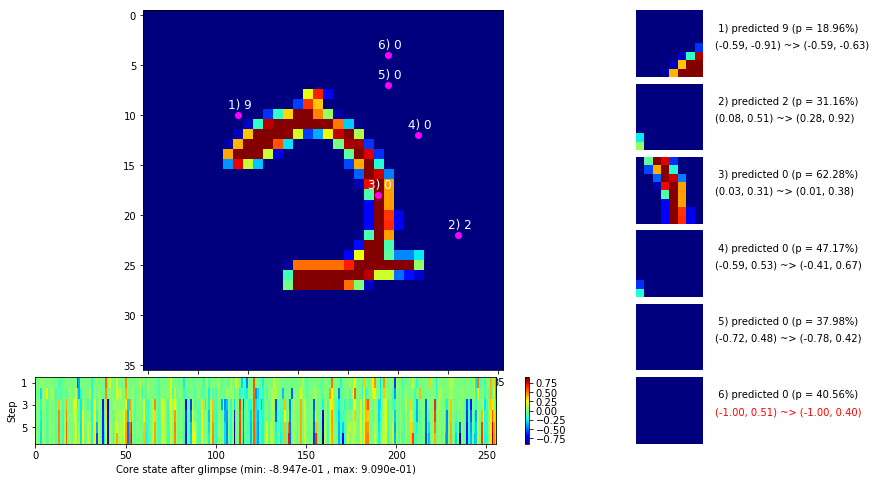

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


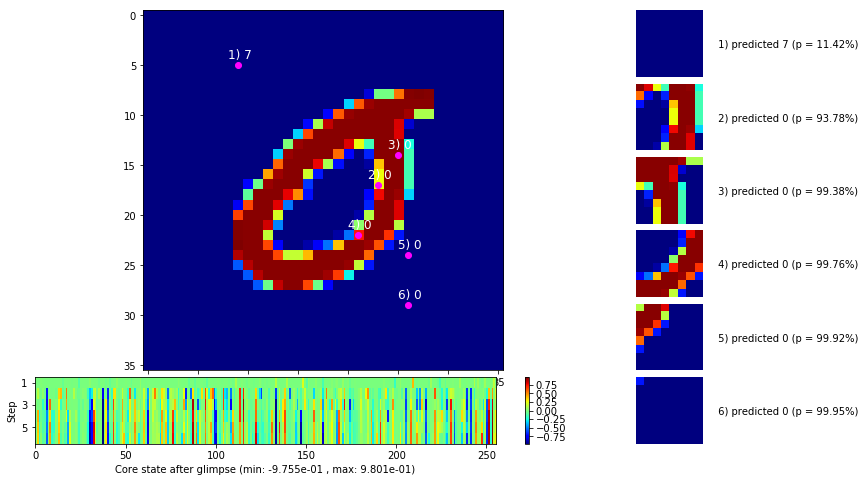


	Target class: 6  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


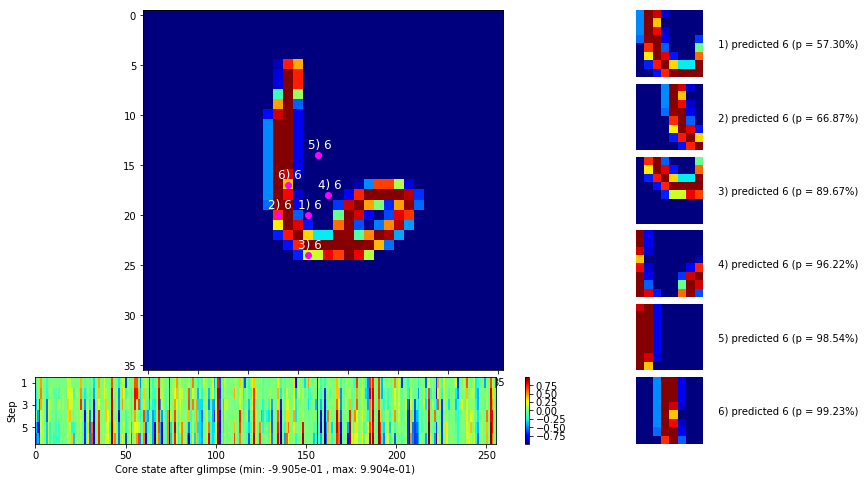

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


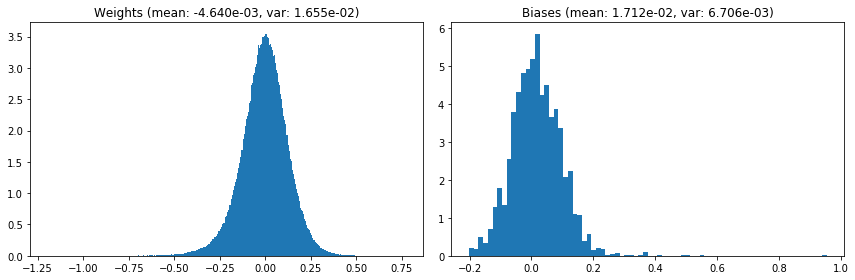

                                      Location network weights and biases


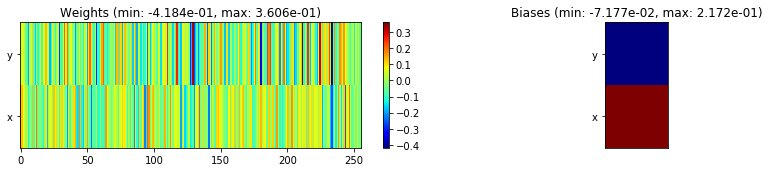

---------------------------------------------------------------------------------------------------------------
Elapsed time:  407.88 sec | TRAIN >> class loss: 0.2039 | steps:  2.105 :( | reward:  0.9316 :( | acc.: 93.157% :(
                          | VAL   >> class loss: 0.2067 | steps:  1.990 :( | reward:  0.9314 :( | acc.: 93.140% :(


Epoch  35/400) lr = 5.942e-06
 b    500/  3000 >> 133.4 ms/b | lr: 5.82e-06 | grad 2norm:  5.19 | grad inf norm:  1.287
       Weights || abs max:  1.19 (11138.46) | mean: -4.64e-03 ( 0.07) | var: 1.65e-02 ( 1633.75)
        Biases || abs max:  0.95 ( 2104.41) | mean:  1.71e-02 ( 1.41) | var: 6.71e-03 (69944.92)
                  class loss: 0.184 | steps: 2.092 | reward:  0.936 | acc.: 93.65%
                 --------------------------------------------------------------------------------
 b   1000/  3000 >> 134.3 ms/b | lr: 5.71e-06 | grad 2norm:  5.65 | grad inf norm:  1.354
       Weights || abs max:  1.19 (41852.85) | mean: -4.64e-03 ( 0.13) |

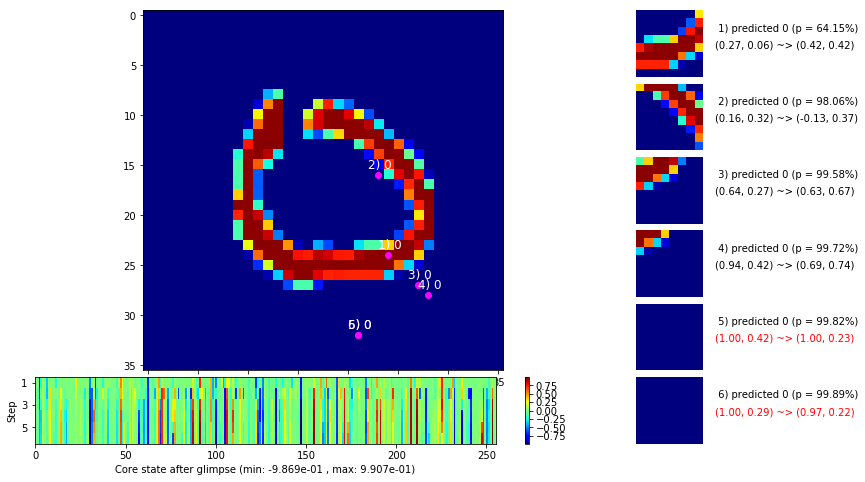

 b   1500/  3000 >> 133.9 ms/b | lr: 5.54e-06 | grad 2norm:  5.50 | grad inf norm:  1.296
       Weights || abs max:  1.19 (60690.67) | mean: -4.64e-03 ( 0.16) | var: 1.65e-02 (108571.30)
        Biases || abs max:  0.95 ( 2865.51) | mean:  1.71e-02 ( 1.96) | var: 6.71e-03 (54871.02)
                  class loss: 0.206 | steps: 2.101 | reward:  0.932 | acc.: 93.17%
                 --------------------------------------------------------------------------------
 b   2000/  3000 >> 134.3 ms/b | lr: 5.43e-06 | grad 2norm:  5.29 | grad inf norm:  1.264
       Weights || abs max:  1.19 (37201.67) | mean: -4.64e-03 ( 0.12) | var: 1.65e-02 (18584.15)
        Biases || abs max:  0.95 ( 3751.55) | mean:  1.71e-02 ( 2.07) | var: 6.71e-03 (571827.94)
                  class loss: 0.190 | steps: 2.078 | reward:  0.937 | acc.: 93.66%
                 --------------------------------------------------------------------------------

	Target class: 5 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.

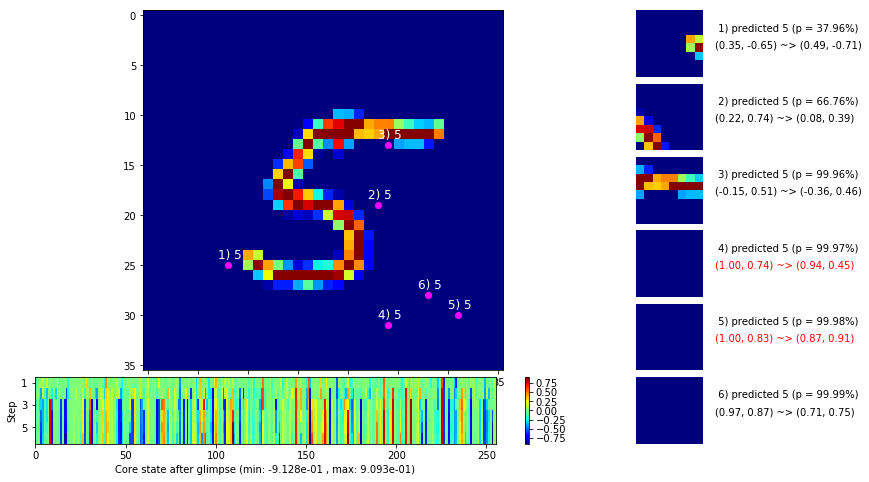

 b   2500/  3000 >> 135.3 ms/b | lr: 5.27e-06 | grad 2norm:  5.61 | grad inf norm:  1.336
       Weights || abs max:  1.19 (12325.13) | mean: -4.63e-03 ( 0.07) | var: 1.66e-02 ( 3943.34)
        Biases || abs max:  0.95 ( 6932.20) | mean:  1.71e-02 ( 3.39) | var: 6.71e-03 (2043248.88)
                  class loss: 0.212 | steps: 2.128 | reward:  0.930 | acc.: 92.96%
                 --------------------------------------------------------------------------------
 b   3000/  3000 >> 133.9 ms/b | lr: 5.16e-06 | grad 2norm:  5.48 | grad inf norm:  1.294
       Weights || abs max:  1.19 (37815.34) | mean: -4.63e-03 ( 0.12) | var: 1.66e-02 (63740.57)
        Biases || abs max:  0.95 (24802.55) | mean:  1.71e-02 (17.28) | var: 6.71e-03 (108749256.00)
                  class loss: 0.196 | steps: 2.083 | reward:  0.932 | acc.: 93.24%
                 --------------------------------------------------------------------------------

	Target class: 2 | Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0

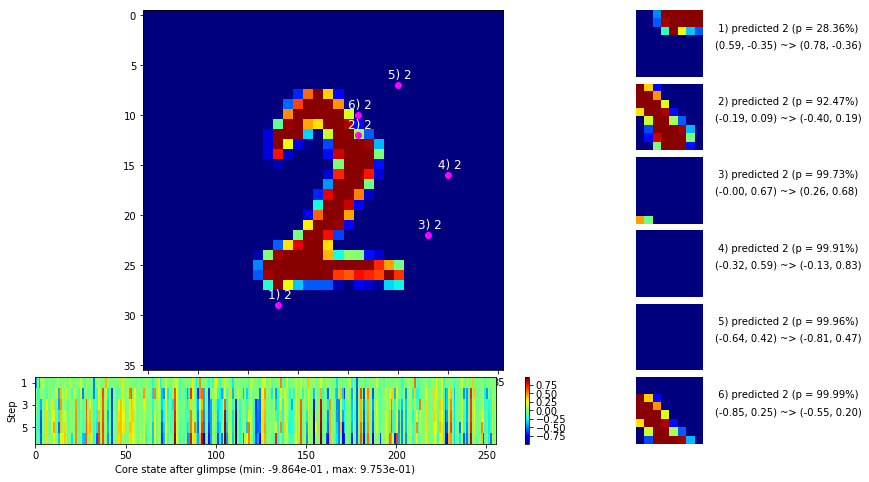

                                          ---===  VALIDATION  ===---

	Target class: 0  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


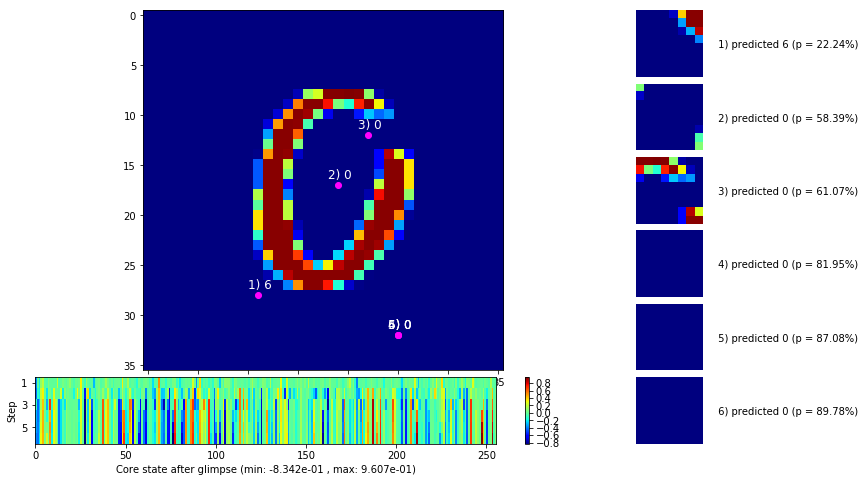


	Target class: 5  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


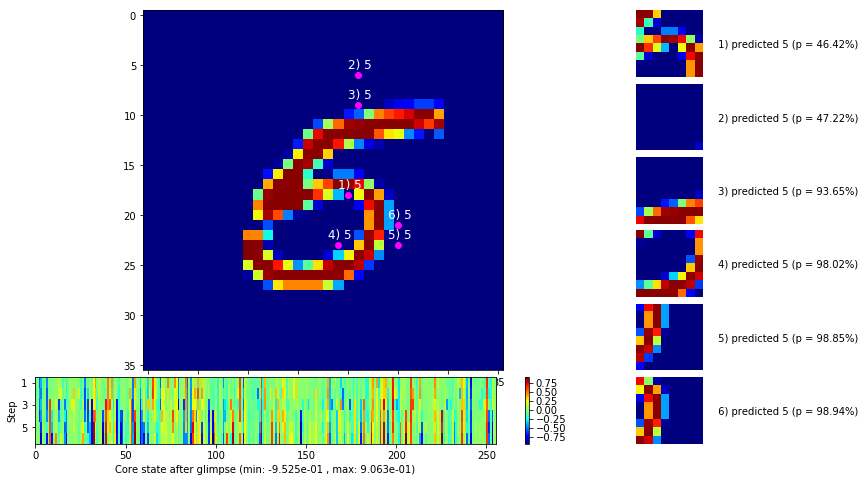

                                    ---===  MODEL PARAM DIAGNOSTICS  ===---


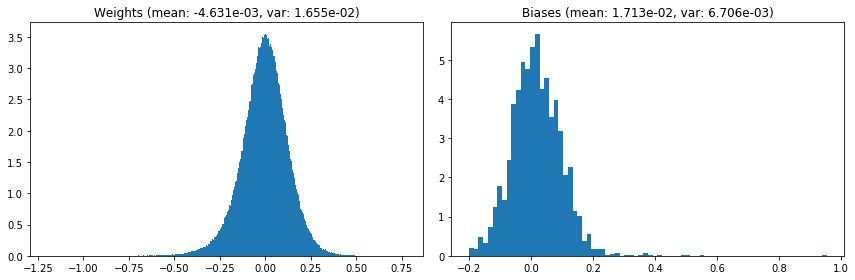

                                      Location network weights and biases


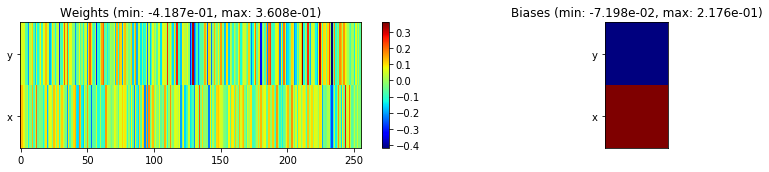

---------------------------------------------------------------------------------------------------------------
Elapsed time:  403.07 sec | TRAIN >> class loss: 0.2011 | steps:  2.098 :( | reward:  0.9325 :( | acc.: 93.247% :(
                          | VAL   >> class loss: 0.2034 | steps:  2.021 :( | reward:  0.9314 :( | acc.: 93.140% :(



			---~~~=== End of training ===~~~---

Evaluating on the TEST dataset...

	Target class: 6  |  Discounted rewards: [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


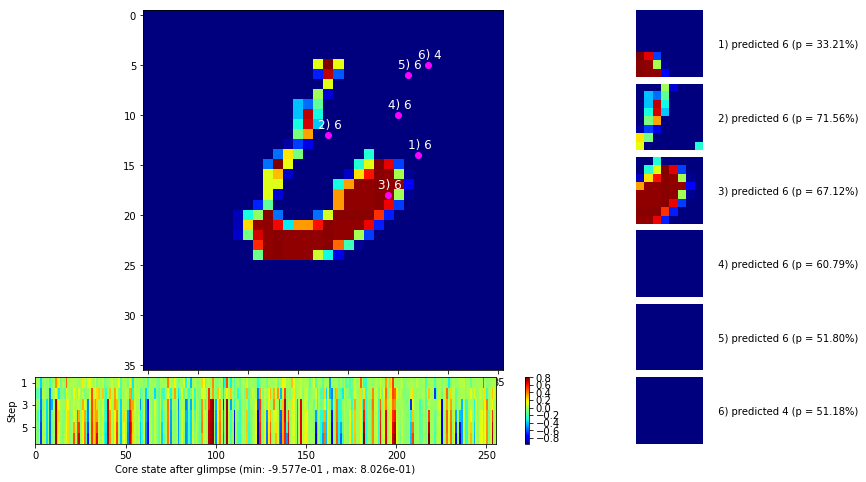


	Target class: 7  |  Discounted rewards: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


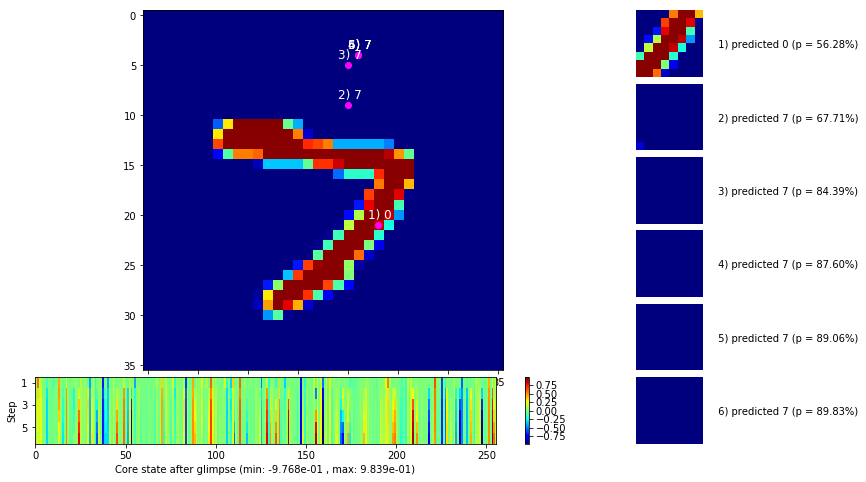

	>> class loss: 0.2080 | steps:  2.004 | reward:  0.9264 | acc.: 92.640%


In [7]:
model_info, train_info, val_info, test_info, epochs = train_eval_loop(
    model = model, epochs = num_epochs, image_size = image_size,
    train_data = train_data, val_data = val_data, test_data = test_data,
    padding = padding, optimizer = optimizer, lr_scheduler = lr_scheduler,
    class_criterion = class_criterion, error_penalty = error_penalty,
    loc_std = loc_std, random_start_loc = random_start_loc, gamma = gamma,
    grad_clip = grad_clip, steps_per_epoch = steps_per_epoch,
    max_ep_len = max_ep_len, log_freq = log_freq, viz_freq = viz_freq,
    early_stopping = early_stopping, eval_viz_freq = eval_viz_freq
)

In [8]:
print('Trained over %d epochs\n' % epochs)

for name, best_stats in zip(['train', 'val'], [train_info['bests'], val_info['bests']]):
    print('Best %s stats:' % name)
    for k, v in best_stats.items():
        print('    %s: %.2f (epoch %d)' % (k, v[k], v['epoch']))
    print('')

Trained over 35 epochs

Best train stats:
    steps: 2.09 (epoch 27)
    reward: 0.94 (epoch 10)
    accuracy: 0.94 (epoch 10)

Best val stats:
    steps: 1.94 (epoch 24)
    reward: 0.94 (epoch 24)
    accuracy: 0.94 (epoch 24)



### Training curves

In [9]:
epoch_range = range(1, epochs+1)
train_col = (1, 0, 0); train_err_col = (1, 0.1, 0.1)
val_col = (0, 0, 1); val_err_col = (0.1, 0.1, 1)

Text(0.5,1,'Weight and bias values over training time')

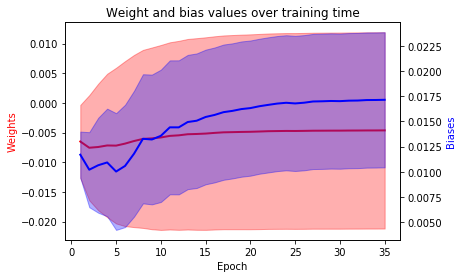

In [10]:
wts_mean = np.array(model_info['weights']['mean'])
wts_var = np.array(model_info['weights']['var'])
bias_mean = np.array(model_info['biases']['mean'])
bias_var = np.array(model_info['biases']['var'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_mean, color = train_col, linewidth = 2)
wts_ax.fill_between(epoch_range,
    wts_mean - wts_var, wts_mean + wts_var,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_mean, color = val_col, linewidth = 2)
bias_ax.fill_between(epoch_range,
    bias_mean - bias_var, bias_mean + bias_var,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Weight and bias values over training time')

Text(0.5,1,'Max absolute weight and bias values over training time')

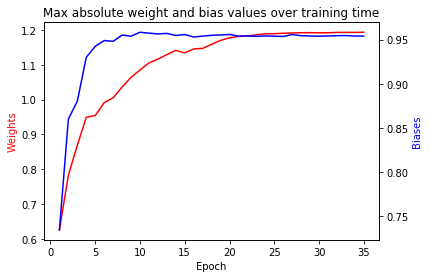

In [11]:
wts_absmax = np.array(model_info['weights']['abs max'])
bias_absmax = np.array(model_info['biases']['abs max'])

fig, wts_ax = plt.subplots()
wts_ax.plot(epoch_range, wts_absmax, color = train_col)
wts_ax.set_xlabel('Epoch')
wts_ax.set_ylabel('Weights', color = train_col)

bias_ax = wts_ax.twinx()
bias_ax.plot(epoch_range, bias_absmax, color = val_col)
bias_ax.set_ylabel('Biases', color = val_col)

plt.title('Max absolute weight and bias values over training time')

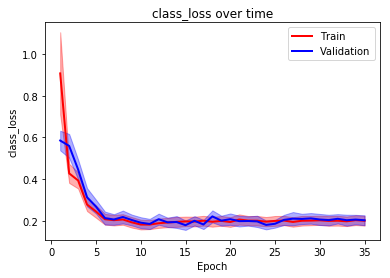

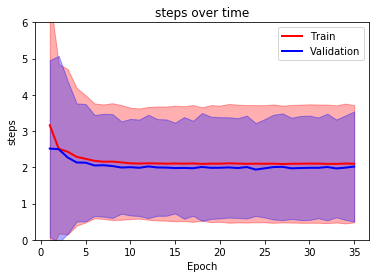

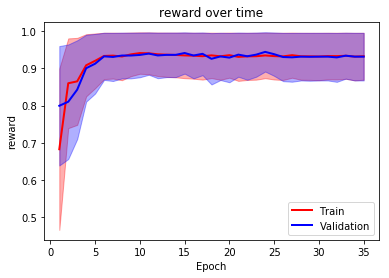

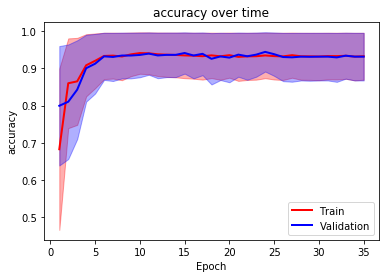

In [12]:
things_to_plot = ['class_loss', 'steps', 'reward', 'accuracy']
for thing in things_to_plot:
    train_avg = np.array([info['averages'][thing] for info in train_info['stats']])
    train_err = np.array([np.var(info['histories'][thing]) for info in train_info['stats']])
    
    val_avg = np.array([info['averages'][thing] for info in val_info['stats']])
    val_err = np.array([np.var(info['histories'][thing]) for info in val_info['stats']])
    
    plt.plot(epoch_range, train_avg, color = train_col, linewidth = 2)
    plt.plot(epoch_range, val_avg, color = val_col, linewidth = 2)
    plt.fill_between(epoch_range,
        train_avg - train_err, train_avg + train_err, alpha = 0.35,
        edgecolor = train_col, facecolor = train_err_col
    )
    plt.fill_between(epoch_range,
        val_avg - val_err, val_avg + val_err, alpha = 0.35,
        edgecolor = val_col, facecolor = val_err_col
    )
    if thing == 'steps':
        plt.ylim([0, 6])
    plt.legend(['Train', 'Validation'], loc = 'upper right' if thing in ['class_loss', 'steps'] else 'lower right')
    plt.xlabel('Epoch'); plt.ylabel(thing)
    plt.title('%s over time' % thing)
    plt.show()
    print('')

Text(0.5,1,'Gradient norms over training time')

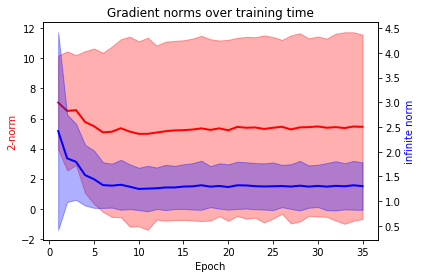

In [13]:
# Gradient stats
grad_2norm = np.array([info['averages']['grad_2norm'] for info in train_info['stats']])
grad_inf_norm = np.array([info['averages']['grad_inf_norm'] for info in train_info['stats']])
grad_2norm_err = np.array([np.var(info['histories']['grad_2norm']) for info in train_info['stats']])
grad_inf_norm_err = np.array([np.var(info['histories']['grad_inf_norm']) for info in train_info['stats']])

fig, pnorm_ax = plt.subplots()
pnorm_ax.plot(epoch_range, grad_2norm, color = train_col, linewidth = 2)
pnorm_ax.fill_between(epoch_range,
    grad_2norm - grad_2norm_err, grad_2norm + grad_2norm_err,
    alpha = 0.35, edgecolor = train_col, facecolor = train_err_col
)
pnorm_ax.set_xlabel('Epoch');
pnorm_ax.set_ylabel('2-norm', color = train_col)

infnorm_ax = pnorm_ax.twinx()
infnorm_ax.plot(epoch_range, grad_inf_norm, color = val_col, linewidth = 2)
infnorm_ax.fill_between(epoch_range,
    grad_inf_norm - grad_inf_norm_err, grad_inf_norm + grad_inf_norm_err,
    alpha = 0.35, edgecolor = val_col, facecolor = val_err_col
)
infnorm_ax.set_ylabel('infinite norm', color = val_col)

plt.title('Gradient norms over training time')